## **FASTAI TRANSFER LEARNING USING MOBILENETV2**

---



 
*   MobileNetv2 is implemented By GOOGLE, which is a large but optimised network so that it can be handled with/without GPU support in normal android phones.
* The PAK dataset has been updated using some of the additional image processing data augmentation and resizing technique into 224, 224. The dataset size has been increased from 915 to 6401 items.
* This notebook is dedicated to the basic architecture and building block of the deep learning model which we will be applying for training. The resultant model will be fed into an app that will classify the image.

In [ ]:
!nvidia-smi

Mon Apr  4 14:58:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    30W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#Connecting colab with gdrive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#unzip the file
!unzip "/content/drive/MyDrive/HACKATHON/Dataset/Dataset_v2.zip"

Streaming output truncated to the last 5000 lines.
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44).png_0_1982.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44).png_0_31.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44).png_0_7782.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44).png_0_9107.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44).png_0_9650.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44)crop.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (44)noisy.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png_0_1931.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png_0_4294.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png_0_6384.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png_0_7923.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png_0_8501.png  
  inflating: Dataset/Dataset/Mori/Mrigal-Head (45).png_0_9437.png  
  inflating: Dataset/Da

In [ ]:
#!rm -rf "/content/Output"

In [ ]:
#divide the dataset into train, validation and test
!pip install split-folders tqdm
import splitfolders
splitfolders.ratio("/content/drive/MyDrive/HACKATHON/Dataset/Tuna_Species", output="Output", seed=1337, ratio=(.7,.2,.1), group_prefix=None)

Copying files: 13 files [00:12,  1.18 files/s]

KeyboardInterrupt: ignored

1.0.61


/usr/local/lib/python3.7/dist-packages/fastai/vision/transform.py:247: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  return _solve_func(B,A)[0][:,0]
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if 

['Catla', 'Cyprinus carpio', 'Grass Carp', 'Mori', 'Rohu', 'Silver'] 6
5758 1642


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256

epoch,train_loss,valid_loss,accuracy,time
0,0.830765,0.246269,0.917174,01:49
1,0.401289,0.150010,0.947016,01:41
2,0.261731,0.117742,0.956760,01:41
3,0.149787,0.075223,0.976857,01:41
4,0.104411,0.059876,0.978685,01:41
5,0.094895,0.050948,0.983557,01:41
6,0.055272,0.033508,0.989647,01:40
7,0.054296,0.022873,0.995128,01:41
8,0.032991,0.025443,0.990256,01:41
9,0.026373,0.023131,0.991474,01:41


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


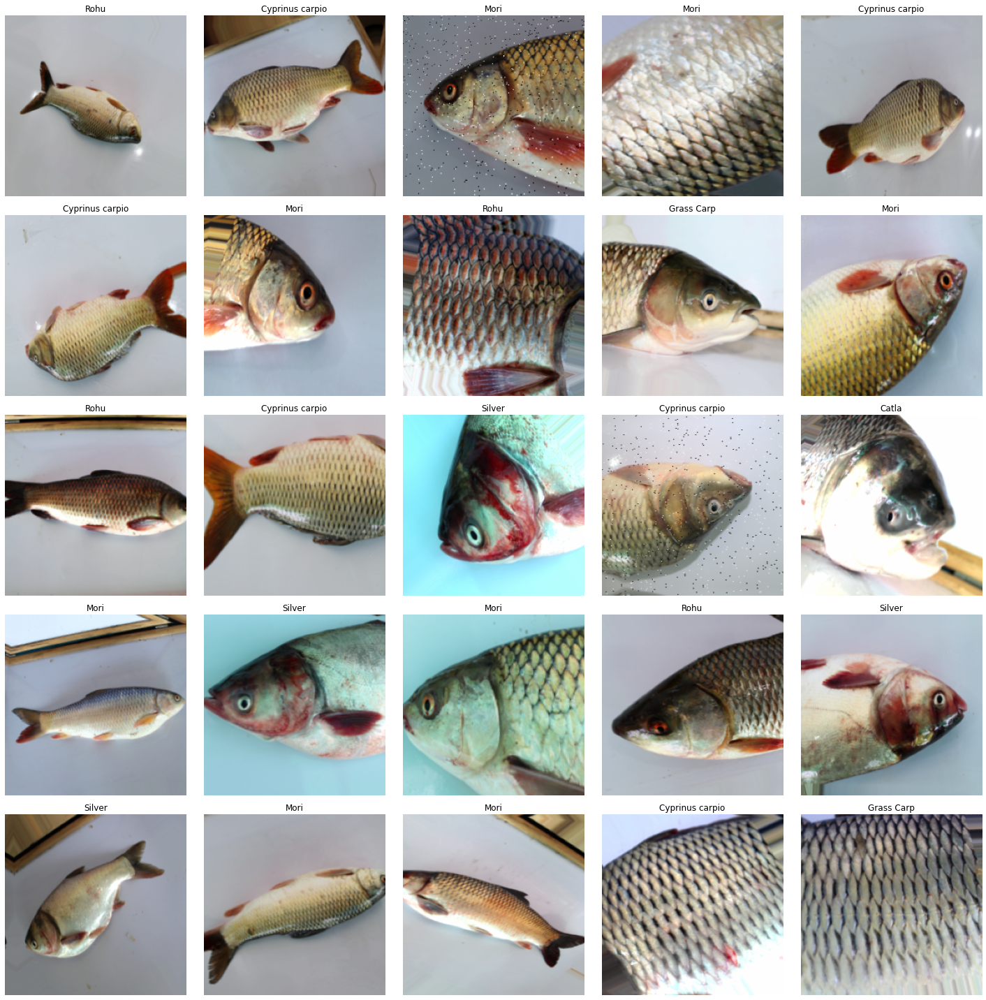

In [ ]:
#ResNet50 Model
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
import fastai
print(fastai.__version__)
path=Path("/content/Output")
data = ImageDataBunch.from_folder(path, train='train', valid='val', ds_tfms=get_transforms(do_flip=False), size=224, bs=64, num_workers=8)
data.show_batch()
# See the classes and count of classes in your dataset
print(data.classes,data.c)
print(len(data.train_ds), len(data.valid_ds))
#learn = cnn_learner(data, models.mobilenet_v2, metrics = error_rate)
learn = cnn_learner(data, models.resnet50, metrics = accuracy)
print(learn.model)

# def convert_act_cls(model, layer_type_old, layer_type_new):
#     conversion_count = 0
#     for name, module in reversed(model._modules.items()):
#         if len(list(module.children())) > 0:
#             # recurse
#             model._modules[name] = convert_act_cls(module, layer_type_old, layer_type_new)

#         if type(module) == layer_type_old:
#             layer_old = module
#             layer_new = layer_type_new
#             model._modules[name] = layer_new

#     return model
# learn.model = convert_act_cls(learn.model, nn.softmax, sigmoid())

learn.fit_one_cycle(15)

In [ ]:
#Saving the model
model_path=Path('/content/drive/MyDrive/HACKATHON/ModelResNet50_v2').absolute()
learn.export(model_path / 'export.pkl')
learn.save(model_path / 'export')

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


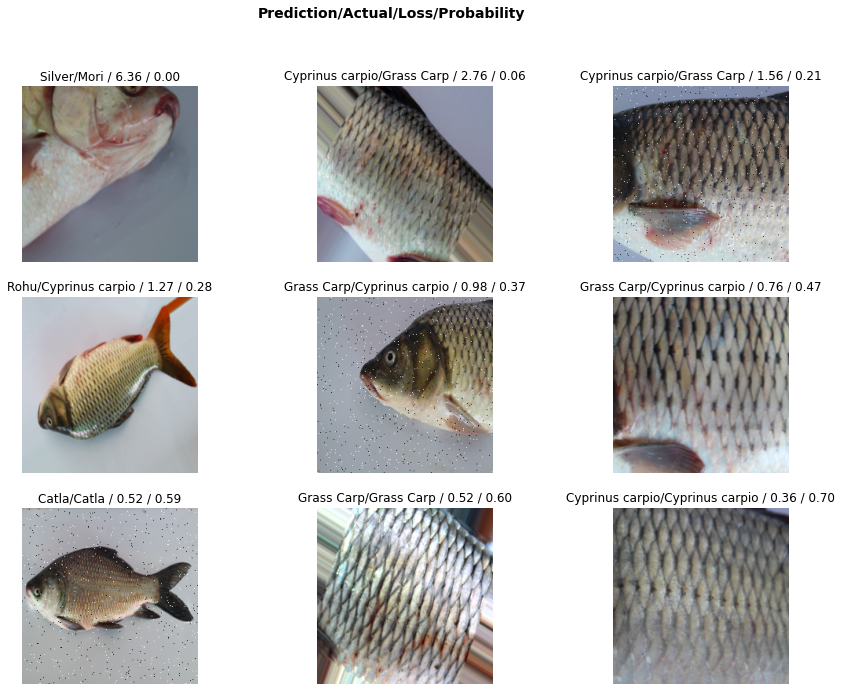

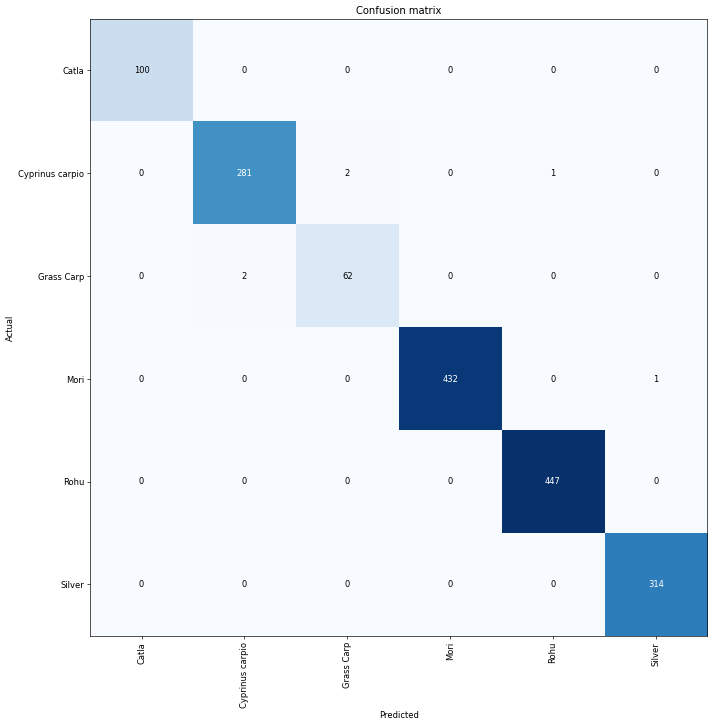

In [ ]:
#Classification interpretation object
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,11))
#Confusion Matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

epoch,train_loss,valid_loss,accuracy,time


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.58E-06
Min loss divided by 10: 1.45E-06


epoch,train_loss,valid_loss,accuracy,time
0,0.283010,0.160924,0.950670,02:14
1,0.073908,0.021193,0.993910,02:14


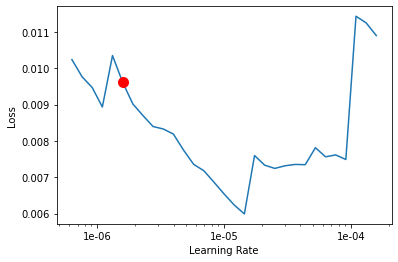

In [ ]:
#@title
learn.unfreeze()

# Find the optimal learning rate and plot a visual
learn.lr_find()
learn.recorder.plot(suggestion=True)
learn.fit_one_cycle(2)

epoch,train_loss,valid_loss,error_rate,time


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Failed to compute the gradients, there might not be enough points.


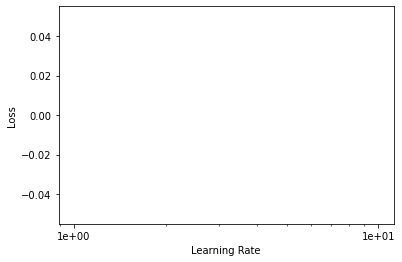

In [ ]:
#@title
#Check if Optimal LR is changing
learn.lr_find()
learn.recorder.plot(suggestion=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


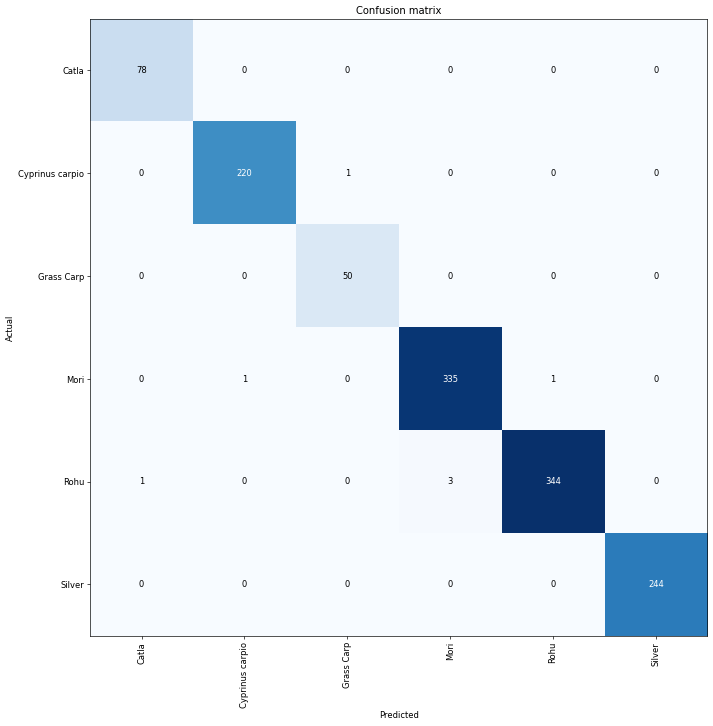

In [ ]:
#@title
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
#Loading the Trained Model
learn=load_learner("/content/drive/MyDrive/HACKATHON/ModelResNet50_v2")
model=learn.model.eval()
path = "/content/Mixed/"
dirs = os.listdir(path)
list1=[]
for item in dirs:
  if os.path.isfile(path+item):
    img=open_image(path+item)
    print(item)
    img.resize(224)
    pred=learn.predict(img)
    cls=int(pred[1])
    print(pred,cls)
    print("Result: ")
    if(cls==0):
      print("Catla")
    elif(cls==1):
      print("Cyprinus Carpio")
    elif(cls==2):
      print("Grass Carp")
    elif(cls==3):
      print("Mori")
    elif(cls==4):
      print("Rohu")
    else:
      print('Silver')
    print(max(pred[2]*100))
    list1.append(max(pred[2]*100))
    img
avgscore = sum(list1) / len(dirs)
print("Average score:", avgscore)

Rohu-Body (2).png_0_3052.png
(Category tensor(0), tensor(0), tensor([7.5628e-01, 1.1611e-05, 4.1719e-04, 5.7183e-10, 2.4329e-01, 1.0480e-06])) 0
Result: 
Catla
tensor(75.6280)
Gulfaam-Body (35).png
(Category tensor(1), tensor(1), tensor([1.3111e-13, 1.0000e+00, 3.4845e-10, 2.9307e-13, 1.6589e-12, 6.4718e-11])) 1
Result: 
Cyprinus Carpio
tensor(100.)
Silver-Body (26).png_0_8888.png
(Category tensor(5), tensor(5), tensor([8.1559e-11, 5.4397e-09, 2.2002e-10, 4.1138e-12, 7.0192e-18, 1.0000e+00])) 5
Result: 
Silver
tensor(100.)
Grass-Body (7).png_0_3085.png
(Category tensor(2), tensor(2), tensor([5.8745e-06, 3.4585e-05, 9.9990e-01, 2.0915e-07, 5.9069e-05, 1.8385e-08])) 2
Result: 
Grass Carp
tensor(99.9900)
Catla-Body (16).png_0_6985.png
(Category tensor(0), tensor(0), tensor([1.0000e+00, 2.0071e-12, 5.0947e-08, 7.3657e-13, 1.0358e-06, 6.8912e-09])) 0
Result: 
Catla
tensor(99.9999)
Mrigal-Body (19).png
(Category tensor(0), tensor(0), tensor([5.3995e-01, 5.2496e-05, 2.3545e-05, 2.8748e-02, 3.

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


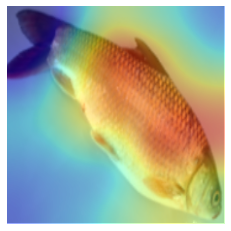

In [ ]:
#For better Identification use GradCAM to use feature Maps
b, _ =learn.data.one_item(img,denorm=False)
with hook_output(model[0]) as hook_a:
  with hook_output(model[0],grad=True) as hook_g:
    preds=model(b)
    preds[0,cls].backward()
acts=hook_a.stored[0].cpu()
grad=hook_g.stored[0][0].cpu()
grad_chan=grad.mean(1).mean(1)
mult=((acts*grad_chan[..., None, None])).sum(0)
_, ax=plt.subplots()
img.show(ax)
ax.imshow(mult, alpha=0.4, extent=(0,224,224,0), interpolation='bicubic', cmap='jet')

1.0.61


/usr/local/lib/python3.7/dist-packages/fastai/vision/transform.py:247: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  return _solve_func(B,A)[0][:,0]
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if 

['Catla', 'Cyprinus carpio', 'Grass Carp', 'Mori', 'Rohu', 'Silver'] 6
5758 1642


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


  0%|          | 0.00/13.6M [00:00<?, ?B/s]

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): ConvNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): ConvNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): ConvNormActivation(
            (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), 

epoch,train_loss,valid_loss,accuracy,time
0,0.947247,0.271377,0.904994,00:47
1,0.430569,0.129126,0.958587,00:45
2,0.236878,0.100168,0.968331,00:45
3,0.159118,0.076285,0.971985,00:45
4,0.115349,0.036152,0.986602,00:45
5,0.079202,0.050534,0.980512,00:45
6,0.063836,0.030117,0.988429,00:44
7,0.044256,0.019341,0.994519,00:44
8,0.035249,0.017605,0.995737,00:44
9,0.036990,0.013659,0.996955,00:44


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


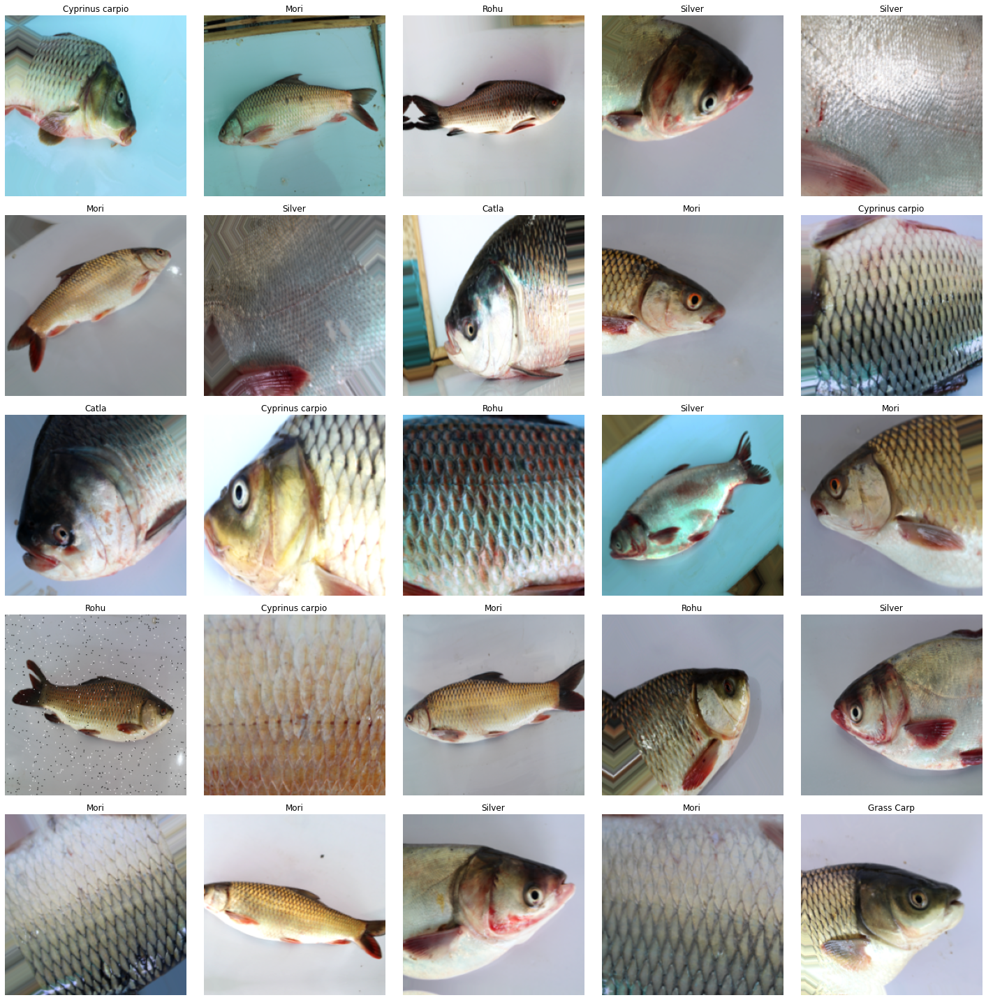

In [ ]:
#MobileNetv2 Model
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
import fastai
print(fastai.__version__)
path=Path("/content/Output")
data = ImageDataBunch.from_folder(path, train='train', valid='val', ds_tfms=get_transforms(do_flip=False), size=224, bs=64, num_workers=8)
data.show_batch()
# See the classes and count of classes in your dataset
print(data.classes,data.c)
print(len(data.train_ds), len(data.valid_ds))
#learn = cnn_learner(data, models.mobilenet_v2, metrics = error_rate)
learn = cnn_learner(data, models.mobilenet_v2, metrics = accuracy)
print(learn.model)

# def convert_act_cls(model, layer_type_old, layer_type_new):
#     conversion_count = 0
#     for name, module in reversed(model._modules.items()):
#         if len(list(module.children())) > 0:
#             # recurse
#             model._modules[name] = convert_act_cls(module, layer_type_old, layer_type_new)

#         if type(module) == layer_type_old:
#             layer_old = module
#             layer_new = layer_type_new
#             model._modules[name] = layer_new

#     return model
# learn.model = convert_act_cls(learn.model, nn.softmax, sigmoid())

learn.fit_one_cycle(15)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


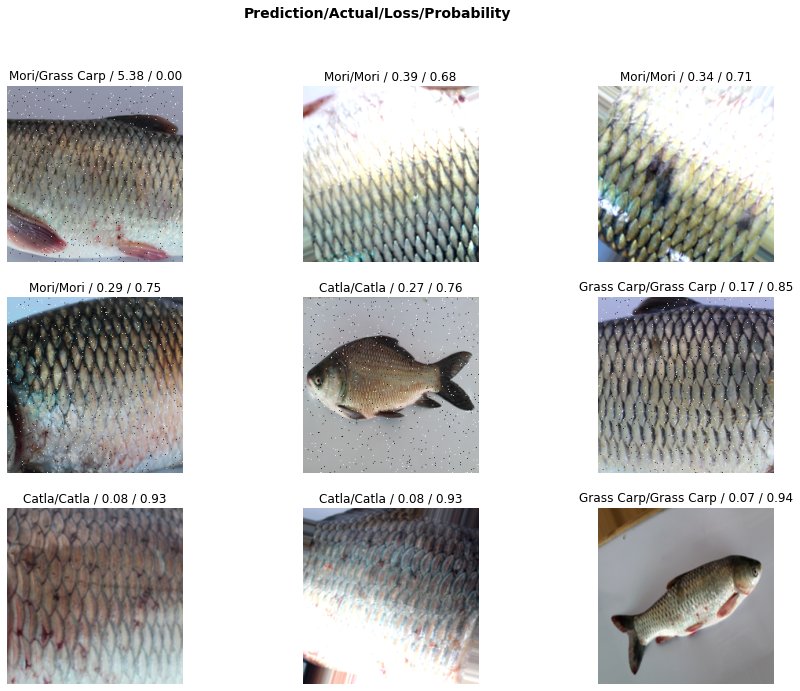

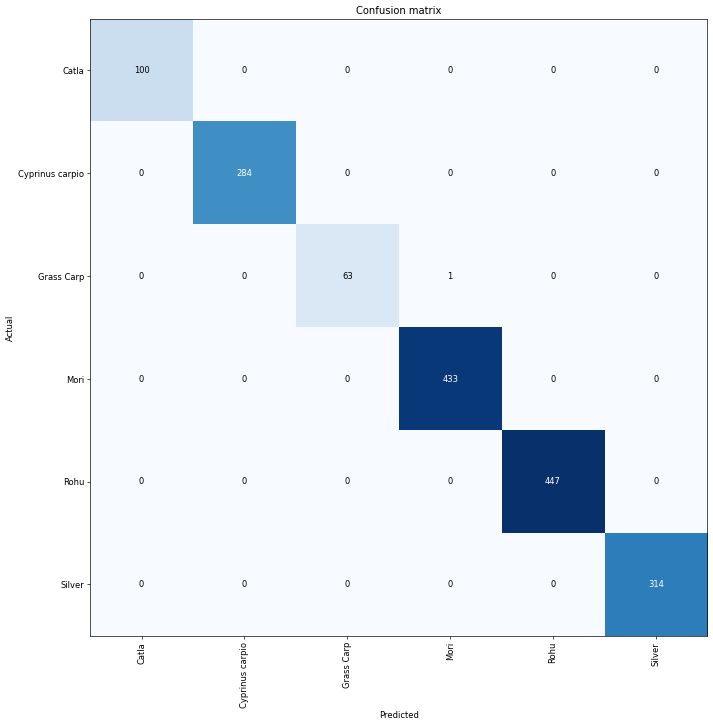

In [ ]:
#Classification interpretation object
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,11))
#Confusion Matrix
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
#Saving the model
model_path=Path('/content/drive/MyDrive/HACKATHON/ModelMobilenetV2_v2').absolute()
learn.export(model_path / 'export.pkl')
learn.save(model_path / 'export')

In [ ]:
!unzip "/content/Mixed.zip"

Archive:  /content/Mixed.zip
  inflating: Mixed/Catla-Body (16).png_0_6985.png  
  inflating: Mixed/Grass-Body (7).png_0_3085.png  
  inflating: Mixed/Gulfaam-Body (35).png  
  inflating: Mixed/Mrigal-Body (19).png  
  inflating: Mixed/Rohu-Body (2).png_0_3052.png  
  inflating: Mixed/Silver-Body (26).png_0_8888.png  
  inflating: Mixed/Silver-Body (3).png_0_760.png  


In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
#Loading the Trained Model
learn=load_learner("/content/drive/MyDrive/HACKATHON/ModelMobilenetV2_v2")
model=learn.model.eval()
path = "/content/Mixed/"
dirs = os.listdir(path)
list1=[]
for item in dirs:
  if os.path.isfile(path+item):
    img=open_image(path+item)
    print(item)
    img.resize(224)
    pred=learn.predict(img)
    cls=int(pred[1])
    print(pred,cls)
    print("Result: ")
    if(cls==0):
      print("Catla")
    elif(cls==1):
      print("Cyprinus Carpio")
    elif(cls==2):
      print("Grass Carp")
    elif(cls==3):
      print("Mori")
    elif(cls==4):
      print("Rohu")
    else:
      print('Silver')
    print(max(pred[2]*100))
    list1.append(max(pred[2]*100))
    img
avgscore = sum(list1) / len(dirs)
print("Average score:", avgscore)

Rohu-Body (2).png_0_3052.png
(Category tensor(0), tensor(0), tensor([8.4918e-01, 1.0612e-04, 1.6274e-03, 1.3822e-06, 1.4908e-01, 5.4030e-06])) 0
Result: 
Catla
tensor(84.9179)
Gulfaam-Body (35).png
(Category tensor(1), tensor(1), tensor([2.0003e-13, 1.0000e+00, 3.5028e-10, 1.3966e-09, 2.3573e-10, 8.9905e-12])) 1
Result: 
Cyprinus Carpio
tensor(100.)
Silver-Body (26).png_0_8888.png
(Category tensor(5), tensor(5), tensor([5.8465e-11, 1.5659e-16, 5.3626e-14, 7.0146e-15, 9.6355e-19, 1.0000e+00])) 5
Result: 
Silver
tensor(100.)
Grass-Body (7).png_0_3085.png
(Category tensor(2), tensor(2), tensor([2.6001e-07, 1.4939e-05, 9.9690e-01, 2.2602e-05, 3.0591e-03, 2.0505e-08])) 2
Result: 
Grass Carp
tensor(99.6903)
Catla-Body (16).png_0_6985.png
(Category tensor(0), tensor(0), tensor([1.0000e+00, 4.6378e-12, 3.1783e-07, 5.1067e-15, 1.9583e-07, 9.4445e-12])) 0
Result: 
Catla
tensor(99.9999)
Mrigal-Body (19).png
(Category tensor(3), tensor(3), tensor([1.8120e-03, 1.1883e-03, 2.7564e-06, 9.9676e-01, 1.

# With Imbalance
## New version of fastai

## For training code


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!pip3 install split-folders tqdm
import splitfolders  # or import split_folders
#splitfolders.ratio("/content/drive/MyDrive/HACKATHON/Dataset/Tuna_Species_v2", output="Output_Main", seed=1337, ratio=(.7,.2,.1), group_prefix=None) # default values

#new Fastai packages
!pip3 install -Uqq fastbook
!pip3 install git+https://github.com/fastai/fastai.git

import fastai
import fastbook
from fastbook import *
from fastai.vision import *
from fastai.vision.data import ImageDataLoaders
from fastai.metrics import error_rate, accuracy
import torch
import torch.nn as nn
from fastai.tabular.all import *
from fastai.text.all import *
from fastai.vision.all import *
from fastai import *

from fastai.vision import *
#fastbook.setup_book()

print(fastai.__version__)

import warnings
warnings.filterwarnings('ignore')
path= "/content/Output_Main"

#load the data
data = ImageDataLoaders.from_folder(path, train='train', valid='val', item_tfms=Resize(size = 224), ds_tfms=aug_transforms(p_affine=0.75, size=224), bs=64, num_workers=8)

#data.show_batch()
# See the classes and count of classes in your dataset
print(data.valid_ds.items)
print(len(data.train_ds), len(data.valid_ds))

import numpy as np
data.train_ds.items[0]
cls_wt = np.zeros(6)

for item in data.train_ds.items:
    if "/Albacore_Tuna/" in str(item):
        cls_wt[0] = cls_wt[0] + 1
    elif "/Bigeye_Tuna/" in str(item):
        cls_wt[1] = cls_wt[1] + 1
    elif "/Frigate_Tuna/" in str(item):
        cls_wt[2] = cls_wt[2] + 1
    elif "/Kawakawa_Tuna/" in str(item):
        cls_wt[3] = cls_wt[3] + 1
    elif "/Skipjack_tuna/" in str(item):
        cls_wt[4] = cls_wt[4] + 1
    elif "/Yellowfin_Tuna/" in str(item):
        cls_wt[5] = cls_wt[5] + 1
print(cls_wt)
for col in range(6):
    cls_wt[col] = len(data.train_ds)/(cls_wt[col]*(6))
#cls_wt = [1.0983, 1.0998, 1.2463, .8945, .7583, 1.07103]
cls_wt = cls_wt.astype(np.float32)
print(np.unique(cls_wt))
print("class based weights:",cls_wt)
loss = LabelSmoothingCrossEntropy(weight = torch.tensor(cls_wt).to("cuda:0"))
loss = loss.to("cuda:0")
data = data.to("cuda:0")

learn = cnn_learner(data, resnet50, loss_func= loss, metrics = accuracy)

import torch.nn as nn
def convert_act_cls(model, layer_type_old, layer_type_new):
    conversion_count = 0
    for name, module in reversed(model._modules.items()):
        if len(list(module.children())) > 0:
            # recurse
            model._modules[name] = convert_act_cls(module, layer_type_old, layer_type_new)

        if type(module) == layer_type_old:
            layer_old = module
            layer_new = layer_type_new
            model._modules[name] = layer_new

    return model
#learn.model = convert_act_cls(learn.model, nn.softmax, nn.sigmoid())

#learn.fine_tune(1)
learn.fit_one_cycle(50, cbs = [ReduceLROnPlateau(monitor='valid_loss', min_delta=0.001, patience=4), SaveModelCallback(monitor='accuracy', min_delta=0.00001)])

#data_path=Path('./chest_xray').absolute()
model_path=Path('/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2').absolute()

learn.export(model_path / 'export.pkl')
learn.save(model_path / 'export')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
  Cloning https://github.com/fastai/fastai.git to /tmp/pip-req-build-7c2jhb_w
  Running command git clone -q https://github.com/fastai/fastai.git /tmp/pip-req-build-7c2jhb_w
2.5.4
[Path('/content/Output_Main/val/Yellowfin_Tuna/81.png_0_7472.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/27.png_0_3775.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/4.png_0_9354.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/45.png_0_939.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/37blur.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/43.png_0_1395.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/53crop.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/38.png_0_3314.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/36noisy.png'), Path('/content/Output_Main/val/Yellowfin_Tuna/67.png_0_8316.png'), Path('/content/Output_Main/val/Yellowfin_T

RuntimeError: ignored

In [ ]:
#unzip test folder
!unzip "/content/drive/MyDrive/HACKATHON/Dataset/Yellowfin_Tuna.zip"

Archive:  /content/drive/MyDrive/HACKATHON/Dataset/Yellowfin_Tuna.zip
   creating: Yellowfin_Tuna/
  inflating: Yellowfin_Tuna/54.png_0_2994.png  
  inflating: Yellowfin_Tuna/77.png   
  inflating: Yellowfin_Tuna/13.png_0_6856.png  
  inflating: Yellowfin_Tuna/69.png_0_4897.png  
  inflating: Yellowfin_Tuna/79noisy.png  
  inflating: Yellowfin_Tuna/26.png_0_1814.png  
  inflating: Yellowfin_Tuna/92.png_0_7678.png  
  inflating: Yellowfin_Tuna/57.png_0_8579.png  
  inflating: Yellowfin_Tuna/57.png_0_9883.png  
  inflating: Yellowfin_Tuna/25crop.png  
  inflating: Yellowfin_Tuna/64.png_0_3887.png  
  inflating: Yellowfin_Tuna/29.png_0_1148.png  
  inflating: Yellowfin_Tuna/9.png_0_8608.png  
  inflating: Yellowfin_Tuna/86.png_0_4232.png  
  inflating: Yellowfin_Tuna/37_1.png  
  inflating: Yellowfin_Tuna/67blur.png  
  inflating: Yellowfin_Tuna/74noisy.png  
  inflating: Yellowfin_Tuna/59_1.png_0_9099.png  
  inflating: Yellowfin_Tuna/7blur.png  
  inflating: Yellowfin_Tuna/12noisy.png  

In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Kawakawa_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 5):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['95.png_0_6618.png', '19noisy.png', '98.png_0_557.png', '128.png_0_6726.png', '74crop.png', '109.png_0_6620.png', '24.png_0_9632.png', '96crop.png', '102.png_0_2262.png', '2.png_0_9630.png', '135noisy.png', '44.png_0_3415.png', '113.png_0_8059.png', '41.png_0_3225.png', '39_mult.png_0_9063.png', '111.png_0_3876.png', '14.png_0_9355.png', '60noisy.png', '87.png_0_7052.png', '109.png_0_6342.png', '61.png_0_9099.png', '25_mult.png_0_2547.png', '132.png_0_844.png', '110noisy.png', '46.png_0_6997.png', '92crop.png', '106.png_0_8652.png', '19.png_0_1438.png', '58.png_0_3507.png', '56crop.png', '137.png_0_8259.png', '135crop.png', '9.png_0_2980.png', '3.png', '136blur.png', '93.png_0_5946.png', '112.png_0_467.png', '104blur.png', '86crop.png', '7.png_0_3145.png', '139.png_0_3080.png', '8blur.png', '31.png_0_847.png', '127.png_0_2850.png', '44crop.png', '31.png_0_91

('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0227, 0.0609, 0.0452, 0.7889, 0.0411, 0.0412])) 3
Result: 
Kawakawa
TensorBase(78.8942)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0276, 0.0222, 0.0250, 0.8788, 0.0223, 0.0241])) 3
Result: 
Kawakawa
TensorBase(87.8821)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0374, 0.0405, 0.0333, 0.8067, 0.0412, 0.0409])) 3
Result: 
Kawakawa
TensorBase(80.6741)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0421, 0.0249, 0.0397, 0.8026, 0.0466, 0.0442])) 3
Result: 
Kawakawa
TensorBase(80.2551)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0237, 0.0241, 0.0221, 0.8770, 0.0244, 0.0287])) 3
Result: 
Kawakawa
TensorBase(87.7022)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0465, 0.0699, 0.0227, 0.7360, 0.0782, 0.0468])) 3
Result: 
Kawakawa
TensorBase(73.5963)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0373, 0.0722, 0.1905, 0.5900, 0.0469, 0.0631])) 3
Result: 
Kawakawa
TensorBase(59.0046)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0365, 0.0419, 0.0548, 0.7686, 0.0589, 0.0392])) 3
Result: 
Kawakawa
TensorBase(76.8611)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0285, 0.0278, 0.0581, 0.7983, 0.0363, 0.0509])) 3
Result: 
Kawakawa
TensorBase(79.8267)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0463, 0.0312, 0.1059, 0.6986, 0.0504, 0.0676])) 3
Result: 
Kawakawa
TensorBase(69.8611)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0462, 0.0600, 0.1166, 0.6970, 0.0351, 0.0452])) 3
Result: 
Kawakawa
TensorBase(69.7005)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0397, 0.0475, 0.0369, 0.7787, 0.0446, 0.0525])) 3
Result: 
Kawakawa
TensorBase(77.8738)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0393, 0.0291, 0.0669, 0.7798, 0.0379, 0.0470])) 3
Result: 
Kawakawa
TensorBase(77.9794)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0227, 0.0183, 0.0313, 0.8736, 0.0237, 0.0304])) 3
Result: 
Kawakawa
TensorBase(87.3587)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0447, 0.0246, 0.0488, 0.8047, 0.0420, 0.0352])) 3
Result: 
Kawakawa
TensorBase(80.4678)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0648, 0.0471, 0.0660, 0.7105, 0.0573, 0.0543])) 3
Result: 
Kawakawa
TensorBase(71.0475)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0538, 0.0611, 0.0827, 0.6883, 0.0705, 0.0437])) 3
Result: 
Kawakawa
TensorBase(68.8323)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0278, 0.0532, 0.0431, 0.8102, 0.0318, 0.0338])) 3
Result: 
Kawakawa
TensorBase(81.0245)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0144, 0.0227, 0.0254, 0.8866, 0.0205, 0.0305])) 3
Result: 
Kawakawa
TensorBase(88.6553)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0422, 0.0656, 0.0811, 0.6661, 0.0805, 0.0645])) 3
Result: 
Kawakawa
TensorBase(66.6115)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0618, 0.0345, 0.0252, 0.8253, 0.0251, 0.0281])) 3
Result: 
Kawakawa
TensorBase(82.5259)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.1899, 0.0345, 0.1765, 0.4335, 0.0944, 0.0714])) 3
Result: 
Kawakawa
TensorBase(43.3453)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0330, 0.0348, 0.0301, 0.8157, 0.0501, 0.0363])) 3
Result: 
Kawakawa
TensorBase(81.5670)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0354, 0.0590, 0.0434, 0.7782, 0.0450, 0.0391])) 3
Result: 
Kawakawa
TensorBase(77.8152)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0201, 0.0358, 0.0105, 0.8781, 0.0256, 0.0300])) 3
Result: 
Kawakawa
TensorBase(87.8051)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0467, 0.0705, 0.0488, 0.7340, 0.0632, 0.0368])) 3
Result: 
Kawakawa
TensorBase(73.3994)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0285, 0.0528, 0.0504, 0.7736, 0.0447, 0.0500])) 3
Result: 
Kawakawa
TensorBase(77.3553)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0225, 0.0299, 0.0383, 0.8338, 0.0411, 0.0344])) 3
Result: 
Kawakawa
TensorBase(83.3773)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0196, 0.0303, 0.0331, 0.8582, 0.0247, 0.0341])) 3
Result: 
Kawakawa
TensorBase(85.8199)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0381, 0.0335, 0.0450, 0.7953, 0.0417, 0.0464])) 3
Result: 
Kawakawa
TensorBase(79.5312)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0304, 0.0404, 0.1250, 0.7030, 0.0525, 0.0487])) 3
Result: 
Kawakawa
TensorBase(70.2953)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0330, 0.0357, 0.0620, 0.7695, 0.0551, 0.0448])) 3
Result: 
Kawakawa
TensorBase(76.9462)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0477, 0.0415, 0.0494, 0.7722, 0.0452, 0.0441])) 3
Result: 
Kawakawa
TensorBase(77.2218)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0175, 0.0195, 0.0201, 0.8836, 0.0204, 0.0389])) 3
Result: 
Kawakawa
TensorBase(88.3646)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0400, 0.0330, 0.0509, 0.8074, 0.0340, 0.0347])) 3
Result: 
Kawakawa
TensorBase(80.7431)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0508, 0.0383, 0.0548, 0.7672, 0.0391, 0.0499])) 3
Result: 
Kawakawa
TensorBase(76.7153)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0720, 0.0315, 0.0656, 0.7220, 0.0683, 0.0406])) 3
Result: 
Kawakawa
TensorBase(72.1967)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0428, 0.0359, 0.0675, 0.7843, 0.0296, 0.0400])) 3
Result: 
Kawakawa
TensorBase(78.4343)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0259, 0.0176, 0.0297, 0.8568, 0.0309, 0.0391])) 3
Result: 
Kawakawa
TensorBase(85.6752)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0464, 0.0365, 0.0462, 0.7277, 0.0820, 0.0611])) 3
Result: 
Kawakawa
TensorBase(72.7746)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0218, 0.0562, 0.0493, 0.7989, 0.0321, 0.0416])) 3
Result: 
Kawakawa
TensorBase(79.8915)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0383, 0.0294, 0.0400, 0.7903, 0.0508, 0.0512])) 3
Result: 
Kawakawa
TensorBase(79.0295)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0200, 0.0369, 0.0473, 0.8255, 0.0258, 0.0444])) 3
Result: 
Kawakawa
TensorBase(82.5511)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0178, 0.0209, 0.0225, 0.8964, 0.0140, 0.0286])) 3
Result: 
Kawakawa
TensorBase(89.6352)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0293, 0.0521, 0.0429, 0.7728, 0.0529, 0.0501])) 3
Result: 
Kawakawa
TensorBase(77.2766)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0250, 0.0240, 0.0296, 0.8614, 0.0261, 0.0339])) 3
Result: 
Kawakawa
TensorBase(86.1427)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0347, 0.0302, 0.0357, 0.8408, 0.0269, 0.0316])) 3
Result: 
Kawakawa
TensorBase(84.0845)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0107, 0.0201, 0.0245, 0.8953, 0.0234, 0.0261])) 3
Result: 
Kawakawa
TensorBase(89.5291)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0449, 0.0405, 0.0531, 0.7916, 0.0327, 0.0371])) 3
Result: 
Kawakawa
TensorBase(79.1637)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0272, 0.0226, 0.0308, 0.8330, 0.0361, 0.0503])) 3
Result: 
Kawakawa
TensorBase(83.3034)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0450, 0.0272, 0.0310, 0.8241, 0.0413, 0.0314])) 3
Result: 
Kawakawa
TensorBase(82.4133)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0611, 0.0461, 0.0327, 0.7345, 0.0734, 0.0522])) 3
Result: 
Kawakawa
TensorBase(73.4538)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0515, 0.0561, 0.0488, 0.7054, 0.0872, 0.0509])) 3
Result: 
Kawakawa
TensorBase(70.5429)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0275, 0.0450, 0.0459, 0.8209, 0.0264, 0.0342])) 3
Result: 
Kawakawa
TensorBase(82.0929)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0241, 0.0293, 0.0261, 0.8468, 0.0357, 0.0380])) 3
Result: 
Kawakawa
TensorBase(84.6753)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0144, 0.0200, 0.0515, 0.8132, 0.0311, 0.0699])) 3
Result: 
Kawakawa
TensorBase(81.3153)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0283, 0.0340, 0.0361, 0.8112, 0.0491, 0.0414])) 3
Result: 
Kawakawa
TensorBase(81.1161)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0594, 0.1423, 0.0507, 0.6550, 0.0509, 0.0417])) 3
Result: 
Kawakawa
TensorBase(65.4973)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0314, 0.0365, 0.0347, 0.8083, 0.0446, 0.0445])) 3
Result: 
Kawakawa
TensorBase(80.8296)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0480, 0.0262, 0.0745, 0.7517, 0.0598, 0.0399])) 3
Result: 
Kawakawa
TensorBase(75.1650)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0405, 0.0230, 0.0951, 0.7215, 0.0674, 0.0525])) 3
Result: 
Kawakawa
TensorBase(72.1458)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0328, 0.0471, 0.0340, 0.8005, 0.0426, 0.0428])) 3
Result: 
Kawakawa
TensorBase(80.0544)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0441, 0.0489, 0.0622, 0.7684, 0.0409, 0.0355])) 3
Result: 
Kawakawa
TensorBase(76.8441)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0244, 0.0341, 0.0615, 0.7962, 0.0409, 0.0429])) 3
Result: 
Kawakawa
TensorBase(79.6232)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0349, 0.0334, 0.0462, 0.8182, 0.0325, 0.0348])) 3
Result: 
Kawakawa
TensorBase(81.8203)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0261, 0.0413, 0.0392, 0.8177, 0.0405, 0.0352])) 3
Result: 
Kawakawa
TensorBase(81.7679)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0307, 0.0261, 0.0408, 0.8239, 0.0331, 0.0454])) 3
Result: 
Kawakawa
TensorBase(82.3868)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0247, 0.0876, 0.0944, 0.6672, 0.0865, 0.0397])) 3
Result: 
Kawakawa
TensorBase(66.7161)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0491, 0.0236, 0.0257, 0.8044, 0.0609, 0.0364])) 3
Result: 
Kawakawa
TensorBase(80.4363)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0537, 0.0423, 0.1254, 0.6706, 0.0534, 0.0545])) 3
Result: 
Kawakawa
TensorBase(67.0598)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0396, 0.0417, 0.0353, 0.7931, 0.0518, 0.0385])) 3
Result: 
Kawakawa
TensorBase(79.3100)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0417, 0.0394, 0.0292, 0.8057, 0.0487, 0.0352])) 3
Result: 
Kawakawa
TensorBase(80.5739)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0411, 0.0229, 0.0468, 0.8309, 0.0251, 0.0332])) 3
Result: 
Kawakawa
TensorBase(83.0918)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0412, 0.0713, 0.4102, 0.3526, 0.0757, 0.0490])) 2
Result: 
Frigate
TensorBase(41.0163)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0256, 0.0360, 0.0333, 0.8008, 0.0597, 0.0446])) 3
Result: 
Kawakawa
TensorBase(80.0788)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0270, 0.0490, 0.0351, 0.8048, 0.0415, 0.0427])) 3
Result: 
Kawakawa
TensorBase(80.4771)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0180, 0.0475, 0.0169, 0.8419, 0.0400, 0.0356])) 3
Result: 
Kawakawa
TensorBase(84.1937)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0415, 0.0788, 0.4365, 0.3578, 0.0418, 0.0436])) 2
Result: 
Frigate
TensorBase(43.6476)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0288, 0.0425, 0.0364, 0.8331, 0.0303, 0.0289])) 3
Result: 
Kawakawa
TensorBase(83.3057)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.1234, 0.0483, 0.1173, 0.6222, 0.0488, 0.0400])) 3
Result: 
Kawakawa
TensorBase(62.2239)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0318, 0.0318, 0.0362, 0.8335, 0.0374, 0.0294])) 3
Result: 
Kawakawa
TensorBase(83.3465)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0422, 0.0291, 0.0450, 0.8010, 0.0322, 0.0506])) 3
Result: 
Kawakawa
TensorBase(80.1016)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0349, 0.0413, 0.0363, 0.8383, 0.0225, 0.0267])) 3
Result: 
Kawakawa
TensorBase(83.8269)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0401, 0.0347, 0.0855, 0.7686, 0.0311, 0.0399])) 3
Result: 
Kawakawa
TensorBase(76.8592)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0741, 0.0754, 0.0753, 0.6551, 0.0402, 0.0799])) 3
Result: 
Kawakawa
TensorBase(65.5121)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0508, 0.0482, 0.0442, 0.7772, 0.0464, 0.0332])) 3
Result: 
Kawakawa
TensorBase(77.7218)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0562, 0.0346, 0.0273, 0.7905, 0.0516, 0.0398])) 3
Result: 
Kawakawa
TensorBase(79.0452)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0271, 0.0331, 0.0262, 0.8560, 0.0298, 0.0279])) 3
Result: 
Kawakawa
TensorBase(85.6003)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0373, 0.0279, 0.0529, 0.8119, 0.0385, 0.0315])) 3
Result: 
Kawakawa
TensorBase(81.1940)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0605, 0.0773, 0.1066, 0.6107, 0.0808, 0.0641])) 3
Result: 
Kawakawa
TensorBase(61.0655)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0248, 0.0287, 0.0299, 0.8319, 0.0412, 0.0435])) 3
Result: 
Kawakawa
TensorBase(83.1856)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0703, 0.0478, 0.0246, 0.7368, 0.0660, 0.0545])) 3
Result: 
Kawakawa
TensorBase(73.6783)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0470, 0.0527, 0.0245, 0.7778, 0.0584, 0.0397])) 3
Result: 
Kawakawa
TensorBase(77.7760)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0281, 0.0297, 0.0215, 0.8370, 0.0430, 0.0406])) 3
Result: 
Kawakawa
TensorBase(83.7039)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0391, 0.0318, 0.0314, 0.8319, 0.0301, 0.0357])) 3
Result: 
Kawakawa
TensorBase(83.1878)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0276, 0.0341, 0.0473, 0.8033, 0.0476, 0.0401])) 3
Result: 
Kawakawa
TensorBase(80.3278)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0606, 0.0462, 0.0395, 0.7624, 0.0461, 0.0451])) 3
Result: 
Kawakawa
TensorBase(76.2449)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0376, 0.0327, 0.0497, 0.7919, 0.0389, 0.0491])) 3
Result: 
Kawakawa
TensorBase(79.1902)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0199, 0.0229, 0.0375, 0.8795, 0.0192, 0.0209])) 3
Result: 
Kawakawa
TensorBase(87.9502)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0416, 0.1079, 0.0539, 0.7037, 0.0506, 0.0423])) 3
Result: 
Kawakawa
TensorBase(70.3724)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0323, 0.0379, 0.0358, 0.8203, 0.0337, 0.0400])) 3
Result: 
Kawakawa
TensorBase(82.0336)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0581, 0.0263, 0.0755, 0.7181, 0.0459, 0.0762])) 3
Result: 
Kawakawa
TensorBase(71.8096)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0250, 0.0361, 0.7381, 0.1340, 0.0379, 0.0289])) 2
Result: 
Frigate
TensorBase(73.8087)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0387, 0.0369, 0.0366, 0.8152, 0.0397, 0.0329])) 3
Result: 
Kawakawa
TensorBase(81.5245)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0354, 0.0385, 0.0375, 0.8129, 0.0382, 0.0375])) 3
Result: 
Kawakawa
TensorBase(81.2901)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0311, 0.0311, 0.0493, 0.8049, 0.0395, 0.0441])) 3
Result: 
Kawakawa
TensorBase(80.4919)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0261, 0.0267, 0.0251, 0.8602, 0.0243, 0.0375])) 3
Result: 
Kawakawa
TensorBase(86.0248)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0490, 0.0310, 0.0400, 0.8093, 0.0345, 0.0362])) 3
Result: 
Kawakawa
TensorBase(80.9311)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0721, 0.0960, 0.0687, 0.6366, 0.0724, 0.0543])) 3
Result: 
Kawakawa
TensorBase(63.6620)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.1299, 0.0685, 0.0423, 0.6785, 0.0362, 0.0447])) 3
Result: 
Kawakawa
TensorBase(67.8492)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0408, 0.0606, 0.0974, 0.7013, 0.0498, 0.0500])) 3
Result: 
Kawakawa
TensorBase(70.1320)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0622, 0.0979, 0.1409, 0.5753, 0.0522, 0.0714])) 3
Result: 
Kawakawa
TensorBase(57.5349)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0381, 0.0372, 0.0409, 0.8078, 0.0407, 0.0354])) 3
Result: 
Kawakawa
TensorBase(80.7845)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0333, 0.0732, 0.0552, 0.7458, 0.0576, 0.0349])) 3
Result: 
Kawakawa
TensorBase(74.5789)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0275, 0.0411, 0.1333, 0.7282, 0.0320, 0.0377])) 3
Result: 
Kawakawa
TensorBase(72.8245)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0386, 0.0163, 0.0834, 0.7894, 0.0340, 0.0382])) 3
Result: 
Kawakawa
TensorBase(78.9410)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0364, 0.0378, 0.0249, 0.8174, 0.0438, 0.0396])) 3
Result: 
Kawakawa
TensorBase(81.7415)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0393, 0.0232, 0.0382, 0.7869, 0.0584, 0.0541])) 3
Result: 
Kawakawa
TensorBase(78.6925)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0590, 0.3983, 0.0685, 0.3591, 0.0683, 0.0468])) 1
Result: 
Big Eye
TensorBase(39.8299)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0378, 0.0282, 0.0401, 0.8339, 0.0253, 0.0348])) 3
Result: 
Kawakawa
TensorBase(83.3873)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0429, 0.0214, 0.0383, 0.8331, 0.0304, 0.0339])) 3
Result: 
Kawakawa
TensorBase(83.3145)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0204, 0.0205, 0.0253, 0.8742, 0.0282, 0.0314])) 3
Result: 
Kawakawa
TensorBase(87.4205)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0611, 0.0410, 0.0299, 0.7925, 0.0420, 0.0336])) 3
Result: 
Kawakawa
TensorBase(79.2539)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0736, 0.1006, 0.1521, 0.5360, 0.0851, 0.0525])) 3
Result: 
Kawakawa
TensorBase(53.6015)
Average score: 0.0


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Bigeye_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 1):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['Image_44.png_0_4958.png', 'Image_41blur.png', 'Image_65crop.png', 'Image_81.png_0_573.png', 'Image_90.png_0_4375.png', 'Image_93.png_0_4230.png', 'Image_69.png_0_9721.png', 'Image_94blur.png', 'Image_94noisy.png', 'Image_70.png_0_6179.png', 'Image_39.png_0_685.png', 'Image_19.png', 'Image_15.png_0_9160.png', 'Image_60.png_0_9729.png', 'Image_60noisy.png', 'Image_41.png_0_5554.png', 'Image_24crop.png', 'Image_14noisy.png', 'Image_70noisy.png', 'Image_50.png_0_1598.png', 'Image_96.png_0_5231.png', 'Image_19.png_0_4875.png', 'Image_82blur.png', 'Image_72.png_0_1465.png', 'Image_2crop.png', 'Image_8.png_0_5429.png', 'Image_7.png_0_3787.png', 'Image_64.png_0_3067.png', 'Image_27.png_0_6556.png', 'Image_82.png_0_3711.png', 'Image_60crop.png', 'Image_91crop.png', 'Image_65blur.png', 'Image_10.png_0_8289.png', 'Image_47noisy.png', 'Image_91.png_0_7808.png', 'Image_

('Bigeye_Tuna', TensorBase(1), TensorBase([0.0071, 0.9494, 0.0079, 0.0136, 0.0112, 0.0108])) 1
Result: 
Big Eye
TensorBase(94.9392)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0102, 0.9345, 0.0143, 0.0093, 0.0171, 0.0147])) 1
Result: 
Big Eye
TensorBase(93.4487)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0115, 0.9041, 0.0272, 0.0166, 0.0174, 0.0231])) 1
Result: 
Big Eye
TensorBase(90.4076)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0669, 0.7378, 0.1006, 0.0416, 0.0247, 0.0284])) 1
Result: 
Big Eye
TensorBase(73.7769)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0476, 0.8816, 0.0182, 0.0190, 0.0152, 0.0185])) 1
Result: 
Big Eye
TensorBase(88.1642)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0093, 0.9560, 0.0049, 0.0089, 0.0115, 0.0094])) 1
Result: 
Big Eye
TensorBase(95.5991)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0373, 0.8787, 0.0188, 0.0239, 0.0247, 0.0166])) 1
Result: 
Big Eye
TensorBase(87.8665)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0120, 0.9494, 0.0101, 0.0088, 0.0098, 0.0099])) 1
Result: 
Big Eye
TensorBase(94.9445)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0131, 0.9270, 0.0173, 0.0147, 0.0140, 0.0139])) 1
Result: 
Big Eye
TensorBase(92.6957)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0807, 0.8457, 0.0103, 0.0214, 0.0218, 0.0200])) 1
Result: 
Big Eye
TensorBase(84.5684)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0069, 0.9549, 0.0116, 0.0096, 0.0062, 0.0108])) 1
Result: 
Big Eye
TensorBase(95.4890)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0227, 0.8598, 0.0237, 0.0224, 0.0287, 0.0426])) 1
Result: 
Big Eye
TensorBase(85.9808)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0230, 0.9058, 0.0109, 0.0161, 0.0299, 0.0144])) 1
Result: 
Big Eye
TensorBase(90.5839)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0145, 0.9538, 0.0085, 0.0078, 0.0071, 0.0084])) 1
Result: 
Big Eye
TensorBase(95.3846)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0579, 0.8860, 0.0200, 0.0093, 0.0133, 0.0136])) 1
Result: 
Big Eye
TensorBase(88.6042)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0192, 0.8518, 0.0427, 0.0405, 0.0218, 0.0239])) 1
Result: 
Big Eye
TensorBase(85.1803)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0726, 0.7353, 0.0342, 0.0381, 0.0326, 0.0872])) 1
Result: 
Big Eye
TensorBase(73.5251)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0100, 0.9580, 0.0086, 0.0062, 0.0081, 0.0090])) 1
Result: 
Big Eye
TensorBase(95.8034)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0059, 0.8971, 0.0196, 0.0333, 0.0267, 0.0174])) 1
Result: 
Big Eye
TensorBase(89.7057)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0042, 0.9394, 0.0076, 0.0185, 0.0114, 0.0188])) 1
Result: 
Big Eye
TensorBase(93.9391)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0032, 0.9667, 0.0089, 0.0052, 0.0077, 0.0083])) 1
Result: 
Big Eye
TensorBase(96.6694)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.2375, 0.5845, 0.0270, 0.0364, 0.0409, 0.0736])) 1
Result: 
Big Eye
TensorBase(58.4546)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0230, 0.9163, 0.0225, 0.0133, 0.0129, 0.0121])) 1
Result: 
Big Eye
TensorBase(91.6254)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0145, 0.8419, 0.0558, 0.0217, 0.0469, 0.0191])) 1
Result: 
Big Eye
TensorBase(84.1931)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0876, 0.7801, 0.0224, 0.0372, 0.0417, 0.0310])) 1
Result: 
Big Eye
TensorBase(78.0123)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0055, 0.8507, 0.0379, 0.0321, 0.0219, 0.0519])) 1
Result: 
Big Eye
TensorBase(85.0707)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0049, 0.9649, 0.0062, 0.0061, 0.0084, 0.0095])) 1
Result: 
Big Eye
TensorBase(96.4861)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0200, 0.9241, 0.0148, 0.0128, 0.0135, 0.0148])) 1
Result: 
Big Eye
TensorBase(92.4135)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0111, 0.9446, 0.0078, 0.0117, 0.0147, 0.0102])) 1
Result: 
Big Eye
TensorBase(94.4567)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0220, 0.9385, 0.0107, 0.0096, 0.0100, 0.0093])) 1
Result: 
Big Eye
TensorBase(93.8504)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0073, 0.9497, 0.0076, 0.0129, 0.0108, 0.0118])) 1
Result: 
Big Eye
TensorBase(94.9699)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0058, 0.9548, 0.0099, 0.0101, 0.0102, 0.0092])) 1
Result: 
Big Eye
TensorBase(95.4752)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0128, 0.9326, 0.0165, 0.0088, 0.0132, 0.0160])) 1
Result: 
Big Eye
TensorBase(93.2630)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0073, 0.9309, 0.0164, 0.0138, 0.0194, 0.0122])) 1
Result: 
Big Eye
TensorBase(93.0876)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0145, 0.9061, 0.0189, 0.0209, 0.0204, 0.0191])) 1
Result: 
Big Eye
TensorBase(90.6141)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0163, 0.9373, 0.0073, 0.0118, 0.0135, 0.0139])) 1
Result: 
Big Eye
TensorBase(93.7299)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0098, 0.9123, 0.0258, 0.0120, 0.0157, 0.0244])) 1
Result: 
Big Eye
TensorBase(91.2313)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0130, 0.8865, 0.0255, 0.0157, 0.0172, 0.0421])) 1
Result: 
Big Eye
TensorBase(88.6453)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0153, 0.9133, 0.0107, 0.0160, 0.0270, 0.0178])) 1
Result: 
Big Eye
TensorBase(91.3254)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0311, 0.8316, 0.0255, 0.0217, 0.0310, 0.0591])) 1
Result: 
Big Eye
TensorBase(83.1568)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0051, 0.9692, 0.0068, 0.0055, 0.0069, 0.0065])) 1
Result: 
Big Eye
TensorBase(96.9177)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0243, 0.8412, 0.0362, 0.0303, 0.0400, 0.0281])) 1
Result: 
Big Eye
TensorBase(84.1163)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0203, 0.9197, 0.0136, 0.0176, 0.0119, 0.0169])) 1
Result: 
Big Eye
TensorBase(91.9698)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1155, 0.7717, 0.0260, 0.0234, 0.0254, 0.0381])) 1
Result: 
Big Eye
TensorBase(77.1658)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0930, 0.7819, 0.0395, 0.0318, 0.0257, 0.0282])) 1
Result: 
Big Eye
TensorBase(78.1918)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0077, 0.9236, 0.0220, 0.0115, 0.0157, 0.0195])) 1
Result: 
Big Eye
TensorBase(92.3619)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0076, 0.9438, 0.0158, 0.0101, 0.0123, 0.0106])) 1
Result: 
Big Eye
TensorBase(94.3768)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0113, 0.9163, 0.0217, 0.0166, 0.0138, 0.0202])) 1
Result: 
Big Eye
TensorBase(91.6344)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0546, 0.8341, 0.0209, 0.0367, 0.0203, 0.0334])) 1
Result: 
Big Eye
TensorBase(83.4125)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0922, 0.8124, 0.0197, 0.0216, 0.0224, 0.0317])) 1
Result: 
Big Eye
TensorBase(81.2387)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0301, 0.8888, 0.0145, 0.0190, 0.0276, 0.0200])) 1
Result: 
Big Eye
TensorBase(88.8849)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0200, 0.9102, 0.0131, 0.0223, 0.0160, 0.0184])) 1
Result: 
Big Eye
TensorBase(91.0158)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0167, 0.9433, 0.0127, 0.0082, 0.0112, 0.0080])) 1
Result: 
Big Eye
TensorBase(94.3332)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0382, 0.9054, 0.0142, 0.0185, 0.0106, 0.0130])) 1
Result: 
Big Eye
TensorBase(90.5414)


('Frigate_Tuna', TensorBase(2), TensorBase([0.1471, 0.2098, 0.4432, 0.0876, 0.0541, 0.0581])) 2
Result: 
Frigate
TensorBase(44.3188)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0151, 0.9187, 0.0113, 0.0268, 0.0132, 0.0148])) 1
Result: 
Big Eye
TensorBase(91.8740)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0896, 0.7371, 0.0208, 0.0282, 0.0837, 0.0406])) 1
Result: 
Big Eye
TensorBase(73.7122)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0625, 0.7553, 0.0425, 0.0295, 0.0320, 0.0782])) 1
Result: 
Big Eye
TensorBase(75.5334)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0096, 0.9443, 0.0078, 0.0086, 0.0171, 0.0126])) 1
Result: 
Big Eye
TensorBase(94.4339)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0205, 0.8284, 0.0448, 0.0216, 0.0522, 0.0324])) 1
Result: 
Big Eye
TensorBase(82.8419)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.2404, 0.4980, 0.0516, 0.0717, 0.0593, 0.0790])) 1
Result: 
Big Eye
TensorBase(49.8021)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0168, 0.8284, 0.0335, 0.0576, 0.0284, 0.0353])) 1
Result: 
Big Eye
TensorBase(82.8350)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0774, 0.7784, 0.0555, 0.0270, 0.0287, 0.0330])) 1
Result: 
Big Eye
TensorBase(77.8410)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0357, 0.9059, 0.0169, 0.0127, 0.0106, 0.0182])) 1
Result: 
Big Eye
TensorBase(90.5875)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0884, 0.7739, 0.0302, 0.0380, 0.0357, 0.0338])) 1
Result: 
Big Eye
TensorBase(77.3938)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1025, 0.7808, 0.0220, 0.0311, 0.0242, 0.0395])) 1
Result: 
Big Eye
TensorBase(78.0807)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0063, 0.9622, 0.0075, 0.0079, 0.0088, 0.0073])) 1
Result: 
Big Eye
TensorBase(96.2191)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0484, 0.8196, 0.0342, 0.0331, 0.0219, 0.0429])) 1
Result: 
Big Eye
TensorBase(81.9566)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0053, 0.9681, 0.0051, 0.0058, 0.0075, 0.0082])) 1
Result: 
Big Eye
TensorBase(96.8093)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0173, 0.9230, 0.0183, 0.0133, 0.0166, 0.0116])) 1
Result: 
Big Eye
TensorBase(92.2957)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0083, 0.9609, 0.0071, 0.0088, 0.0081, 0.0069])) 1
Result: 
Big Eye
TensorBase(96.0861)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0046, 0.9498, 0.0163, 0.0070, 0.0105, 0.0118])) 1
Result: 
Big Eye
TensorBase(94.9799)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0210, 0.9108, 0.0141, 0.0206, 0.0178, 0.0156])) 1
Result: 
Big Eye
TensorBase(91.0832)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0099, 0.9197, 0.0179, 0.0214, 0.0177, 0.0134])) 1
Result: 
Big Eye
TensorBase(91.9686)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0108, 0.9429, 0.0097, 0.0099, 0.0139, 0.0127])) 1
Result: 
Big Eye
TensorBase(94.2928)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0117, 0.9249, 0.0192, 0.0128, 0.0135, 0.0178])) 1
Result: 
Big Eye
TensorBase(92.4925)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0160, 0.9504, 0.0053, 0.0089, 0.0089, 0.0106])) 1
Result: 
Big Eye
TensorBase(95.0415)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1539, 0.6311, 0.0473, 0.0427, 0.0494, 0.0756])) 1
Result: 
Big Eye
TensorBase(63.1120)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0179, 0.9113, 0.0148, 0.0226, 0.0152, 0.0182])) 1
Result: 
Big Eye
TensorBase(91.1254)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0740, 0.8221, 0.0246, 0.0231, 0.0224, 0.0339])) 1
Result: 
Big Eye
TensorBase(82.2101)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0214, 0.9363, 0.0099, 0.0118, 0.0100, 0.0107])) 1
Result: 
Big Eye
TensorBase(93.6272)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0095, 0.9495, 0.0120, 0.0093, 0.0094, 0.0104])) 1
Result: 
Big Eye
TensorBase(94.9477)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.2056, 0.3732, 0.0715, 0.0543, 0.0916, 0.2038])) 1
Result: 
Big Eye
TensorBase(37.3225)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0058, 0.9489, 0.0187, 0.0086, 0.0081, 0.0099])) 1
Result: 
Big Eye
TensorBase(94.8924)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.2873, 0.1662, 0.0778, 0.1054, 0.0661, 0.2972])) 5
Result: 
Yellowfin
TensorBase(29.7204)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0131, 0.9343, 0.0134, 0.0171, 0.0107, 0.0114])) 1
Result: 
Big Eye
TensorBase(93.4272)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1216, 0.7536, 0.0468, 0.0279, 0.0224, 0.0276])) 1
Result: 
Big Eye
TensorBase(75.3640)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0139, 0.9139, 0.0152, 0.0151, 0.0205, 0.0214])) 1
Result: 
Big Eye
TensorBase(91.3884)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0072, 0.9244, 0.0133, 0.0211, 0.0127, 0.0213])) 1
Result: 
Big Eye
TensorBase(92.4409)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0121, 0.9001, 0.0217, 0.0250, 0.0149, 0.0262])) 1
Result: 
Big Eye
TensorBase(90.0078)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0092, 0.9491, 0.0102, 0.0093, 0.0132, 0.0091])) 1
Result: 
Big Eye
TensorBase(94.9088)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0317, 0.8635, 0.0321, 0.0265, 0.0211, 0.0252])) 1
Result: 
Big Eye
TensorBase(86.3457)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1193, 0.4591, 0.0797, 0.0495, 0.1437, 0.1488])) 1
Result: 
Big Eye
TensorBase(45.9088)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0551, 0.8335, 0.0489, 0.0248, 0.0160, 0.0217])) 1
Result: 
Big Eye
TensorBase(83.3510)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0125, 0.9274, 0.0101, 0.0164, 0.0200, 0.0136])) 1
Result: 
Big Eye
TensorBase(92.7426)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0154, 0.9176, 0.0146, 0.0152, 0.0166, 0.0206])) 1
Result: 
Big Eye
TensorBase(91.7587)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0099, 0.9466, 0.0109, 0.0139, 0.0086, 0.0101])) 1
Result: 
Big Eye
TensorBase(94.6559)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0720, 0.7526, 0.0644, 0.0340, 0.0401, 0.0368])) 1
Result: 
Big Eye
TensorBase(75.2579)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0729, 0.8254, 0.0132, 0.0284, 0.0348, 0.0253])) 1
Result: 
Big Eye
TensorBase(82.5387)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0333, 0.8562, 0.0463, 0.0182, 0.0231, 0.0229])) 1
Result: 
Big Eye
TensorBase(85.6187)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0167, 0.9118, 0.0131, 0.0213, 0.0159, 0.0212])) 1
Result: 
Big Eye
TensorBase(91.1791)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0112, 0.9396, 0.0142, 0.0101, 0.0142, 0.0108])) 1
Result: 
Big Eye
TensorBase(93.9564)
Average score: TensorBase(85.5857)


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Bigeye_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 1):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['Image_44.png_0_4958.png', 'Image_41blur.png', 'Image_65crop.png', 'Image_81.png_0_573.png', 'Image_90.png_0_4375.png', 'Image_93.png_0_4230.png', 'Image_69.png_0_9721.png', 'Image_94blur.png', 'Image_94noisy.png', 'Image_70.png_0_6179.png', 'Image_39.png_0_685.png', 'Image_19.png', 'Image_15.png_0_9160.png', 'Image_60.png_0_9729.png', 'Image_60noisy.png', 'Image_41.png_0_5554.png', 'Image_24crop.png', 'Image_14noisy.png', 'Image_70noisy.png', 'Image_50.png_0_1598.png', 'Image_96.png_0_5231.png', 'Image_19.png_0_4875.png', 'Image_82blur.png', 'Image_72.png_0_1465.png', 'Image_2crop.png', 'Image_8.png_0_5429.png', 'Image_7.png_0_3787.png', 'Image_64.png_0_3067.png', 'Image_27.png_0_6556.png', 'Image_82.png_0_3711.png', 'Image_60crop.png', 'Image_91crop.png', 'Image_65blur.png', 'Image_10.png_0_8289.png', 'Image_47noisy.png', 'Image_91.png_0_7808.png', 'Image_

('Bigeye_Tuna', TensorBase(1), TensorBase([0.0071, 0.9494, 0.0079, 0.0136, 0.0112, 0.0108])) 1
Result: 
Big Eye
TensorBase(94.9392)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0102, 0.9345, 0.0143, 0.0093, 0.0171, 0.0147])) 1
Result: 
Big Eye
TensorBase(93.4487)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0115, 0.9041, 0.0272, 0.0166, 0.0174, 0.0231])) 1
Result: 
Big Eye
TensorBase(90.4076)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0669, 0.7378, 0.1006, 0.0416, 0.0247, 0.0284])) 1
Result: 
Big Eye
TensorBase(73.7769)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0476, 0.8816, 0.0182, 0.0190, 0.0152, 0.0185])) 1
Result: 
Big Eye
TensorBase(88.1642)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0093, 0.9560, 0.0049, 0.0089, 0.0115, 0.0094])) 1
Result: 
Big Eye
TensorBase(95.5991)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0373, 0.8787, 0.0188, 0.0239, 0.0247, 0.0166])) 1
Result: 
Big Eye
TensorBase(87.8665)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0120, 0.9494, 0.0101, 0.0088, 0.0098, 0.0099])) 1
Result: 
Big Eye
TensorBase(94.9445)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0131, 0.9270, 0.0173, 0.0147, 0.0140, 0.0139])) 1
Result: 
Big Eye
TensorBase(92.6957)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0807, 0.8457, 0.0103, 0.0214, 0.0218, 0.0200])) 1
Result: 
Big Eye
TensorBase(84.5684)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0069, 0.9549, 0.0116, 0.0096, 0.0062, 0.0108])) 1
Result: 
Big Eye
TensorBase(95.4890)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0227, 0.8598, 0.0237, 0.0224, 0.0287, 0.0426])) 1
Result: 
Big Eye
TensorBase(85.9808)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0230, 0.9058, 0.0109, 0.0161, 0.0299, 0.0144])) 1
Result: 
Big Eye
TensorBase(90.5839)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0145, 0.9538, 0.0085, 0.0078, 0.0071, 0.0084])) 1
Result: 
Big Eye
TensorBase(95.3846)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0579, 0.8860, 0.0200, 0.0093, 0.0133, 0.0136])) 1
Result: 
Big Eye
TensorBase(88.6042)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0192, 0.8518, 0.0427, 0.0405, 0.0218, 0.0239])) 1
Result: 
Big Eye
TensorBase(85.1803)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0726, 0.7353, 0.0342, 0.0381, 0.0326, 0.0872])) 1
Result: 
Big Eye
TensorBase(73.5251)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0100, 0.9580, 0.0086, 0.0062, 0.0081, 0.0090])) 1
Result: 
Big Eye
TensorBase(95.8034)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0059, 0.8971, 0.0196, 0.0333, 0.0267, 0.0174])) 1
Result: 
Big Eye
TensorBase(89.7057)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0042, 0.9394, 0.0076, 0.0185, 0.0114, 0.0188])) 1
Result: 
Big Eye
TensorBase(93.9391)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0032, 0.9667, 0.0089, 0.0052, 0.0077, 0.0083])) 1
Result: 
Big Eye
TensorBase(96.6694)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.2375, 0.5845, 0.0270, 0.0364, 0.0409, 0.0736])) 1
Result: 
Big Eye
TensorBase(58.4546)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0230, 0.9163, 0.0225, 0.0133, 0.0129, 0.0121])) 1
Result: 
Big Eye
TensorBase(91.6254)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0145, 0.8419, 0.0558, 0.0217, 0.0469, 0.0191])) 1
Result: 
Big Eye
TensorBase(84.1931)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0876, 0.7801, 0.0224, 0.0372, 0.0417, 0.0310])) 1
Result: 
Big Eye
TensorBase(78.0123)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0055, 0.8507, 0.0379, 0.0321, 0.0219, 0.0519])) 1
Result: 
Big Eye
TensorBase(85.0707)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0049, 0.9649, 0.0062, 0.0061, 0.0084, 0.0095])) 1
Result: 
Big Eye
TensorBase(96.4861)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0200, 0.9241, 0.0148, 0.0128, 0.0135, 0.0148])) 1
Result: 
Big Eye
TensorBase(92.4135)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0111, 0.9446, 0.0078, 0.0117, 0.0147, 0.0102])) 1
Result: 
Big Eye
TensorBase(94.4567)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0220, 0.9385, 0.0107, 0.0096, 0.0100, 0.0093])) 1
Result: 
Big Eye
TensorBase(93.8504)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0073, 0.9497, 0.0076, 0.0129, 0.0108, 0.0118])) 1
Result: 
Big Eye
TensorBase(94.9699)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0058, 0.9548, 0.0099, 0.0101, 0.0102, 0.0092])) 1
Result: 
Big Eye
TensorBase(95.4752)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0128, 0.9326, 0.0165, 0.0088, 0.0132, 0.0160])) 1
Result: 
Big Eye
TensorBase(93.2630)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0073, 0.9309, 0.0164, 0.0138, 0.0194, 0.0122])) 1
Result: 
Big Eye
TensorBase(93.0876)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0145, 0.9061, 0.0189, 0.0209, 0.0204, 0.0191])) 1
Result: 
Big Eye
TensorBase(90.6141)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0163, 0.9373, 0.0073, 0.0118, 0.0135, 0.0139])) 1
Result: 
Big Eye
TensorBase(93.7299)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0098, 0.9123, 0.0258, 0.0120, 0.0157, 0.0244])) 1
Result: 
Big Eye
TensorBase(91.2313)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0130, 0.8865, 0.0255, 0.0157, 0.0172, 0.0421])) 1
Result: 
Big Eye
TensorBase(88.6453)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0153, 0.9133, 0.0107, 0.0160, 0.0270, 0.0178])) 1
Result: 
Big Eye
TensorBase(91.3254)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0311, 0.8316, 0.0255, 0.0217, 0.0310, 0.0591])) 1
Result: 
Big Eye
TensorBase(83.1568)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0051, 0.9692, 0.0068, 0.0055, 0.0069, 0.0065])) 1
Result: 
Big Eye
TensorBase(96.9177)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0243, 0.8412, 0.0362, 0.0303, 0.0400, 0.0281])) 1
Result: 
Big Eye
TensorBase(84.1163)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0203, 0.9197, 0.0136, 0.0176, 0.0119, 0.0169])) 1
Result: 
Big Eye
TensorBase(91.9698)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1155, 0.7717, 0.0260, 0.0234, 0.0254, 0.0381])) 1
Result: 
Big Eye
TensorBase(77.1658)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0930, 0.7819, 0.0395, 0.0318, 0.0257, 0.0282])) 1
Result: 
Big Eye
TensorBase(78.1918)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0077, 0.9236, 0.0220, 0.0115, 0.0157, 0.0195])) 1
Result: 
Big Eye
TensorBase(92.3619)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0076, 0.9438, 0.0158, 0.0101, 0.0123, 0.0106])) 1
Result: 
Big Eye
TensorBase(94.3768)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0113, 0.9163, 0.0217, 0.0166, 0.0138, 0.0202])) 1
Result: 
Big Eye
TensorBase(91.6344)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0546, 0.8341, 0.0209, 0.0367, 0.0203, 0.0334])) 1
Result: 
Big Eye
TensorBase(83.4125)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0922, 0.8124, 0.0197, 0.0216, 0.0224, 0.0317])) 1
Result: 
Big Eye
TensorBase(81.2387)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0301, 0.8888, 0.0145, 0.0190, 0.0276, 0.0200])) 1
Result: 
Big Eye
TensorBase(88.8849)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0200, 0.9102, 0.0131, 0.0223, 0.0160, 0.0184])) 1
Result: 
Big Eye
TensorBase(91.0158)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0167, 0.9433, 0.0127, 0.0082, 0.0112, 0.0080])) 1
Result: 
Big Eye
TensorBase(94.3332)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0382, 0.9054, 0.0142, 0.0185, 0.0106, 0.0130])) 1
Result: 
Big Eye
TensorBase(90.5414)


('Frigate_Tuna', TensorBase(2), TensorBase([0.1471, 0.2098, 0.4432, 0.0876, 0.0541, 0.0581])) 2
Result: 
Frigate
TensorBase(44.3188)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0151, 0.9187, 0.0113, 0.0268, 0.0132, 0.0148])) 1
Result: 
Big Eye
TensorBase(91.8740)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0896, 0.7371, 0.0208, 0.0282, 0.0837, 0.0406])) 1
Result: 
Big Eye
TensorBase(73.7122)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0625, 0.7553, 0.0425, 0.0295, 0.0320, 0.0782])) 1
Result: 
Big Eye
TensorBase(75.5334)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0096, 0.9443, 0.0078, 0.0086, 0.0171, 0.0126])) 1
Result: 
Big Eye
TensorBase(94.4339)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0205, 0.8284, 0.0448, 0.0216, 0.0522, 0.0324])) 1
Result: 
Big Eye
TensorBase(82.8419)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.2404, 0.4980, 0.0516, 0.0717, 0.0593, 0.0790])) 1
Result: 
Big Eye
TensorBase(49.8021)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0168, 0.8284, 0.0335, 0.0576, 0.0284, 0.0353])) 1
Result: 
Big Eye
TensorBase(82.8350)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0774, 0.7784, 0.0555, 0.0270, 0.0287, 0.0330])) 1
Result: 
Big Eye
TensorBase(77.8410)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0357, 0.9059, 0.0169, 0.0127, 0.0106, 0.0182])) 1
Result: 
Big Eye
TensorBase(90.5875)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0884, 0.7739, 0.0302, 0.0380, 0.0357, 0.0338])) 1
Result: 
Big Eye
TensorBase(77.3938)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1025, 0.7808, 0.0220, 0.0311, 0.0242, 0.0395])) 1
Result: 
Big Eye
TensorBase(78.0807)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0063, 0.9622, 0.0075, 0.0079, 0.0088, 0.0073])) 1
Result: 
Big Eye
TensorBase(96.2191)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0484, 0.8196, 0.0342, 0.0331, 0.0219, 0.0429])) 1
Result: 
Big Eye
TensorBase(81.9566)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0053, 0.9681, 0.0051, 0.0058, 0.0075, 0.0082])) 1
Result: 
Big Eye
TensorBase(96.8093)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0173, 0.9230, 0.0183, 0.0133, 0.0166, 0.0116])) 1
Result: 
Big Eye
TensorBase(92.2957)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0083, 0.9609, 0.0071, 0.0088, 0.0081, 0.0069])) 1
Result: 
Big Eye
TensorBase(96.0861)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0046, 0.9498, 0.0163, 0.0070, 0.0105, 0.0118])) 1
Result: 
Big Eye
TensorBase(94.9799)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0210, 0.9108, 0.0141, 0.0206, 0.0178, 0.0156])) 1
Result: 
Big Eye
TensorBase(91.0832)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0099, 0.9197, 0.0179, 0.0214, 0.0177, 0.0134])) 1
Result: 
Big Eye
TensorBase(91.9686)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0108, 0.9429, 0.0097, 0.0099, 0.0139, 0.0127])) 1
Result: 
Big Eye
TensorBase(94.2928)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0117, 0.9249, 0.0192, 0.0128, 0.0135, 0.0178])) 1
Result: 
Big Eye
TensorBase(92.4925)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0160, 0.9504, 0.0053, 0.0089, 0.0089, 0.0106])) 1
Result: 
Big Eye
TensorBase(95.0415)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1539, 0.6311, 0.0473, 0.0427, 0.0494, 0.0756])) 1
Result: 
Big Eye
TensorBase(63.1120)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0179, 0.9113, 0.0148, 0.0226, 0.0152, 0.0182])) 1
Result: 
Big Eye
TensorBase(91.1254)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0740, 0.8221, 0.0246, 0.0231, 0.0224, 0.0339])) 1
Result: 
Big Eye
TensorBase(82.2101)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0214, 0.9363, 0.0099, 0.0118, 0.0100, 0.0107])) 1
Result: 
Big Eye
TensorBase(93.6272)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0095, 0.9495, 0.0120, 0.0093, 0.0094, 0.0104])) 1
Result: 
Big Eye
TensorBase(94.9477)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.2056, 0.3732, 0.0715, 0.0543, 0.0916, 0.2038])) 1
Result: 
Big Eye
TensorBase(37.3225)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0058, 0.9489, 0.0187, 0.0086, 0.0081, 0.0099])) 1
Result: 
Big Eye
TensorBase(94.8924)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.2873, 0.1662, 0.0778, 0.1054, 0.0661, 0.2972])) 5
Result: 
Yellowfin
TensorBase(29.7204)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0131, 0.9343, 0.0134, 0.0171, 0.0107, 0.0114])) 1
Result: 
Big Eye
TensorBase(93.4272)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1216, 0.7536, 0.0468, 0.0279, 0.0224, 0.0276])) 1
Result: 
Big Eye
TensorBase(75.3640)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0139, 0.9139, 0.0152, 0.0151, 0.0205, 0.0214])) 1
Result: 
Big Eye
TensorBase(91.3884)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0072, 0.9244, 0.0133, 0.0211, 0.0127, 0.0213])) 1
Result: 
Big Eye
TensorBase(92.4409)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0121, 0.9001, 0.0217, 0.0250, 0.0149, 0.0262])) 1
Result: 
Big Eye
TensorBase(90.0078)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0092, 0.9491, 0.0102, 0.0093, 0.0132, 0.0091])) 1
Result: 
Big Eye
TensorBase(94.9088)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0317, 0.8635, 0.0321, 0.0265, 0.0211, 0.0252])) 1
Result: 
Big Eye
TensorBase(86.3457)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1193, 0.4591, 0.0797, 0.0495, 0.1437, 0.1488])) 1
Result: 
Big Eye
TensorBase(45.9088)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0551, 0.8335, 0.0489, 0.0248, 0.0160, 0.0217])) 1
Result: 
Big Eye
TensorBase(83.3510)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0125, 0.9274, 0.0101, 0.0164, 0.0200, 0.0136])) 1
Result: 
Big Eye
TensorBase(92.7426)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0154, 0.9176, 0.0146, 0.0152, 0.0166, 0.0206])) 1
Result: 
Big Eye
TensorBase(91.7587)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0099, 0.9466, 0.0109, 0.0139, 0.0086, 0.0101])) 1
Result: 
Big Eye
TensorBase(94.6559)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0720, 0.7526, 0.0644, 0.0340, 0.0401, 0.0368])) 1
Result: 
Big Eye
TensorBase(75.2579)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0729, 0.8254, 0.0132, 0.0284, 0.0348, 0.0253])) 1
Result: 
Big Eye
TensorBase(82.5387)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0333, 0.8562, 0.0463, 0.0182, 0.0231, 0.0229])) 1
Result: 
Big Eye
TensorBase(85.6187)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0167, 0.9118, 0.0131, 0.0213, 0.0159, 0.0212])) 1
Result: 
Big Eye
TensorBase(91.1791)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0112, 0.9396, 0.0142, 0.0101, 0.0142, 0.0108])) 1
Result: 
Big Eye
TensorBase(93.9564)
Average score: TensorBase(85.5857)


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Frigate_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 2):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['62.png_0_7490.png', '43.png_0_9573.png', '74crop.png', '11.png', '28crop.png', '83.png_0_1833.png', '43.png_0_1400.png', '57.png', '47.png_0_3380.png', '43blur.png', '64.png_0_534.png', '66crop.png', '42.png_0_53.png', '70.png_0_3692.png', '13blur.png', '29.png_0_2936.png', '36.png_0_7167.png', '88blur.png', '60.png_0_597.png', '60.png_0_5379.png', '2.png_0_2255.png', '86blur.png', '47.png_0_7725.png', '13noisy.png', '39.png_0_4933.png', '78.png_0_6339.png', '52.png_0_7612.png', '66.png', '51.png_0_9879.png', '32.png_0_8255.png', '8blur.png', '15noisy.png', '39.png_0_2729.png', '84.png_0_5857.png', '86.png_0_6318.png', '28.png_0_5841.png', '80.png_0_4336.png', '46.png_0_8420.png', '34.png_0_5837.png', '41noisy.png', '7blur.png', '40.png_0_7092.png', '86.png_0_9202.png', '69.png_0_868.png', '45.png_0_8048.png', '1blur.png', '30blur.png', '49crop.png', '84.pn

('Frigate_Tuna', TensorBase(2), TensorBase([0.0103, 0.0155, 0.9331, 0.0149, 0.0149, 0.0113])) 2
Result: 
Frigate
TensorBase(93.3088)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0453, 0.0655, 0.1075, 0.6729, 0.0613, 0.0474])) 3
Result: 
Kawakawa
TensorBase(67.2943)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0120, 0.0344, 0.8920, 0.0148, 0.0210, 0.0258])) 2
Result: 
Frigate
TensorBase(89.2048)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0231, 0.0234, 0.8990, 0.0169, 0.0185, 0.0192])) 2
Result: 
Frigate
TensorBase(89.8980)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0192, 0.0153, 0.9120, 0.0117, 0.0210, 0.0208])) 2
Result: 
Frigate
TensorBase(91.1993)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0207, 0.0235, 0.8616, 0.0231, 0.0354, 0.0356])) 2
Result: 
Frigate
TensorBase(86.1630)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0356, 0.0443, 0.0819, 0.7185, 0.0702, 0.0495])) 3
Result: 
Kawakawa
TensorBase(71.8485)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0123, 0.0138, 0.9366, 0.0136, 0.0112, 0.0125])) 2
Result: 
Frigate
TensorBase(93.6563)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0163, 0.0110, 0.9345, 0.0089, 0.0179, 0.0114])) 2
Result: 
Frigate
TensorBase(93.4539)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0697, 0.0334, 0.7692, 0.0554, 0.0334, 0.0389])) 2
Result: 
Frigate
TensorBase(76.9246)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0202, 0.0179, 0.8895, 0.0301, 0.0234, 0.0188])) 2
Result: 
Frigate
TensorBase(88.9466)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0692, 0.0369, 0.7890, 0.0285, 0.0265, 0.0498])) 2
Result: 
Frigate
TensorBase(78.9016)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0161, 0.0101, 0.9414, 0.0092, 0.0114, 0.0118])) 2
Result: 
Frigate
TensorBase(94.1412)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0188, 0.0202, 0.8762, 0.0466, 0.0160, 0.0222])) 2
Result: 
Frigate
TensorBase(87.6225)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0137, 0.0099, 0.9327, 0.0106, 0.0161, 0.0170])) 2
Result: 
Frigate
TensorBase(93.2709)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0154, 0.0173, 0.9172, 0.0162, 0.0183, 0.0156])) 2
Result: 
Frigate
TensorBase(91.7201)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0207, 0.0143, 0.9148, 0.0177, 0.0201, 0.0123])) 2
Result: 
Frigate
TensorBase(91.4823)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0384, 0.0235, 0.8507, 0.0166, 0.0328, 0.0380])) 2
Result: 
Frigate
TensorBase(85.0697)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0136, 0.0168, 0.9091, 0.0170, 0.0209, 0.0227])) 2
Result: 
Frigate
TensorBase(90.9058)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0132, 0.0185, 0.9002, 0.0178, 0.0288, 0.0216])) 2
Result: 
Frigate
TensorBase(90.0159)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0126, 0.0161, 0.9343, 0.0122, 0.0106, 0.0142])) 2
Result: 
Frigate
TensorBase(93.4342)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0203, 0.0315, 0.8677, 0.0276, 0.0300, 0.0229])) 2
Result: 
Frigate
TensorBase(86.7703)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0205, 0.0149, 0.8860, 0.0177, 0.0335, 0.0275])) 2
Result: 
Frigate
TensorBase(88.5960)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0188, 0.0215, 0.9003, 0.0172, 0.0193, 0.0230])) 2
Result: 
Frigate
TensorBase(90.0336)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0157, 0.0308, 0.8610, 0.0306, 0.0258, 0.0360])) 2
Result: 
Frigate
TensorBase(86.0988)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0262, 0.0333, 0.8416, 0.0230, 0.0446, 0.0314])) 2
Result: 
Frigate
TensorBase(84.1600)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0203, 0.0217, 0.9145, 0.0171, 0.0143, 0.0123])) 2
Result: 
Frigate
TensorBase(91.4466)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0123, 0.0260, 0.8959, 0.0246, 0.0132, 0.0280])) 2
Result: 
Frigate
TensorBase(89.5911)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0150, 0.0302, 0.8694, 0.0390, 0.0257, 0.0208])) 2
Result: 
Frigate
TensorBase(86.9369)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0319, 0.0273, 0.8546, 0.0379, 0.0247, 0.0236])) 2
Result: 
Frigate
TensorBase(85.4572)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0560, 0.0490, 0.6693, 0.0552, 0.0886, 0.0820])) 2
Result: 
Frigate
TensorBase(66.9333)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0104, 0.0296, 0.9123, 0.0145, 0.0143, 0.0188])) 2
Result: 
Frigate
TensorBase(91.2327)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0367, 0.0302, 0.8439, 0.0292, 0.0298, 0.0302])) 2
Result: 
Frigate
TensorBase(84.3857)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0394, 0.0192, 0.7839, 0.0755, 0.0427, 0.0393])) 2
Result: 
Frigate
TensorBase(78.3867)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0257, 0.0135, 0.8765, 0.0251, 0.0327, 0.0264])) 2
Result: 
Frigate
TensorBase(87.6539)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0445, 0.0295, 0.8320, 0.0224, 0.0314, 0.0401])) 2
Result: 
Frigate
TensorBase(83.2045)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0137, 0.0100, 0.9465, 0.0094, 0.0115, 0.0089])) 2
Result: 
Frigate
TensorBase(94.6459)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0063, 0.0115, 0.9391, 0.0107, 0.0159, 0.0165])) 2
Result: 
Frigate
TensorBase(93.9074)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0210, 0.0528, 0.8621, 0.0132, 0.0294, 0.0215])) 2
Result: 
Frigate
TensorBase(86.2054)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0403, 0.0118, 0.9138, 0.0084, 0.0102, 0.0155])) 2
Result: 
Frigate
TensorBase(91.3772)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0185, 0.0079, 0.9182, 0.0214, 0.0145, 0.0195])) 2
Result: 
Frigate
TensorBase(91.8181)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0157, 0.0155, 0.8831, 0.0291, 0.0343, 0.0223])) 2
Result: 
Frigate
TensorBase(88.3095)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0089, 0.0129, 0.9274, 0.0160, 0.0179, 0.0169])) 2
Result: 
Frigate
TensorBase(92.7378)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0611, 0.0650, 0.3312, 0.3979, 0.0831, 0.0618])) 3
Result: 
Kawakawa
TensorBase(39.7892)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0747, 0.0608, 0.7428, 0.0409, 0.0403, 0.0405])) 2
Result: 
Frigate
TensorBase(74.2796)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0058, 0.0061, 0.9694, 0.0056, 0.0039, 0.0091])) 2
Result: 
Frigate
TensorBase(96.9445)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0239, 0.0262, 0.8672, 0.0391, 0.0278, 0.0158])) 2
Result: 
Frigate
TensorBase(86.7199)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0273, 0.0197, 0.8113, 0.0514, 0.0410, 0.0493])) 2
Result: 
Frigate
TensorBase(81.1271)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0103, 0.0141, 0.9305, 0.0156, 0.0151, 0.0144])) 2
Result: 
Frigate
TensorBase(93.0519)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0117, 0.0127, 0.9285, 0.0173, 0.0129, 0.0169])) 2
Result: 
Frigate
TensorBase(92.8467)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0351, 0.0314, 0.8509, 0.0326, 0.0261, 0.0238])) 2
Result: 
Frigate
TensorBase(85.0927)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0103, 0.0154, 0.9133, 0.0217, 0.0259, 0.0135])) 2
Result: 
Frigate
TensorBase(91.3298)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0583, 0.0508, 0.7152, 0.0383, 0.0704, 0.0670])) 2
Result: 
Frigate
TensorBase(71.5179)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0142, 0.0115, 0.9166, 0.0220, 0.0164, 0.0194])) 2
Result: 
Frigate
TensorBase(91.6554)


('Frigate_Tuna', TensorBase(2), TensorBase([0.2251, 0.0404, 0.5718, 0.0193, 0.0946, 0.0489])) 2
Result: 
Frigate
TensorBase(57.1769)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0129, 0.0128, 0.9368, 0.0107, 0.0144, 0.0124])) 2
Result: 
Frigate
TensorBase(93.6790)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0163, 0.0123, 0.9211, 0.0175, 0.0117, 0.0212])) 2
Result: 
Frigate
TensorBase(92.1135)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0122, 0.0157, 0.9147, 0.0091, 0.0224, 0.0259])) 2
Result: 
Frigate
TensorBase(91.4661)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0090, 0.0174, 0.9334, 0.0106, 0.0113, 0.0182])) 2
Result: 
Frigate
TensorBase(93.3402)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0127, 0.0186, 0.9323, 0.0060, 0.0152, 0.0152])) 2
Result: 
Frigate
TensorBase(93.2283)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0144, 0.0889, 0.8220, 0.0325, 0.0195, 0.0227])) 2
Result: 
Frigate
TensorBase(82.1974)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0279, 0.0138, 0.8909, 0.0229, 0.0186, 0.0258])) 2
Result: 
Frigate
TensorBase(89.0945)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0177, 0.0288, 0.8907, 0.0131, 0.0323, 0.0173])) 2
Result: 
Frigate
TensorBase(89.0747)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0189, 0.0185, 0.9125, 0.0188, 0.0151, 0.0161])) 2
Result: 
Frigate
TensorBase(91.2545)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0096, 0.0175, 0.9414, 0.0100, 0.0080, 0.0134])) 2
Result: 
Frigate
TensorBase(94.1415)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0178, 0.0078, 0.9246, 0.0135, 0.0124, 0.0239])) 2
Result: 
Frigate
TensorBase(92.4611)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0308, 0.0203, 0.8832, 0.0221, 0.0214, 0.0222])) 2
Result: 
Frigate
TensorBase(88.3177)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0359, 0.0175, 0.7953, 0.0248, 0.0578, 0.0688])) 2
Result: 
Frigate
TensorBase(79.5252)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0235, 0.0197, 0.7793, 0.0978, 0.0358, 0.0438])) 2
Result: 
Frigate
TensorBase(77.9339)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0145, 0.0193, 0.8754, 0.0234, 0.0273, 0.0402])) 2
Result: 
Frigate
TensorBase(87.5385)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0135, 0.0081, 0.9356, 0.0132, 0.0144, 0.0152])) 2
Result: 
Frigate
TensorBase(93.5562)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0564, 0.0089, 0.8266, 0.0285, 0.0307, 0.0489])) 2
Result: 
Frigate
TensorBase(82.6643)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0798, 0.0485, 0.5330, 0.0511, 0.2031, 0.0845])) 2
Result: 
Frigate
TensorBase(53.3020)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0421, 0.0766, 0.7048, 0.0504, 0.0733, 0.0529])) 2
Result: 
Frigate
TensorBase(70.4762)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0282, 0.0477, 0.3317, 0.4737, 0.0647, 0.0540])) 3
Result: 
Kawakawa
TensorBase(47.3727)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0426, 0.0462, 0.5800, 0.2547, 0.0263, 0.0502])) 2
Result: 
Frigate
TensorBase(57.9973)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0321, 0.0358, 0.7404, 0.0508, 0.1061, 0.0347])) 2
Result: 
Frigate
TensorBase(74.0398)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0374, 0.0144, 0.8510, 0.0211, 0.0405, 0.0357])) 2
Result: 
Frigate
TensorBase(85.0979)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0527, 0.0276, 0.7881, 0.0472, 0.0549, 0.0295])) 2
Result: 
Frigate
TensorBase(78.8075)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0168, 0.0192, 0.8890, 0.0295, 0.0272, 0.0182])) 2
Result: 
Frigate
TensorBase(88.8970)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0174, 0.0224, 0.8931, 0.0225, 0.0181, 0.0265])) 2
Result: 
Frigate
TensorBase(89.3093)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0230, 0.0341, 0.7801, 0.1061, 0.0231, 0.0335])) 2
Result: 
Frigate
TensorBase(78.0110)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0123, 0.0251, 0.9101, 0.0241, 0.0138, 0.0146])) 2
Result: 
Frigate
TensorBase(91.0119)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0743, 0.0088, 0.8333, 0.0131, 0.0279, 0.0426])) 2
Result: 
Frigate
TensorBase(83.3322)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0169, 0.0085, 0.8399, 0.0658, 0.0359, 0.0329])) 2
Result: 
Frigate
TensorBase(83.9909)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0099, 0.0100, 0.9479, 0.0095, 0.0117, 0.0111])) 2
Result: 
Frigate
TensorBase(94.7876)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0235, 0.1117, 0.7972, 0.0142, 0.0263, 0.0272])) 2
Result: 
Frigate
TensorBase(79.7163)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0175, 0.0172, 0.9120, 0.0122, 0.0242, 0.0168])) 2
Result: 
Frigate
TensorBase(91.2042)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0300, 0.0440, 0.8121, 0.0316, 0.0502, 0.0321])) 2
Result: 
Frigate
TensorBase(81.2127)
Average score: TensorBase(82.4015)


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Skipjack_tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 4):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['i48blur.png', '127noisy.png', 'i37.png', 'i55.png_0_2610.png', '169.png_0_4044.png', 'i97.png', 'i83crop.png', '158.png_0_4071.png', 'i71crop.png', 'i30.png_0_2778.png', 'i96.png_0_9951.png', 'i51.png_0_5360.png', 'i82.png_0_5432.png', 'i68.png_0_9771.png', '138.png_0_4168.png', '142.png_0_7885.png', 'i16.png_0_225.png', 'i63.png_0_1341.png', 'i14.png_0_5284.png', 'i24.png_0_1282.png', 'i22blur.png', 'i60.png_0_5718.png', 'i16.png', '150blur.png', 'i70.png_0_1409.png', 'i23.png', 'i112crop.png', 'i60.png_0_2456.png', 'i84blur.png', '148crop.png', 'i87.png_0_5854.png', '135crop.png', '125.png_0_9818.png', 'i71.png_0_2533.png', '190crop.png', '189.png_0_7903.png', 'i3noisy.png', 'i111.png_0_8357.png', '164.png_0_5268.png', 'i77blur.png', 'i94.png_0_7655.png', '139crop.png', 'i110blur.png', 'i63.png_0_7593.png', 'i99.png_0_5746.png', 'i70.png_0_7388.png', '190

('Skipjack_tuna', TensorBase(4), TensorBase([0.0567, 0.1106, 0.0724, 0.0686, 0.6327, 0.0590])) 4
Result: 
Skipjack
TensorBase(63.2674)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0427, 0.0322, 0.2171, 0.0825, 0.5435, 0.0820])) 4
Result: 
Skipjack
TensorBase(54.3529)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0407, 0.1528, 0.0489, 0.0699, 0.6366, 0.0510])) 4
Result: 
Skipjack
TensorBase(63.6617)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0463, 0.0553, 0.0573, 0.0487, 0.7414, 0.0510])) 4
Result: 
Skipjack
TensorBase(74.1400)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0407, 0.0702, 0.0521, 0.0372, 0.7414, 0.0584])) 4
Result: 
Skipjack
TensorBase(74.1426)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1076, 0.0636, 0.1218, 0.1774, 0.4612, 0.0683])) 4
Result: 
Skipjack
TensorBase(46.1236)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1763, 0.0277, 0.0411, 0.0391, 0.6696, 0.0462])) 4
Result: 
Skipjack
TensorBase(66.9566)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0785, 0.0331, 0.0445, 0.0554, 0.7337, 0.0548])) 4
Result: 
Skipjack
TensorBase(73.3713)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0650, 0.0602, 0.0542, 0.0611, 0.7037, 0.0559])) 4
Result: 
Skipjack
TensorBase(70.3690)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0717, 0.0723, 0.1266, 0.0526, 0.5559, 0.1209])) 4
Result: 
Skipjack
TensorBase(55.5866)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0677, 0.0495, 0.0624, 0.0532, 0.7185, 0.0487])) 4
Result: 
Skipjack
TensorBase(71.8476)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0897, 0.0559, 0.0563, 0.0737, 0.6505, 0.0739])) 4
Result: 
Skipjack
TensorBase(65.0499)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0708, 0.0600, 0.0650, 0.0661, 0.6688, 0.0693])) 4
Result: 
Skipjack
TensorBase(66.8818)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0595, 0.0677, 0.0724, 0.0894, 0.6401, 0.0709])) 4
Result: 
Skipjack
TensorBase(64.0067)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0494, 0.1612, 0.0347, 0.0344, 0.6628, 0.0574])) 4
Result: 
Skipjack
TensorBase(66.2808)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0935, 0.1264, 0.0563, 0.0881, 0.5679, 0.0678])) 4
Result: 
Skipjack
TensorBase(56.7944)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0373, 0.0513, 0.0735, 0.0721, 0.6955, 0.0704])) 4
Result: 
Skipjack
TensorBase(69.5524)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0678, 0.0724, 0.0661, 0.0792, 0.6491, 0.0655])) 4
Result: 
Skipjack
TensorBase(64.9069)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0563, 0.0682, 0.0828, 0.0425, 0.6921, 0.0581])) 4
Result: 
Skipjack
TensorBase(69.2135)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0920, 0.0737, 0.0476, 0.0684, 0.6361, 0.0823])) 4
Result: 
Skipjack
TensorBase(63.6087)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0697, 0.0708, 0.0731, 0.0856, 0.6205, 0.0803])) 4
Result: 
Skipjack
TensorBase(62.0460)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0345, 0.1139, 0.0861, 0.0717, 0.6337, 0.0601])) 4
Result: 
Skipjack
TensorBase(63.3724)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0525, 0.0822, 0.0666, 0.0450, 0.7104, 0.0433])) 4
Result: 
Skipjack
TensorBase(71.0383)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0595, 0.0697, 0.1241, 0.0609, 0.6191, 0.0667])) 4
Result: 
Skipjack
TensorBase(61.9103)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0520, 0.1401, 0.0576, 0.1061, 0.5518, 0.0924])) 4
Result: 
Skipjack
TensorBase(55.1830)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0711, 0.1208, 0.0733, 0.0881, 0.5822, 0.0645])) 4
Result: 
Skipjack
TensorBase(58.2170)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0703, 0.0589, 0.0692, 0.0369, 0.6804, 0.0842])) 4
Result: 
Skipjack
TensorBase(68.0443)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0527, 0.0691, 0.0459, 0.0488, 0.7308, 0.0525])) 4
Result: 
Skipjack
TensorBase(73.0830)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0645, 0.0782, 0.0353, 0.0738, 0.6753, 0.0729])) 4
Result: 
Skipjack
TensorBase(67.5279)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0507, 0.0894, 0.0568, 0.0349, 0.6930, 0.0752])) 4
Result: 
Skipjack
TensorBase(69.3006)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0299, 0.0705, 0.0644, 0.0466, 0.7292, 0.0595])) 4
Result: 
Skipjack
TensorBase(72.9186)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0741, 0.0489, 0.0507, 0.0628, 0.7067, 0.0568])) 4
Result: 
Skipjack
TensorBase(70.6725)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0514, 0.0788, 0.0505, 0.0620, 0.6967, 0.0606])) 4
Result: 
Skipjack
TensorBase(69.6725)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0682, 0.0634, 0.0468, 0.0631, 0.7020, 0.0564])) 4
Result: 
Skipjack
TensorBase(70.1968)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0734, 0.0731, 0.0300, 0.0835, 0.6879, 0.0520])) 4
Result: 
Skipjack
TensorBase(68.7873)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0252, 0.0525, 0.0588, 0.0329, 0.7690, 0.0616])) 4
Result: 
Skipjack
TensorBase(76.8971)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0331, 0.0912, 0.0849, 0.1316, 0.5956, 0.0635])) 4
Result: 
Skipjack
TensorBase(59.5620)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0740, 0.0483, 0.0814, 0.1002, 0.6195, 0.0766])) 4
Result: 
Skipjack
TensorBase(61.9475)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0554, 0.0376, 0.0486, 0.0628, 0.7406, 0.0551])) 4
Result: 
Skipjack
TensorBase(74.0615)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0497, 0.0685, 0.0835, 0.0650, 0.6606, 0.0727])) 4
Result: 
Skipjack
TensorBase(66.0568)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0656, 0.0833, 0.0657, 0.0642, 0.6593, 0.0619])) 4
Result: 
Skipjack
TensorBase(65.9264)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0680, 0.0495, 0.0380, 0.0400, 0.7654, 0.0390])) 4
Result: 
Skipjack
TensorBase(76.5415)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0517, 0.0484, 0.0692, 0.0551, 0.7112, 0.0644])) 4
Result: 
Skipjack
TensorBase(71.1188)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0972, 0.0719, 0.0443, 0.1015, 0.6202, 0.0649])) 4
Result: 
Skipjack
TensorBase(62.0245)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0397, 0.0695, 0.0533, 0.0698, 0.7219, 0.0458])) 4
Result: 
Skipjack
TensorBase(72.1881)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0512, 0.1565, 0.0503, 0.0450, 0.6087, 0.0883])) 4
Result: 
Skipjack
TensorBase(60.8701)


('Skipjack_tuna', TensorBase(4), TensorBase([0.2467, 0.0317, 0.0552, 0.2525, 0.3416, 0.0724])) 4
Result: 
Skipjack
TensorBase(34.1646)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0898, 0.0348, 0.0666, 0.0432, 0.7013, 0.0644])) 4
Result: 
Skipjack
TensorBase(70.1315)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0727, 0.0664, 0.0644, 0.0564, 0.6778, 0.0623])) 4
Result: 
Skipjack
TensorBase(67.7804)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0730, 0.0552, 0.1037, 0.0828, 0.6154, 0.0699])) 4
Result: 
Skipjack
TensorBase(61.5358)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0745, 0.0804, 0.0439, 0.0788, 0.6653, 0.0571])) 4
Result: 
Skipjack
TensorBase(66.5320)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0492, 0.0502, 0.4402, 0.0452, 0.3518, 0.0633])) 2
Result: 
Frigate
TensorBase(44.0246)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0829, 0.0301, 0.0920, 0.0589, 0.6867, 0.0493])) 4
Result: 
Skipjack
TensorBase(68.6723)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0723, 0.0467, 0.0609, 0.0528, 0.6897, 0.0775])) 4
Result: 
Skipjack
TensorBase(68.9716)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0655, 0.0483, 0.0637, 0.0425, 0.7275, 0.0526])) 4
Result: 
Skipjack
TensorBase(72.7466)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0820, 0.0796, 0.0821, 0.0612, 0.6301, 0.0651])) 4
Result: 
Skipjack
TensorBase(63.0073)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0675, 0.0447, 0.1086, 0.0826, 0.5883, 0.1083])) 4
Result: 
Skipjack
TensorBase(58.8344)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0621, 0.1344, 0.0564, 0.0722, 0.6212, 0.0537])) 4
Result: 
Skipjack
TensorBase(62.1216)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0504, 0.0457, 0.0567, 0.0851, 0.6876, 0.0745])) 4
Result: 
Skipjack
TensorBase(68.7622)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0524, 0.0300, 0.0595, 0.0508, 0.7527, 0.0546])) 4
Result: 
Skipjack
TensorBase(75.2661)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0393, 0.0358, 0.0631, 0.0568, 0.7340, 0.0710])) 4
Result: 
Skipjack
TensorBase(73.3985)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0663, 0.0470, 0.0732, 0.1200, 0.6153, 0.0781])) 4
Result: 
Skipjack
TensorBase(61.5318)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0805, 0.0546, 0.0573, 0.0732, 0.6718, 0.0626])) 4
Result: 
Skipjack
TensorBase(67.1756)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0459, 0.0472, 0.0647, 0.0619, 0.7255, 0.0549])) 4
Result: 
Skipjack
TensorBase(72.5491)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1019, 0.0674, 0.0445, 0.0590, 0.6609, 0.0662])) 4
Result: 
Skipjack
TensorBase(66.0876)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0641, 0.0929, 0.0596, 0.0692, 0.6338, 0.0805])) 4
Result: 
Skipjack
TensorBase(63.3765)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1044, 0.0678, 0.0629, 0.1714, 0.5144, 0.0791])) 4
Result: 
Skipjack
TensorBase(51.4448)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0271, 0.0829, 0.1820, 0.2037, 0.3619, 0.1424])) 4
Result: 
Skipjack
TensorBase(36.1869)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0534, 0.0561, 0.0843, 0.0417, 0.7019, 0.0626])) 4
Result: 
Skipjack
TensorBase(70.1872)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0507, 0.0516, 0.0591, 0.0314, 0.7424, 0.0648])) 4
Result: 
Skipjack
TensorBase(74.2354)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0752, 0.0505, 0.0462, 0.0506, 0.7102, 0.0672])) 4
Result: 
Skipjack
TensorBase(71.0221)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0362, 0.2413, 0.3095, 0.1167, 0.2150, 0.0812])) 2
Result: 
Frigate
TensorBase(30.9463)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0634, 0.0785, 0.0738, 0.1015, 0.6062, 0.0766])) 4
Result: 
Skipjack
TensorBase(60.6197)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0234, 0.0607, 0.1322, 0.0465, 0.6290, 0.1082])) 4
Result: 
Skipjack
TensorBase(62.8961)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0567, 0.0462, 0.0530, 0.0473, 0.7381, 0.0587])) 4
Result: 
Skipjack
TensorBase(73.8075)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0688, 0.0492, 0.0483, 0.0585, 0.6915, 0.0837])) 4
Result: 
Skipjack
TensorBase(69.1509)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0271, 0.0522, 0.0633, 0.0600, 0.7342, 0.0632])) 4
Result: 
Skipjack
TensorBase(73.4220)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0531, 0.0831, 0.0579, 0.0912, 0.6415, 0.0732])) 4
Result: 
Skipjack
TensorBase(64.1480)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0326, 0.0396, 0.0719, 0.0518, 0.7289, 0.0753])) 4
Result: 
Skipjack
TensorBase(72.8941)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0740, 0.0401, 0.0338, 0.0523, 0.7514, 0.0484])) 4
Result: 
Skipjack
TensorBase(75.1354)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0491, 0.0537, 0.0490, 0.0735, 0.7106, 0.0642])) 4
Result: 
Skipjack
TensorBase(71.0572)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0880, 0.0584, 0.0680, 0.0645, 0.6666, 0.0545])) 4
Result: 
Skipjack
TensorBase(66.6551)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0273, 0.0681, 0.0901, 0.0579, 0.6848, 0.0718])) 4
Result: 
Skipjack
TensorBase(68.4815)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0755, 0.0642, 0.1973, 0.1829, 0.4014, 0.0788])) 4
Result: 
Skipjack
TensorBase(40.1358)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0477, 0.1037, 0.0672, 0.0544, 0.6769, 0.0502])) 4
Result: 
Skipjack
TensorBase(67.6923)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0500, 0.0379, 0.0571, 0.0581, 0.7157, 0.0814])) 4
Result: 
Skipjack
TensorBase(71.5654)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0888, 0.0720, 0.0613, 0.0664, 0.6498, 0.0618])) 4
Result: 
Skipjack
TensorBase(64.9785)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0751, 0.0558, 0.0522, 0.0931, 0.6638, 0.0599])) 4
Result: 
Skipjack
TensorBase(66.3844)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0436, 0.0545, 0.0462, 0.0554, 0.7440, 0.0563])) 4
Result: 
Skipjack
TensorBase(74.4030)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0471, 0.2044, 0.0488, 0.1237, 0.4929, 0.0831])) 4
Result: 
Skipjack
TensorBase(49.2918)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0470, 0.0425, 0.0723, 0.0370, 0.7469, 0.0542])) 4
Result: 
Skipjack
TensorBase(74.6948)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0504, 0.1159, 0.0816, 0.0794, 0.6204, 0.0524])) 4
Result: 
Skipjack
TensorBase(62.0437)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0347, 0.0970, 0.0645, 0.0285, 0.7221, 0.0531])) 4
Result: 
Skipjack
TensorBase(72.2129)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0698, 0.0591, 0.0671, 0.0708, 0.6568, 0.0764])) 4
Result: 
Skipjack
TensorBase(65.6794)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0524, 0.0551, 0.0774, 0.0399, 0.7297, 0.0456])) 4
Result: 
Skipjack
TensorBase(72.9658)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0820, 0.0824, 0.0661, 0.1043, 0.6043, 0.0610])) 4
Result: 
Skipjack
TensorBase(60.4298)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0699, 0.0519, 0.0402, 0.0813, 0.6940, 0.0626])) 4
Result: 
Skipjack
TensorBase(69.4043)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0344, 0.0515, 0.0570, 0.0517, 0.7373, 0.0680])) 4
Result: 
Skipjack
TensorBase(73.7327)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0526, 0.0438, 0.0505, 0.0418, 0.7557, 0.0556])) 4
Result: 
Skipjack
TensorBase(75.5739)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0723, 0.0371, 0.0437, 0.0371, 0.7457, 0.0641])) 4
Result: 
Skipjack
TensorBase(74.5661)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0933, 0.0435, 0.0585, 0.0567, 0.6878, 0.0600])) 4
Result: 
Skipjack
TensorBase(68.7826)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0611, 0.0674, 0.0554, 0.0768, 0.6400, 0.0992])) 4
Result: 
Skipjack
TensorBase(64.0000)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0488, 0.0741, 0.0802, 0.0488, 0.6945, 0.0535])) 4
Result: 
Skipjack
TensorBase(69.4495)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0328, 0.0793, 0.0864, 0.1378, 0.5514, 0.1123])) 4
Result: 
Skipjack
TensorBase(55.1368)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0599, 0.0316, 0.0552, 0.0468, 0.7454, 0.0610])) 4
Result: 
Skipjack
TensorBase(74.5444)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0849, 0.0547, 0.0900, 0.1140, 0.5728, 0.0835])) 4
Result: 
Skipjack
TensorBase(57.2833)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0575, 0.0726, 0.0575, 0.0656, 0.6806, 0.0662])) 4
Result: 
Skipjack
TensorBase(68.0620)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0608, 0.0318, 0.0611, 0.0391, 0.7667, 0.0405])) 4
Result: 
Skipjack
TensorBase(76.6736)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0835, 0.0355, 0.0338, 0.0398, 0.7374, 0.0700])) 4
Result: 
Skipjack
TensorBase(73.7418)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0406, 0.0977, 0.0889, 0.0527, 0.6576, 0.0624])) 4
Result: 
Skipjack
TensorBase(65.7620)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0668, 0.0534, 0.0575, 0.1739, 0.5834, 0.0650])) 4
Result: 
Skipjack
TensorBase(58.3398)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0675, 0.0686, 0.0569, 0.0625, 0.6823, 0.0624])) 4
Result: 
Skipjack
TensorBase(68.2253)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0514, 0.0549, 0.0485, 0.0443, 0.7455, 0.0554])) 4
Result: 
Skipjack
TensorBase(74.5463)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0538, 0.0617, 0.0398, 0.0849, 0.6881, 0.0716])) 4
Result: 
Skipjack
TensorBase(68.8113)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0758, 0.0430, 0.1562, 0.4544, 0.1897, 0.0809])) 3
Result: 
Kawakawa
TensorBase(45.4350)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1039, 0.0560, 0.0340, 0.0622, 0.6883, 0.0556])) 4
Result: 
Skipjack
TensorBase(68.8347)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1100, 0.1258, 0.0493, 0.1126, 0.5350, 0.0672])) 4
Result: 
Skipjack
TensorBase(53.5006)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1531, 0.0728, 0.0623, 0.0508, 0.6063, 0.0547])) 4
Result: 
Skipjack
TensorBase(60.6344)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0659, 0.0310, 0.0413, 0.0475, 0.7469, 0.0674])) 4
Result: 
Skipjack
TensorBase(74.6851)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0628, 0.0777, 0.0578, 0.0540, 0.6834, 0.0643])) 4
Result: 
Skipjack
TensorBase(68.3357)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0706, 0.0486, 0.0448, 0.0466, 0.7454, 0.0441])) 4
Result: 
Skipjack
TensorBase(74.5381)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0394, 0.0443, 0.0612, 0.0591, 0.7438, 0.0522])) 4
Result: 
Skipjack
TensorBase(74.3792)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0706, 0.0721, 0.0661, 0.0817, 0.6479, 0.0617])) 4
Result: 
Skipjack
TensorBase(64.7852)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0680, 0.0658, 0.0349, 0.0629, 0.7017, 0.0667])) 4
Result: 
Skipjack
TensorBase(70.1711)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0474, 0.0732, 0.0565, 0.0587, 0.6975, 0.0666])) 4
Result: 
Skipjack
TensorBase(69.7550)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0435, 0.0472, 0.0868, 0.0591, 0.6948, 0.0686])) 4
Result: 
Skipjack
TensorBase(69.4772)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0388, 0.1466, 0.0841, 0.1269, 0.5547, 0.0489])) 4
Result: 
Skipjack
TensorBase(55.4670)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0904, 0.0588, 0.0993, 0.0595, 0.6477, 0.0443])) 4
Result: 
Skipjack
TensorBase(64.7661)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0932, 0.0688, 0.0848, 0.1228, 0.5158, 0.1146])) 4
Result: 
Skipjack
TensorBase(51.5787)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0998, 0.0586, 0.0615, 0.0634, 0.6472, 0.0695])) 4
Result: 
Skipjack
TensorBase(64.7235)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0288, 0.0835, 0.0699, 0.0734, 0.6967, 0.0477])) 4
Result: 
Skipjack
TensorBase(69.6715)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0716, 0.0465, 0.0489, 0.0796, 0.6949, 0.0586])) 4
Result: 
Skipjack
TensorBase(69.4894)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0503, 0.0422, 0.0397, 0.0528, 0.7619, 0.0530])) 4
Result: 
Skipjack
TensorBase(76.1901)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0844, 0.0962, 0.1083, 0.1247, 0.5359, 0.0506])) 4
Result: 
Skipjack
TensorBase(53.5851)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0548, 0.1413, 0.0491, 0.0876, 0.5905, 0.0768])) 4
Result: 
Skipjack
TensorBase(59.0455)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0276, 0.0448, 0.0691, 0.0357, 0.7672, 0.0555])) 4
Result: 
Skipjack
TensorBase(76.7244)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0584, 0.0799, 0.0711, 0.0391, 0.7186, 0.0329])) 4
Result: 
Skipjack
TensorBase(71.8581)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0484, 0.1257, 0.0713, 0.0896, 0.5876, 0.0774])) 4
Result: 
Skipjack
TensorBase(58.7556)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0327, 0.0373, 0.0512, 0.0533, 0.7624, 0.0631])) 4
Result: 
Skipjack
TensorBase(76.2441)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0509, 0.0498, 0.0688, 0.0463, 0.7165, 0.0678])) 4
Result: 
Skipjack
TensorBase(71.6451)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0463, 0.0438, 0.0619, 0.0403, 0.7468, 0.0609])) 4
Result: 
Skipjack
TensorBase(74.6806)


('Skipjack_tuna', TensorBase(4), TensorBase([0.1139, 0.0939, 0.0628, 0.0424, 0.6220, 0.0650])) 4
Result: 
Skipjack
TensorBase(62.2000)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0607, 0.0320, 0.0910, 0.0625, 0.6376, 0.1162])) 4
Result: 
Skipjack
TensorBase(63.7598)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0640, 0.0724, 0.0884, 0.0722, 0.6347, 0.0683])) 4
Result: 
Skipjack
TensorBase(63.4658)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0459, 0.0409, 0.0981, 0.0648, 0.6425, 0.1079])) 4
Result: 
Skipjack
TensorBase(64.2479)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0985, 0.0422, 0.0466, 0.0279, 0.7445, 0.0403])) 4
Result: 
Skipjack
TensorBase(74.4538)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0459, 0.0909, 0.0834, 0.1536, 0.5354, 0.0909])) 4
Result: 
Skipjack
TensorBase(53.5371)


('Skipjack_tuna', TensorBase(4), TensorBase([0.0418, 0.0562, 0.0882, 0.1243, 0.6458, 0.0437])) 4
Result: 
Skipjack
TensorBase(64.5769)
Average score: TensorBase(65.0145)


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Yellowfin_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 5):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['92.png_0_4928.png', '86.png_0_4232.png', '72.png_0_1697.png', '79crop.png', '13crop.png', '66.png_0_8458.png', '95blur.png', '69.png_0_4897.png', '27.png_0_4907.png', '6blur.png', '66noisy.png', '62.png_0_7533.png', '55.png_0_4237.png', '10.png_0_6887.png', '45blur.png', '26.png_0_1814.png', '86blur.png', '69blur.png', '31.png_0_7962.png', '59_1.png_0_9099.png', '29.png_0_9244.png', '20.png_0_7105.png', '86crop.png', '24crop.png', '64.png_0_3246.png', '77.png_0_6530.png', '70.png_0_1684.png', '9.png_0_8608.png', '15.png_0_9492.png', '79.png_0_1420.png', '37_1.png_0_8846.png', '79noisy.png', '19.png', '59_1.png', '29.png_0_1148.png', '40.png', '74.png_0_3091.png', '99.png_0_6378.png', '71.png_0_4527.png', '7blur.png', '57.png_0_7701.png', '81.png_0_4036.png', '57.png_0_9883.png', '90noisy.png', '2.png_0_2784.png', '37_1crop.png', '48.png_0_9744.png', '84crop

('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0781, 0.0366, 0.0668, 0.1458, 0.1286, 0.5440])) 5
Result: 
Yellowfin
TensorBase(54.4022)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0489, 0.1074, 0.1243, 0.0829, 0.0985, 0.5381])) 5
Result: 
Yellowfin
TensorBase(53.8142)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1092, 0.0623, 0.1036, 0.0608, 0.1834, 0.4808])) 5
Result: 
Yellowfin
TensorBase(48.0798)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0554, 0.2479, 0.1553, 0.1164, 0.0715, 0.3534])) 5
Result: 
Yellowfin
TensorBase(35.3420)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0472, 0.4154, 0.2582, 0.0614, 0.0908, 0.1271])) 1
Result: 
Big Eye
TensorBase(41.5399)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.2010, 0.1545, 0.0737, 0.0867, 0.1048, 0.3793])) 5
Result: 
Yellowfin
TensorBase(37.9266)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0442, 0.1611, 0.1242, 0.0743, 0.1545, 0.4417])) 5
Result: 
Yellowfin
TensorBase(44.1736)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1072, 0.2149, 0.1143, 0.0584, 0.1050, 0.4002])) 5
Result: 
Yellowfin
TensorBase(40.0238)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0127, 0.6263, 0.0675, 0.0736, 0.0666, 0.1533])) 1
Result: 
Big Eye
TensorBase(62.6281)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0768, 0.1424, 0.0810, 0.0836, 0.0906, 0.5257])) 5
Result: 
Yellowfin
TensorBase(52.5653)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0907, 0.3791, 0.0978, 0.0678, 0.0872, 0.2775])) 1
Result: 
Big Eye
TensorBase(37.9058)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0253, 0.1167, 0.1227, 0.2076, 0.0850, 0.4426])) 5
Result: 
Yellowfin
TensorBase(44.2636)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0784, 0.0374, 0.0569, 0.0867, 0.1019, 0.6388])) 5
Result: 
Yellowfin
TensorBase(63.8761)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1140, 0.0982, 0.2232, 0.2004, 0.1023, 0.2619])) 5
Result: 
Yellowfin
TensorBase(26.1921)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.2741, 0.0526, 0.1003, 0.0761, 0.0659, 0.4309])) 5
Result: 
Yellowfin
TensorBase(43.0868)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.2578, 0.0363, 0.0631, 0.0566, 0.0759, 0.5102])) 5
Result: 
Yellowfin
TensorBase(51.0201)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0707, 0.0941, 0.0577, 0.0686, 0.0523, 0.6566])) 5
Result: 
Yellowfin
TensorBase(65.6634)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0528, 0.0663, 0.0919, 0.1076, 0.1184, 0.5631])) 5
Result: 
Yellowfin
TensorBase(56.3110)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1060, 0.1257, 0.0742, 0.1405, 0.0597, 0.4938])) 5
Result: 
Yellowfin
TensorBase(49.3812)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0513, 0.0832, 0.1261, 0.0851, 0.0877, 0.5667])) 5
Result: 
Yellowfin
TensorBase(56.6652)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0640, 0.0845, 0.0696, 0.1081, 0.0949, 0.5788])) 5
Result: 
Yellowfin
TensorBase(57.8800)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0684, 0.0615, 0.0625, 0.0615, 0.0896, 0.6565])) 5
Result: 
Yellowfin
TensorBase(65.6516)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0734, 0.2403, 0.1262, 0.0929, 0.0979, 0.3694])) 5
Result: 
Yellowfin
TensorBase(36.9391)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0755, 0.2583, 0.2005, 0.1705, 0.0780, 0.2172])) 1
Result: 
Big Eye
TensorBase(25.8291)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0779, 0.1188, 0.0479, 0.0699, 0.1158, 0.5695])) 5
Result: 
Yellowfin
TensorBase(56.9523)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0380, 0.1288, 0.1534, 0.1303, 0.0595, 0.4899])) 5
Result: 
Yellowfin
TensorBase(48.9907)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1009, 0.0769, 0.0542, 0.0650, 0.0933, 0.6096])) 5
Result: 
Yellowfin
TensorBase(60.9599)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1011, 0.1172, 0.0829, 0.0757, 0.1394, 0.4837])) 5
Result: 
Yellowfin
TensorBase(48.3698)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1645, 0.1185, 0.0845, 0.0766, 0.0659, 0.4901])) 5
Result: 
Yellowfin
TensorBase(49.0059)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1006, 0.1739, 0.1094, 0.1094, 0.1037, 0.4030])) 5
Result: 
Yellowfin
TensorBase(40.3011)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0659, 0.2154, 0.2193, 0.0475, 0.0811, 0.3708])) 5
Result: 
Yellowfin
TensorBase(37.0774)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1477, 0.0749, 0.0939, 0.1180, 0.0661, 0.4994])) 5
Result: 
Yellowfin
TensorBase(49.9424)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1242, 0.0919, 0.0802, 0.1482, 0.1085, 0.4469])) 5
Result: 
Yellowfin
TensorBase(44.6935)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0361, 0.0828, 0.0732, 0.0523, 0.0717, 0.6839])) 5
Result: 
Yellowfin
TensorBase(68.3868)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0482, 0.1141, 0.0703, 0.0797, 0.0915, 0.5962])) 5
Result: 
Yellowfin
TensorBase(59.6194)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1133, 0.0365, 0.0755, 0.1046, 0.0798, 0.5903])) 5
Result: 
Yellowfin
TensorBase(59.0253)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0424, 0.1477, 0.0808, 0.1186, 0.0967, 0.5137])) 5
Result: 
Yellowfin
TensorBase(51.3744)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0458, 0.0640, 0.0514, 0.0653, 0.1170, 0.6564])) 5
Result: 
Yellowfin
TensorBase(65.6450)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0614, 0.1306, 0.1499, 0.0674, 0.0886, 0.5021])) 5
Result: 
Yellowfin
TensorBase(50.2103)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1651, 0.2228, 0.1196, 0.0490, 0.1020, 0.3415])) 5
Result: 
Yellowfin
TensorBase(34.1458)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1487, 0.1278, 0.0848, 0.1235, 0.1391, 0.3762])) 5
Result: 
Yellowfin
TensorBase(37.6158)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0602, 0.2469, 0.1877, 0.1081, 0.1028, 0.2943])) 5
Result: 
Yellowfin
TensorBase(29.4307)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0379, 0.1092, 0.0736, 0.0682, 0.1072, 0.6038])) 5
Result: 
Yellowfin
TensorBase(60.3805)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1334, 0.2712, 0.0747, 0.0679, 0.0734, 0.3794])) 5
Result: 
Yellowfin
TensorBase(37.9422)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.1118, 0.2276, 0.1511, 0.0814, 0.2040, 0.2240])) 1
Result: 
Big Eye
TensorBase(22.7642)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0703, 0.1863, 0.0998, 0.0982, 0.0927, 0.4527])) 5
Result: 
Yellowfin
TensorBase(45.2669)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.2815, 0.0779, 0.0703, 0.0866, 0.1420, 0.3416])) 5
Result: 
Yellowfin
TensorBase(34.1619)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0886, 0.0574, 0.1173, 0.1194, 0.1201, 0.4972])) 5
Result: 
Yellowfin
TensorBase(49.7199)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0920, 0.2860, 0.0802, 0.0791, 0.1299, 0.3330])) 5
Result: 
Yellowfin
TensorBase(33.2956)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0405, 0.0549, 0.1231, 0.0693, 0.0721, 0.6400])) 5
Result: 
Yellowfin
TensorBase(64.0035)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0295, 0.1624, 0.1134, 0.1689, 0.1204, 0.4055])) 5
Result: 
Yellowfin
TensorBase(40.5494)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0568, 0.1659, 0.0749, 0.1470, 0.1107, 0.4447])) 5
Result: 
Yellowfin
TensorBase(44.4682)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1150, 0.0836, 0.1130, 0.1031, 0.1004, 0.4849])) 5
Result: 
Yellowfin
TensorBase(48.4902)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0694, 0.0736, 0.0607, 0.0986, 0.0707, 0.6270])) 5
Result: 
Yellowfin
TensorBase(62.6963)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0954, 0.0581, 0.1578, 0.1783, 0.1065, 0.4040])) 5
Result: 
Yellowfin
TensorBase(40.3987)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0692, 0.2285, 0.0969, 0.1046, 0.1209, 0.3799])) 5
Result: 
Yellowfin
TensorBase(37.9924)


('Albacore_Tuna', TensorBase(0), TensorBase([0.2340, 0.1510, 0.0620, 0.1867, 0.1551, 0.2111])) 0
Result: 
Albacore
TensorBase(23.4023)


('Albacore_Tuna', TensorBase(0), TensorBase([0.3295, 0.1496, 0.0831, 0.0617, 0.1050, 0.2711])) 0
Result: 
Albacore
TensorBase(32.9505)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1620, 0.0617, 0.0945, 0.1169, 0.0978, 0.4670])) 5
Result: 
Yellowfin
TensorBase(46.6975)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1487, 0.2092, 0.1281, 0.1055, 0.1309, 0.2776])) 5
Result: 
Yellowfin
TensorBase(27.7643)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0403, 0.3133, 0.0921, 0.1056, 0.1202, 0.3285])) 5
Result: 
Yellowfin
TensorBase(32.8518)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0469, 0.2148, 0.1047, 0.0932, 0.0942, 0.4462])) 5
Result: 
Yellowfin
TensorBase(44.6158)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0751, 0.0896, 0.1404, 0.1234, 0.0684, 0.5032])) 5
Result: 
Yellowfin
TensorBase(50.3163)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1391, 0.1222, 0.0560, 0.0922, 0.0728, 0.5177])) 5
Result: 
Yellowfin
TensorBase(51.7652)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0674, 0.2442, 0.1176, 0.1003, 0.0961, 0.3745])) 5
Result: 
Yellowfin
TensorBase(37.4502)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0434, 0.0454, 0.0649, 0.0541, 0.0648, 0.7274])) 5
Result: 
Yellowfin
TensorBase(72.7362)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0466, 0.3001, 0.1053, 0.1041, 0.1452, 0.2988])) 1
Result: 
Big Eye
TensorBase(30.0055)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1816, 0.1068, 0.0641, 0.0990, 0.0921, 0.4563])) 5
Result: 
Yellowfin
TensorBase(45.6328)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0827, 0.0533, 0.0928, 0.1642, 0.0864, 0.5206])) 5
Result: 
Yellowfin
TensorBase(52.0645)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1008, 0.0601, 0.1002, 0.1054, 0.1047, 0.5288])) 5
Result: 
Yellowfin
TensorBase(52.8791)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0932, 0.2004, 0.0654, 0.0690, 0.0800, 0.4921])) 5
Result: 
Yellowfin
TensorBase(49.2070)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1136, 0.1849, 0.0826, 0.0823, 0.1068, 0.4299])) 5
Result: 
Yellowfin
TensorBase(42.9895)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1067, 0.2018, 0.0757, 0.1453, 0.1161, 0.3544])) 5
Result: 
Yellowfin
TensorBase(35.4369)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1363, 0.1201, 0.0861, 0.1365, 0.1215, 0.3995])) 5
Result: 
Yellowfin
TensorBase(39.9515)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0405, 0.1111, 0.0950, 0.1351, 0.0956, 0.5228])) 5
Result: 
Yellowfin
TensorBase(52.2777)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0655, 0.0629, 0.0839, 0.0765, 0.0892, 0.6220])) 5
Result: 
Yellowfin
TensorBase(62.1961)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0779, 0.1411, 0.0803, 0.1292, 0.0865, 0.4850])) 5
Result: 
Yellowfin
TensorBase(48.5021)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0601, 0.1265, 0.0594, 0.0828, 0.0739, 0.5973])) 5
Result: 
Yellowfin
TensorBase(59.7331)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0973, 0.0685, 0.0922, 0.0739, 0.1004, 0.5678])) 5
Result: 
Yellowfin
TensorBase(56.7768)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0490, 0.0831, 0.0839, 0.0879, 0.0940, 0.6021])) 5
Result: 
Yellowfin
TensorBase(60.2059)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1374, 0.0261, 0.0813, 0.1052, 0.1101, 0.5398])) 5
Result: 
Yellowfin
TensorBase(53.9825)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0199, 0.6554, 0.0472, 0.0545, 0.0508, 0.1723])) 1
Result: 
Big Eye
TensorBase(65.5371)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0958, 0.0444, 0.0691, 0.0827, 0.0968, 0.6112])) 5
Result: 
Yellowfin
TensorBase(61.1194)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1010, 0.0724, 0.0761, 0.1679, 0.0883, 0.4943])) 5
Result: 
Yellowfin
TensorBase(49.4318)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1117, 0.1507, 0.1160, 0.0938, 0.0862, 0.4417])) 5
Result: 
Yellowfin
TensorBase(44.1661)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0563, 0.0408, 0.0330, 0.0552, 0.0837, 0.7310])) 5
Result: 
Yellowfin
TensorBase(73.1031)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1065, 0.0887, 0.1442, 0.2181, 0.1222, 0.3202])) 5
Result: 
Yellowfin
TensorBase(32.0225)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0661, 0.3565, 0.0929, 0.0790, 0.1007, 0.3049])) 1
Result: 
Big Eye
TensorBase(35.6520)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0565, 0.1484, 0.1057, 0.0650, 0.0607, 0.5637])) 5
Result: 
Yellowfin
TensorBase(56.3711)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0592, 0.0443, 0.0763, 0.1234, 0.0985, 0.5983])) 5
Result: 
Yellowfin
TensorBase(59.8269)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0583, 0.2135, 0.0523, 0.1495, 0.1005, 0.4259])) 5
Result: 
Yellowfin
TensorBase(42.5914)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1574, 0.0603, 0.1023, 0.0860, 0.0737, 0.5203])) 5
Result: 
Yellowfin
TensorBase(52.0277)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0843, 0.1856, 0.0933, 0.1626, 0.1160, 0.3581])) 5
Result: 
Yellowfin
TensorBase(35.8098)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1399, 0.0958, 0.0715, 0.0693, 0.0640, 0.5595])) 5
Result: 
Yellowfin
TensorBase(55.9506)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0984, 0.1252, 0.1317, 0.1254, 0.0813, 0.4380])) 5
Result: 
Yellowfin
TensorBase(43.8043)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0512, 0.0261, 0.0725, 0.0626, 0.0540, 0.7336])) 5
Result: 
Yellowfin
TensorBase(73.3612)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0749, 0.0685, 0.0640, 0.1302, 0.0872, 0.5752])) 5
Result: 
Yellowfin
TensorBase(57.5225)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0961, 0.2380, 0.0796, 0.1104, 0.0691, 0.4068])) 5
Result: 
Yellowfin
TensorBase(40.6814)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0916, 0.0801, 0.1256, 0.0556, 0.0791, 0.5680])) 5
Result: 
Yellowfin
TensorBase(56.7982)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1311, 0.1495, 0.0624, 0.0694, 0.0697, 0.5180])) 5
Result: 
Yellowfin
TensorBase(51.7966)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1042, 0.2026, 0.1647, 0.0944, 0.0725, 0.3616])) 5
Result: 
Yellowfin
TensorBase(36.1623)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.1115, 0.0412, 0.0801, 0.0919, 0.1093, 0.5661])) 5
Result: 
Yellowfin
TensorBase(56.6065)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0728, 0.1408, 0.1154, 0.0622, 0.1287, 0.4801])) 5
Result: 
Yellowfin
TensorBase(48.0145)


('Yellowfin_Tuna', TensorBase(5), TensorBase([0.0826, 0.0703, 0.1500, 0.1192, 0.1024, 0.4756])) 5
Result: 
Yellowfin
TensorBase(47.5561)
Average score: TensorBase(44.4724)


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Albacore_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 0):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['59.png_0_4821.png', '94blur.png', '100.png_0_8690.png', '50.png_0_3100.png', '69.png_0_1399.png', '47crop.png', '70.png_0_877.png', '62.png_0_3803.png', '97.png_0_6187.png', '61.png_0_2578.png', '94.png', '26crop.png', '91crop.png', '88blur.png', '8.png_0_5920.png', '50.png_0_192.png', '93.png', '29blur.png', '13noisy.png', '39.png_0_7611.png', '48.png_0_8736.png', '100.png_0_5307.png', '37.png_0_7552.png', '76crop.png', '70crop.png', '40.png_0_5208.png', '39.png_0_6848.png', '67.png_0_8952.png', '18.png', '64.png_0_3106.png', '5.png_0_3747.png', '32.png_0_7641.png', '82.png', '98noisy.png', '81.png_0_3424.png', '55.png', '41.png_0_3115.png', '34.png_0_7605.png', '85.png_0_7894.png', '73noisy.png', '65blur.png', '84.png_0_519.png', '91.png_0_8134.png', '82.png_0_4331.png', '14.png_0_9053.png', '69.png_0_863.png', '57noisy.png', '91noisy.png', '92blur.png', 

('Albacore_Tuna', TensorBase(0), TensorBase([0.9754, 0.0025, 0.0046, 0.0044, 0.0060, 0.0071])) 0
Result: 
Albacore
TensorBase(97.5390)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9742, 0.0027, 0.0041, 0.0053, 0.0060, 0.0077])) 0
Result: 
Albacore
TensorBase(97.4168)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9649, 0.0056, 0.0069, 0.0078, 0.0061, 0.0085])) 0
Result: 
Albacore
TensorBase(96.4927)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9665, 0.0078, 0.0055, 0.0061, 0.0071, 0.0070])) 0
Result: 
Albacore
TensorBase(96.6522)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9640, 0.0104, 0.0048, 0.0081, 0.0072, 0.0056])) 0
Result: 
Albacore
TensorBase(96.3961)


('Albacore_Tuna', TensorBase(0), TensorBase([0.4636, 0.2091, 0.1333, 0.0595, 0.0713, 0.0631])) 0
Result: 
Albacore
TensorBase(46.3638)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9691, 0.0032, 0.0036, 0.0094, 0.0075, 0.0072])) 0
Result: 
Albacore
TensorBase(96.9090)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9656, 0.0053, 0.0085, 0.0063, 0.0073, 0.0070])) 0
Result: 
Albacore
TensorBase(96.5577)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9769, 0.0031, 0.0046, 0.0047, 0.0057, 0.0051])) 0
Result: 
Albacore
TensorBase(97.6855)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9473, 0.0080, 0.0159, 0.0077, 0.0130, 0.0082])) 0
Result: 
Albacore
TensorBase(94.7331)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9745, 0.0069, 0.0029, 0.0050, 0.0051, 0.0055])) 0
Result: 
Albacore
TensorBase(97.4547)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9316, 0.0039, 0.0146, 0.0158, 0.0181, 0.0160])) 0
Result: 
Albacore
TensorBase(93.1649)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9799, 0.0050, 0.0031, 0.0036, 0.0034, 0.0051])) 0
Result: 
Albacore
TensorBase(97.9860)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9685, 0.0075, 0.0056, 0.0056, 0.0067, 0.0061])) 0
Result: 
Albacore
TensorBase(96.8471)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9364, 0.0060, 0.0097, 0.0217, 0.0116, 0.0147])) 0
Result: 
Albacore
TensorBase(93.6408)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9844, 0.0013, 0.0033, 0.0037, 0.0029, 0.0044])) 0
Result: 
Albacore
TensorBase(98.4442)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9785, 0.0047, 0.0037, 0.0039, 0.0042, 0.0050])) 0
Result: 
Albacore
TensorBase(97.8470)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9672, 0.0042, 0.0063, 0.0088, 0.0062, 0.0074])) 0
Result: 
Albacore
TensorBase(96.7177)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9608, 0.0099, 0.0045, 0.0065, 0.0107, 0.0076])) 0
Result: 
Albacore
TensorBase(96.0805)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9697, 0.0036, 0.0065, 0.0064, 0.0080, 0.0059])) 0
Result: 
Albacore
TensorBase(96.9696)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9888, 0.0016, 0.0022, 0.0020, 0.0029, 0.0025])) 0
Result: 
Albacore
TensorBase(98.8770)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9414, 0.0131, 0.0106, 0.0117, 0.0130, 0.0101])) 0
Result: 
Albacore
TensorBase(94.1385)


('Albacore_Tuna', TensorBase(0), TensorBase([0.8547, 0.0676, 0.0147, 0.0207, 0.0217, 0.0207])) 0
Result: 
Albacore
TensorBase(85.4687)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9687, 0.0090, 0.0046, 0.0084, 0.0041, 0.0051])) 0
Result: 
Albacore
TensorBase(96.8715)


('Albacore_Tuna', TensorBase(0), TensorBase([0.7943, 0.0217, 0.0101, 0.0635, 0.0724, 0.0381])) 0
Result: 
Albacore
TensorBase(79.4268)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9868, 0.0016, 0.0026, 0.0029, 0.0033, 0.0029])) 0
Result: 
Albacore
TensorBase(98.6780)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9790, 0.0030, 0.0052, 0.0042, 0.0047, 0.0039])) 0
Result: 
Albacore
TensorBase(97.9033)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9390, 0.0097, 0.0143, 0.0119, 0.0141, 0.0110])) 0
Result: 
Albacore
TensorBase(93.8989)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9691, 0.0055, 0.0075, 0.0060, 0.0043, 0.0075])) 0
Result: 
Albacore
TensorBase(96.9143)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9678, 0.0106, 0.0067, 0.0048, 0.0057, 0.0043])) 0
Result: 
Albacore
TensorBase(96.7844)


('Albacore_Tuna', TensorBase(0), TensorBase([0.8894, 0.0422, 0.0265, 0.0165, 0.0150, 0.0104])) 0
Result: 
Albacore
TensorBase(88.9443)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9513, 0.0075, 0.0098, 0.0096, 0.0078, 0.0139])) 0
Result: 
Albacore
TensorBase(95.1324)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9726, 0.0078, 0.0052, 0.0058, 0.0045, 0.0040])) 0
Result: 
Albacore
TensorBase(97.2644)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9282, 0.0259, 0.0062, 0.0142, 0.0143, 0.0112])) 0
Result: 
Albacore
TensorBase(92.8204)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9795, 0.0024, 0.0034, 0.0055, 0.0043, 0.0048])) 0
Result: 
Albacore
TensorBase(97.9496)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9639, 0.0093, 0.0062, 0.0063, 0.0062, 0.0081])) 0
Result: 
Albacore
TensorBase(96.3883)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9810, 0.0032, 0.0028, 0.0057, 0.0027, 0.0046])) 0
Result: 
Albacore
TensorBase(98.0994)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9848, 0.0034, 0.0029, 0.0029, 0.0032, 0.0027])) 0
Result: 
Albacore
TensorBase(98.4798)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9688, 0.0048, 0.0065, 0.0072, 0.0061, 0.0066])) 0
Result: 
Albacore
TensorBase(96.8810)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9412, 0.0222, 0.0079, 0.0090, 0.0095, 0.0101])) 0
Result: 
Albacore
TensorBase(94.1201)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9715, 0.0041, 0.0069, 0.0047, 0.0066, 0.0061])) 0
Result: 
Albacore
TensorBase(97.1536)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9404, 0.0124, 0.0122, 0.0120, 0.0113, 0.0116])) 0
Result: 
Albacore
TensorBase(94.0443)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9108, 0.0284, 0.0137, 0.0155, 0.0133, 0.0183])) 0
Result: 
Albacore
TensorBase(91.0834)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9841, 0.0036, 0.0029, 0.0031, 0.0028, 0.0035])) 0
Result: 
Albacore
TensorBase(98.4139)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9607, 0.0116, 0.0072, 0.0070, 0.0058, 0.0077])) 0
Result: 
Albacore
TensorBase(96.0749)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9798, 0.0052, 0.0024, 0.0045, 0.0033, 0.0047])) 0
Result: 
Albacore
TensorBase(97.9763)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9353, 0.0154, 0.0073, 0.0130, 0.0178, 0.0112])) 0
Result: 
Albacore
TensorBase(93.5309)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9555, 0.0120, 0.0056, 0.0088, 0.0092, 0.0088])) 0
Result: 
Albacore
TensorBase(95.5498)


('Albacore_Tuna', TensorBase(0), TensorBase([0.8727, 0.0303, 0.0093, 0.0293, 0.0292, 0.0292])) 0
Result: 
Albacore
TensorBase(87.2699)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9478, 0.0119, 0.0133, 0.0073, 0.0099, 0.0098])) 0
Result: 
Albacore
TensorBase(94.7807)


('Albacore_Tuna', TensorBase(0), TensorBase([0.4972, 0.0667, 0.0730, 0.0369, 0.0559, 0.2703])) 0
Result: 
Albacore
TensorBase(49.7156)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9424, 0.0103, 0.0120, 0.0118, 0.0138, 0.0097])) 0
Result: 
Albacore
TensorBase(94.2378)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9818, 0.0032, 0.0027, 0.0043, 0.0042, 0.0038])) 0
Result: 
Albacore
TensorBase(98.1760)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9560, 0.0037, 0.0101, 0.0085, 0.0106, 0.0112])) 0
Result: 
Albacore
TensorBase(95.5996)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9431, 0.0107, 0.0166, 0.0130, 0.0085, 0.0080])) 0
Result: 
Albacore
TensorBase(94.3146)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9764, 0.0051, 0.0051, 0.0040, 0.0052, 0.0042])) 0
Result: 
Albacore
TensorBase(97.6383)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9819, 0.0050, 0.0034, 0.0029, 0.0047, 0.0022])) 0
Result: 
Albacore
TensorBase(98.1862)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9646, 0.0051, 0.0071, 0.0079, 0.0063, 0.0090])) 0
Result: 
Albacore
TensorBase(96.4623)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9854, 0.0030, 0.0025, 0.0020, 0.0038, 0.0032])) 0
Result: 
Albacore
TensorBase(98.5417)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9574, 0.0036, 0.0118, 0.0120, 0.0083, 0.0069])) 0
Result: 
Albacore
TensorBase(95.7426)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9571, 0.0071, 0.0069, 0.0123, 0.0074, 0.0091])) 0
Result: 
Albacore
TensorBase(95.7130)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9404, 0.0089, 0.0095, 0.0158, 0.0136, 0.0118])) 0
Result: 
Albacore
TensorBase(94.0440)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9828, 0.0017, 0.0030, 0.0042, 0.0043, 0.0040])) 0
Result: 
Albacore
TensorBase(98.2811)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9623, 0.0067, 0.0073, 0.0072, 0.0064, 0.0102])) 0
Result: 
Albacore
TensorBase(96.2313)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9362, 0.0180, 0.0090, 0.0149, 0.0120, 0.0099])) 0
Result: 
Albacore
TensorBase(93.6208)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9674, 0.0045, 0.0038, 0.0085, 0.0071, 0.0088])) 0
Result: 
Albacore
TensorBase(96.7368)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9187, 0.0258, 0.0080, 0.0114, 0.0174, 0.0187])) 0
Result: 
Albacore
TensorBase(91.8708)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9343, 0.0131, 0.0186, 0.0176, 0.0089, 0.0074])) 0
Result: 
Albacore
TensorBase(93.4306)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9641, 0.0110, 0.0047, 0.0065, 0.0063, 0.0075])) 0
Result: 
Albacore
TensorBase(96.4069)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9688, 0.0080, 0.0068, 0.0043, 0.0063, 0.0057])) 0
Result: 
Albacore
TensorBase(96.8831)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9068, 0.0261, 0.0185, 0.0176, 0.0151, 0.0159])) 0
Result: 
Albacore
TensorBase(90.6796)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9800, 0.0031, 0.0043, 0.0043, 0.0042, 0.0041])) 0
Result: 
Albacore
TensorBase(98.0049)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9894, 0.0017, 0.0014, 0.0018, 0.0032, 0.0024])) 0
Result: 
Albacore
TensorBase(98.9414)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9630, 0.0075, 0.0060, 0.0094, 0.0063, 0.0078])) 0
Result: 
Albacore
TensorBase(96.2964)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9568, 0.0091, 0.0056, 0.0117, 0.0071, 0.0098])) 0
Result: 
Albacore
TensorBase(95.6771)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9694, 0.0052, 0.0043, 0.0080, 0.0070, 0.0061])) 0
Result: 
Albacore
TensorBase(96.9447)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9543, 0.0092, 0.0120, 0.0078, 0.0068, 0.0099])) 0
Result: 
Albacore
TensorBase(95.4288)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9867, 0.0014, 0.0023, 0.0026, 0.0034, 0.0036])) 0
Result: 
Albacore
TensorBase(98.6725)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9622, 0.0148, 0.0042, 0.0065, 0.0073, 0.0050])) 0
Result: 
Albacore
TensorBase(96.2211)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9537, 0.0057, 0.0136, 0.0110, 0.0093, 0.0068])) 0
Result: 
Albacore
TensorBase(95.3736)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9818, 0.0026, 0.0023, 0.0040, 0.0043, 0.0050])) 0
Result: 
Albacore
TensorBase(98.1822)


('Albacore_Tuna', TensorBase(0), TensorBase([0.8929, 0.0574, 0.0074, 0.0150, 0.0136, 0.0137])) 0
Result: 
Albacore
TensorBase(89.2854)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9633, 0.0075, 0.0053, 0.0088, 0.0069, 0.0082])) 0
Result: 
Albacore
TensorBase(96.3343)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9418, 0.0267, 0.0095, 0.0078, 0.0083, 0.0059])) 0
Result: 
Albacore
TensorBase(94.1755)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9743, 0.0047, 0.0053, 0.0049, 0.0054, 0.0053])) 0
Result: 
Albacore
TensorBase(97.4337)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9146, 0.0208, 0.0232, 0.0187, 0.0138, 0.0090])) 0
Result: 
Albacore
TensorBase(91.4592)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9745, 0.0048, 0.0037, 0.0045, 0.0079, 0.0047])) 0
Result: 
Albacore
TensorBase(97.4454)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9798, 0.0028, 0.0059, 0.0033, 0.0048, 0.0033])) 0
Result: 
Albacore
TensorBase(97.9849)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9650, 0.0087, 0.0043, 0.0099, 0.0058, 0.0063])) 0
Result: 
Albacore
TensorBase(96.5008)


('Albacore_Tuna', TensorBase(0), TensorBase([0.7203, 0.1245, 0.0215, 0.0473, 0.0253, 0.0611])) 0
Result: 
Albacore
TensorBase(72.0310)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9777, 0.0044, 0.0037, 0.0046, 0.0050, 0.0045])) 0
Result: 
Albacore
TensorBase(97.7748)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9761, 0.0048, 0.0044, 0.0052, 0.0045, 0.0050])) 0
Result: 
Albacore
TensorBase(97.6069)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9412, 0.0104, 0.0117, 0.0080, 0.0168, 0.0119])) 0
Result: 
Albacore
TensorBase(94.1191)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9724, 0.0021, 0.0084, 0.0055, 0.0053, 0.0063])) 0
Result: 
Albacore
TensorBase(97.2384)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9843, 0.0020, 0.0022, 0.0036, 0.0050, 0.0029])) 0
Result: 
Albacore
TensorBase(98.4256)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9782, 0.0033, 0.0058, 0.0043, 0.0044, 0.0039])) 0
Result: 
Albacore
TensorBase(97.8189)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9370, 0.0137, 0.0145, 0.0108, 0.0102, 0.0139])) 0
Result: 
Albacore
TensorBase(93.6954)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9786, 0.0034, 0.0043, 0.0040, 0.0049, 0.0047])) 0
Result: 
Albacore
TensorBase(97.8646)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9405, 0.0076, 0.0200, 0.0091, 0.0115, 0.0114])) 0
Result: 
Albacore
TensorBase(94.0486)


('Albacore_Tuna', TensorBase(0), TensorBase([0.9539, 0.0126, 0.0072, 0.0096, 0.0082, 0.0086])) 0
Result: 
Albacore
TensorBase(95.3855)


('Albacore_Tuna', TensorBase(0), TensorBase([0.8772, 0.0420, 0.0189, 0.0234, 0.0265, 0.0118])) 0
Result: 
Albacore
TensorBase(87.7233)
Average score: TensorBase(94.4498)


In [ ]:
#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

#test

#FOR DETECTION ############################
#!pip3 install -Uqq fastbook
#!pip3 install git+https://github.com/fastai/fastai.git

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
#from fastai.callback.hooks import *
import os
import cv2
from PIL import Image
import numpy as np
import warnings
import time
from google.colab import drive
#import fastbook
from fastai.vision.all import *
import torchvision.transforms as T
import torchvision.transforms as tfms

def pil2fast(img):  
  return Image(tfms.ToTensor()(img))

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
def model():
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Balanced_Model_resnet_blur_errorate_v2/export.pkl")
	model=learn.model.eval()
	path = "/content/Output_Main/test/Kawakawa_Tuna/"
	dirs = os.listdir(path)
	print(dirs)
	list1=[]
	for item in dirs:
		if os.path.isfile(path+item):
			#img = open_image(path+item)
			#print(img.shape)
			#img.resize(224)
			pred=learn.predict(path+item)
			cls=int(pred[1])
			print(pred,cls)
			print("Result: ")
			if(cls==0):
				print("Albacore")
			elif(cls==1):
			      	print("Big Eye")
			elif(cls==2):
			      	print("Frigate")
			elif(cls==3):
		    		print("Kawakawa")
			elif(cls==4):
						print("Skipjack")
			else:
						print('Yellowfin')
		    
		print(max(pred[2]*100))
		if (cls != 3):
			time.sleep(5) 
		else :
			list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image

model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['95.png_0_6618.png', '19noisy.png', '98.png_0_557.png', '128.png_0_6726.png', '74crop.png', '109.png_0_6620.png', '24.png_0_9632.png', '96crop.png', '102.png_0_2262.png', '2.png_0_9630.png', '135noisy.png', '44.png_0_3415.png', '113.png_0_8059.png', '41.png_0_3225.png', '39_mult.png_0_9063.png', '111.png_0_3876.png', '14.png_0_9355.png', '60noisy.png', '87.png_0_7052.png', '109.png_0_6342.png', '61.png_0_9099.png', '25_mult.png_0_2547.png', '132.png_0_844.png', '110noisy.png', '46.png_0_6997.png', '92crop.png', '106.png_0_8652.png', '19.png_0_1438.png', '58.png_0_3507.png', '56crop.png', '137.png_0_8259.png', '135crop.png', '9.png_0_2980.png', '3.png', '136blur.png', '93.png_0_5946.png', '112.png_0_467.png', '104blur.png', '86crop.png', '7.png_0_3145.png', '139.png_0_3080.png', '8blur.png', '31.png_0_847.png', '127.png_0_2850.png', '44crop.png', '31.png_0_91

('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0227, 0.0609, 0.0452, 0.7889, 0.0411, 0.0412])) 3
Result: 
Kawakawa
TensorBase(78.8942)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0276, 0.0222, 0.0250, 0.8788, 0.0223, 0.0241])) 3
Result: 
Kawakawa
TensorBase(87.8821)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0374, 0.0405, 0.0333, 0.8067, 0.0412, 0.0409])) 3
Result: 
Kawakawa
TensorBase(80.6741)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0421, 0.0249, 0.0397, 0.8026, 0.0466, 0.0442])) 3
Result: 
Kawakawa
TensorBase(80.2551)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0237, 0.0241, 0.0221, 0.8770, 0.0244, 0.0287])) 3
Result: 
Kawakawa
TensorBase(87.7022)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0465, 0.0699, 0.0227, 0.7360, 0.0782, 0.0468])) 3
Result: 
Kawakawa
TensorBase(73.5963)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0373, 0.0722, 0.1905, 0.5900, 0.0469, 0.0631])) 3
Result: 
Kawakawa
TensorBase(59.0046)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0365, 0.0419, 0.0548, 0.7686, 0.0589, 0.0392])) 3
Result: 
Kawakawa
TensorBase(76.8611)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0285, 0.0278, 0.0581, 0.7983, 0.0363, 0.0509])) 3
Result: 
Kawakawa
TensorBase(79.8267)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0463, 0.0312, 0.1059, 0.6986, 0.0504, 0.0676])) 3
Result: 
Kawakawa
TensorBase(69.8611)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0462, 0.0600, 0.1166, 0.6970, 0.0351, 0.0452])) 3
Result: 
Kawakawa
TensorBase(69.7005)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0397, 0.0475, 0.0369, 0.7787, 0.0446, 0.0525])) 3
Result: 
Kawakawa
TensorBase(77.8738)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0393, 0.0291, 0.0669, 0.7798, 0.0379, 0.0470])) 3
Result: 
Kawakawa
TensorBase(77.9794)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0227, 0.0183, 0.0313, 0.8736, 0.0237, 0.0304])) 3
Result: 
Kawakawa
TensorBase(87.3587)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0447, 0.0246, 0.0488, 0.8047, 0.0420, 0.0352])) 3
Result: 
Kawakawa
TensorBase(80.4678)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0648, 0.0471, 0.0660, 0.7105, 0.0573, 0.0543])) 3
Result: 
Kawakawa
TensorBase(71.0475)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0538, 0.0611, 0.0827, 0.6883, 0.0705, 0.0437])) 3
Result: 
Kawakawa
TensorBase(68.8323)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0278, 0.0532, 0.0431, 0.8102, 0.0318, 0.0338])) 3
Result: 
Kawakawa
TensorBase(81.0245)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0144, 0.0227, 0.0254, 0.8866, 0.0205, 0.0305])) 3
Result: 
Kawakawa
TensorBase(88.6553)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0422, 0.0656, 0.0811, 0.6661, 0.0805, 0.0645])) 3
Result: 
Kawakawa
TensorBase(66.6115)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0618, 0.0345, 0.0252, 0.8253, 0.0251, 0.0281])) 3
Result: 
Kawakawa
TensorBase(82.5259)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.1899, 0.0345, 0.1765, 0.4335, 0.0944, 0.0714])) 3
Result: 
Kawakawa
TensorBase(43.3453)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0330, 0.0348, 0.0301, 0.8157, 0.0501, 0.0363])) 3
Result: 
Kawakawa
TensorBase(81.5670)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0354, 0.0590, 0.0434, 0.7782, 0.0450, 0.0391])) 3
Result: 
Kawakawa
TensorBase(77.8152)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0201, 0.0358, 0.0105, 0.8781, 0.0256, 0.0300])) 3
Result: 
Kawakawa
TensorBase(87.8051)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0467, 0.0705, 0.0488, 0.7340, 0.0632, 0.0368])) 3
Result: 
Kawakawa
TensorBase(73.3994)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0285, 0.0528, 0.0504, 0.7736, 0.0447, 0.0500])) 3
Result: 
Kawakawa
TensorBase(77.3553)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0225, 0.0299, 0.0383, 0.8338, 0.0411, 0.0344])) 3
Result: 
Kawakawa
TensorBase(83.3773)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0196, 0.0303, 0.0331, 0.8582, 0.0247, 0.0341])) 3
Result: 
Kawakawa
TensorBase(85.8199)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0381, 0.0335, 0.0450, 0.7953, 0.0417, 0.0464])) 3
Result: 
Kawakawa
TensorBase(79.5312)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0304, 0.0404, 0.1250, 0.7030, 0.0525, 0.0487])) 3
Result: 
Kawakawa
TensorBase(70.2953)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0330, 0.0357, 0.0620, 0.7695, 0.0551, 0.0448])) 3
Result: 
Kawakawa
TensorBase(76.9462)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0477, 0.0415, 0.0494, 0.7722, 0.0452, 0.0441])) 3
Result: 
Kawakawa
TensorBase(77.2218)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0175, 0.0195, 0.0201, 0.8836, 0.0204, 0.0389])) 3
Result: 
Kawakawa
TensorBase(88.3646)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0400, 0.0330, 0.0509, 0.8074, 0.0340, 0.0347])) 3
Result: 
Kawakawa
TensorBase(80.7431)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0508, 0.0383, 0.0548, 0.7672, 0.0391, 0.0499])) 3
Result: 
Kawakawa
TensorBase(76.7153)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0720, 0.0315, 0.0656, 0.7220, 0.0683, 0.0406])) 3
Result: 
Kawakawa
TensorBase(72.1967)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0428, 0.0359, 0.0675, 0.7843, 0.0296, 0.0400])) 3
Result: 
Kawakawa
TensorBase(78.4343)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0259, 0.0176, 0.0297, 0.8568, 0.0309, 0.0391])) 3
Result: 
Kawakawa
TensorBase(85.6752)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0464, 0.0365, 0.0462, 0.7277, 0.0820, 0.0611])) 3
Result: 
Kawakawa
TensorBase(72.7746)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0218, 0.0562, 0.0493, 0.7989, 0.0321, 0.0416])) 3
Result: 
Kawakawa
TensorBase(79.8915)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0383, 0.0294, 0.0400, 0.7903, 0.0508, 0.0512])) 3
Result: 
Kawakawa
TensorBase(79.0295)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0200, 0.0369, 0.0473, 0.8255, 0.0258, 0.0444])) 3
Result: 
Kawakawa
TensorBase(82.5511)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0178, 0.0209, 0.0225, 0.8964, 0.0140, 0.0286])) 3
Result: 
Kawakawa
TensorBase(89.6352)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0293, 0.0521, 0.0429, 0.7728, 0.0529, 0.0501])) 3
Result: 
Kawakawa
TensorBase(77.2766)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0250, 0.0240, 0.0296, 0.8614, 0.0261, 0.0339])) 3
Result: 
Kawakawa
TensorBase(86.1427)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0347, 0.0302, 0.0357, 0.8408, 0.0269, 0.0316])) 3
Result: 
Kawakawa
TensorBase(84.0845)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0107, 0.0201, 0.0245, 0.8953, 0.0234, 0.0261])) 3
Result: 
Kawakawa
TensorBase(89.5291)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0449, 0.0405, 0.0531, 0.7916, 0.0327, 0.0371])) 3
Result: 
Kawakawa
TensorBase(79.1637)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0272, 0.0226, 0.0308, 0.8330, 0.0361, 0.0503])) 3
Result: 
Kawakawa
TensorBase(83.3034)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0450, 0.0272, 0.0310, 0.8241, 0.0413, 0.0314])) 3
Result: 
Kawakawa
TensorBase(82.4133)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0611, 0.0461, 0.0327, 0.7345, 0.0734, 0.0522])) 3
Result: 
Kawakawa
TensorBase(73.4538)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0515, 0.0561, 0.0488, 0.7054, 0.0872, 0.0509])) 3
Result: 
Kawakawa
TensorBase(70.5429)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0275, 0.0450, 0.0459, 0.8209, 0.0264, 0.0342])) 3
Result: 
Kawakawa
TensorBase(82.0929)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0241, 0.0293, 0.0261, 0.8468, 0.0357, 0.0380])) 3
Result: 
Kawakawa
TensorBase(84.6753)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0144, 0.0200, 0.0515, 0.8132, 0.0311, 0.0699])) 3
Result: 
Kawakawa
TensorBase(81.3153)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0283, 0.0340, 0.0361, 0.8112, 0.0491, 0.0414])) 3
Result: 
Kawakawa
TensorBase(81.1161)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0594, 0.1423, 0.0507, 0.6550, 0.0509, 0.0417])) 3
Result: 
Kawakawa
TensorBase(65.4973)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0314, 0.0365, 0.0347, 0.8083, 0.0446, 0.0445])) 3
Result: 
Kawakawa
TensorBase(80.8296)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0480, 0.0262, 0.0745, 0.7517, 0.0598, 0.0399])) 3
Result: 
Kawakawa
TensorBase(75.1650)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0405, 0.0230, 0.0951, 0.7215, 0.0674, 0.0525])) 3
Result: 
Kawakawa
TensorBase(72.1458)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0328, 0.0471, 0.0340, 0.8005, 0.0426, 0.0428])) 3
Result: 
Kawakawa
TensorBase(80.0544)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0441, 0.0489, 0.0622, 0.7684, 0.0409, 0.0355])) 3
Result: 
Kawakawa
TensorBase(76.8441)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0244, 0.0341, 0.0615, 0.7962, 0.0409, 0.0429])) 3
Result: 
Kawakawa
TensorBase(79.6232)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0349, 0.0334, 0.0462, 0.8182, 0.0325, 0.0348])) 3
Result: 
Kawakawa
TensorBase(81.8203)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0261, 0.0413, 0.0392, 0.8177, 0.0405, 0.0352])) 3
Result: 
Kawakawa
TensorBase(81.7679)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0307, 0.0261, 0.0408, 0.8239, 0.0331, 0.0454])) 3
Result: 
Kawakawa
TensorBase(82.3868)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0247, 0.0876, 0.0944, 0.6672, 0.0865, 0.0397])) 3
Result: 
Kawakawa
TensorBase(66.7161)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0491, 0.0236, 0.0257, 0.8044, 0.0609, 0.0364])) 3
Result: 
Kawakawa
TensorBase(80.4363)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0537, 0.0423, 0.1254, 0.6706, 0.0534, 0.0545])) 3
Result: 
Kawakawa
TensorBase(67.0598)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0396, 0.0417, 0.0353, 0.7931, 0.0518, 0.0385])) 3
Result: 
Kawakawa
TensorBase(79.3100)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0417, 0.0394, 0.0292, 0.8057, 0.0487, 0.0352])) 3
Result: 
Kawakawa
TensorBase(80.5739)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0411, 0.0229, 0.0468, 0.8309, 0.0251, 0.0332])) 3
Result: 
Kawakawa
TensorBase(83.0918)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0412, 0.0713, 0.4102, 0.3526, 0.0757, 0.0490])) 2
Result: 
Frigate
TensorBase(41.0163)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0256, 0.0360, 0.0333, 0.8008, 0.0597, 0.0446])) 3
Result: 
Kawakawa
TensorBase(80.0788)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0270, 0.0490, 0.0351, 0.8048, 0.0415, 0.0427])) 3
Result: 
Kawakawa
TensorBase(80.4771)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0180, 0.0475, 0.0169, 0.8419, 0.0400, 0.0356])) 3
Result: 
Kawakawa
TensorBase(84.1937)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0415, 0.0788, 0.4365, 0.3578, 0.0418, 0.0436])) 2
Result: 
Frigate
TensorBase(43.6476)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0288, 0.0425, 0.0364, 0.8331, 0.0303, 0.0289])) 3
Result: 
Kawakawa
TensorBase(83.3057)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.1234, 0.0483, 0.1173, 0.6222, 0.0488, 0.0400])) 3
Result: 
Kawakawa
TensorBase(62.2239)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0318, 0.0318, 0.0362, 0.8335, 0.0374, 0.0294])) 3
Result: 
Kawakawa
TensorBase(83.3465)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0422, 0.0291, 0.0450, 0.8010, 0.0322, 0.0506])) 3
Result: 
Kawakawa
TensorBase(80.1016)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0349, 0.0413, 0.0363, 0.8383, 0.0225, 0.0267])) 3
Result: 
Kawakawa
TensorBase(83.8269)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0401, 0.0347, 0.0855, 0.7686, 0.0311, 0.0399])) 3
Result: 
Kawakawa
TensorBase(76.8592)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0741, 0.0754, 0.0753, 0.6551, 0.0402, 0.0799])) 3
Result: 
Kawakawa
TensorBase(65.5121)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0508, 0.0482, 0.0442, 0.7772, 0.0464, 0.0332])) 3
Result: 
Kawakawa
TensorBase(77.7218)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0562, 0.0346, 0.0273, 0.7905, 0.0516, 0.0398])) 3
Result: 
Kawakawa
TensorBase(79.0452)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0271, 0.0331, 0.0262, 0.8560, 0.0298, 0.0279])) 3
Result: 
Kawakawa
TensorBase(85.6003)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0373, 0.0279, 0.0529, 0.8119, 0.0385, 0.0315])) 3
Result: 
Kawakawa
TensorBase(81.1940)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0605, 0.0773, 0.1066, 0.6107, 0.0808, 0.0641])) 3
Result: 
Kawakawa
TensorBase(61.0655)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0248, 0.0287, 0.0299, 0.8319, 0.0412, 0.0435])) 3
Result: 
Kawakawa
TensorBase(83.1856)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0703, 0.0478, 0.0246, 0.7368, 0.0660, 0.0545])) 3
Result: 
Kawakawa
TensorBase(73.6783)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0470, 0.0527, 0.0245, 0.7778, 0.0584, 0.0397])) 3
Result: 
Kawakawa
TensorBase(77.7760)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0281, 0.0297, 0.0215, 0.8370, 0.0430, 0.0406])) 3
Result: 
Kawakawa
TensorBase(83.7039)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0391, 0.0318, 0.0314, 0.8319, 0.0301, 0.0357])) 3
Result: 
Kawakawa
TensorBase(83.1878)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0276, 0.0341, 0.0473, 0.8033, 0.0476, 0.0401])) 3
Result: 
Kawakawa
TensorBase(80.3278)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0606, 0.0462, 0.0395, 0.7624, 0.0461, 0.0451])) 3
Result: 
Kawakawa
TensorBase(76.2449)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0376, 0.0327, 0.0497, 0.7919, 0.0389, 0.0491])) 3
Result: 
Kawakawa
TensorBase(79.1902)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0199, 0.0229, 0.0375, 0.8795, 0.0192, 0.0209])) 3
Result: 
Kawakawa
TensorBase(87.9502)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0416, 0.1079, 0.0539, 0.7037, 0.0506, 0.0423])) 3
Result: 
Kawakawa
TensorBase(70.3724)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0323, 0.0379, 0.0358, 0.8203, 0.0337, 0.0400])) 3
Result: 
Kawakawa
TensorBase(82.0336)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0581, 0.0263, 0.0755, 0.7181, 0.0459, 0.0762])) 3
Result: 
Kawakawa
TensorBase(71.8096)


('Frigate_Tuna', TensorBase(2), TensorBase([0.0250, 0.0361, 0.7381, 0.1340, 0.0379, 0.0289])) 2
Result: 
Frigate
TensorBase(73.8087)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0387, 0.0369, 0.0366, 0.8152, 0.0397, 0.0329])) 3
Result: 
Kawakawa
TensorBase(81.5245)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0354, 0.0385, 0.0375, 0.8129, 0.0382, 0.0375])) 3
Result: 
Kawakawa
TensorBase(81.2901)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0311, 0.0311, 0.0493, 0.8049, 0.0395, 0.0441])) 3
Result: 
Kawakawa
TensorBase(80.4919)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0261, 0.0267, 0.0251, 0.8602, 0.0243, 0.0375])) 3
Result: 
Kawakawa
TensorBase(86.0248)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0490, 0.0310, 0.0400, 0.8093, 0.0345, 0.0362])) 3
Result: 
Kawakawa
TensorBase(80.9311)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0721, 0.0960, 0.0687, 0.6366, 0.0724, 0.0543])) 3
Result: 
Kawakawa
TensorBase(63.6620)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.1299, 0.0685, 0.0423, 0.6785, 0.0362, 0.0447])) 3
Result: 
Kawakawa
TensorBase(67.8492)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0408, 0.0606, 0.0974, 0.7013, 0.0498, 0.0500])) 3
Result: 
Kawakawa
TensorBase(70.1320)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0622, 0.0979, 0.1409, 0.5753, 0.0522, 0.0714])) 3
Result: 
Kawakawa
TensorBase(57.5349)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0381, 0.0372, 0.0409, 0.8078, 0.0407, 0.0354])) 3
Result: 
Kawakawa
TensorBase(80.7845)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0333, 0.0732, 0.0552, 0.7458, 0.0576, 0.0349])) 3
Result: 
Kawakawa
TensorBase(74.5789)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0275, 0.0411, 0.1333, 0.7282, 0.0320, 0.0377])) 3
Result: 
Kawakawa
TensorBase(72.8245)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0386, 0.0163, 0.0834, 0.7894, 0.0340, 0.0382])) 3
Result: 
Kawakawa
TensorBase(78.9410)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0364, 0.0378, 0.0249, 0.8174, 0.0438, 0.0396])) 3
Result: 
Kawakawa
TensorBase(81.7415)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0393, 0.0232, 0.0382, 0.7869, 0.0584, 0.0541])) 3
Result: 
Kawakawa
TensorBase(78.6925)


('Bigeye_Tuna', TensorBase(1), TensorBase([0.0590, 0.3983, 0.0685, 0.3591, 0.0683, 0.0468])) 1
Result: 
Big Eye
TensorBase(39.8299)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0378, 0.0282, 0.0401, 0.8339, 0.0253, 0.0348])) 3
Result: 
Kawakawa
TensorBase(83.3873)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0429, 0.0214, 0.0383, 0.8331, 0.0304, 0.0339])) 3
Result: 
Kawakawa
TensorBase(83.3145)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0204, 0.0205, 0.0253, 0.8742, 0.0282, 0.0314])) 3
Result: 
Kawakawa
TensorBase(87.4205)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0611, 0.0410, 0.0299, 0.7925, 0.0420, 0.0336])) 3
Result: 
Kawakawa
TensorBase(79.2539)


('Kawakawa_Tuna', TensorBase(3), TensorBase([0.0736, 0.1006, 0.1521, 0.5360, 0.0851, 0.0525])) 3
Result: 
Kawakawa
TensorBase(53.6015)
Average score: TensorBase(75.4319)


In [ ]:
#class specific scores
#Albacore
#Average score: TensorBase(94.0209)

#Bigeye
#Average score: TensorBase(84.7186)

#Frigate
#Average score: TensorBase(84.3143)

#Kawakawa
#Average score: TensorBase(73.9691)

#skipjack
#Average score: TensorBase(64.0261)

#yellowfin
#Average score: TensorBase(42.2111)

# VGG19 TRANSFER LEARNING

In [ ]:
import fastai
print(fastai.__version__)

1.0.61


Mounted at /content/drive


Copying files: 6649 files [02:01, 54.94 files/s] 


1.0.61


/usr/local/lib/python3.7/dist-packages/fastai/vision/transform.py:247: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  return _solve_func(B,A)[0][:,0]
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if 

['Albacore_Tuna', 'Bigeye_Tuna', 'Frigate_Tuna', 'Kawakawa_Tuna', 'Skipjack_tuna', 'Yellowfin_Tuna'] 6
4653 1328


Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

Sequential(
  (0): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
      (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilat

epoch,train_loss,valid_loss,accuracy,time
0,2.168140,1.190171,0.557229,02:23
1,1.645921,0.876992,0.677711,02:05
2,1.333772,0.703272,0.749247,02:05
3,1.092525,0.593477,0.782380,02:05
4,0.924467,0.516576,0.811747,02:06
5,0.785652,0.440973,0.841867,02:06
6,0.691539,0.378970,0.875000,02:05
7,0.600045,0.348640,0.877259,02:05
8,0.512098,0.305615,0.896837,02:05
9,0.454492,0.276409,0.898343,02:05


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


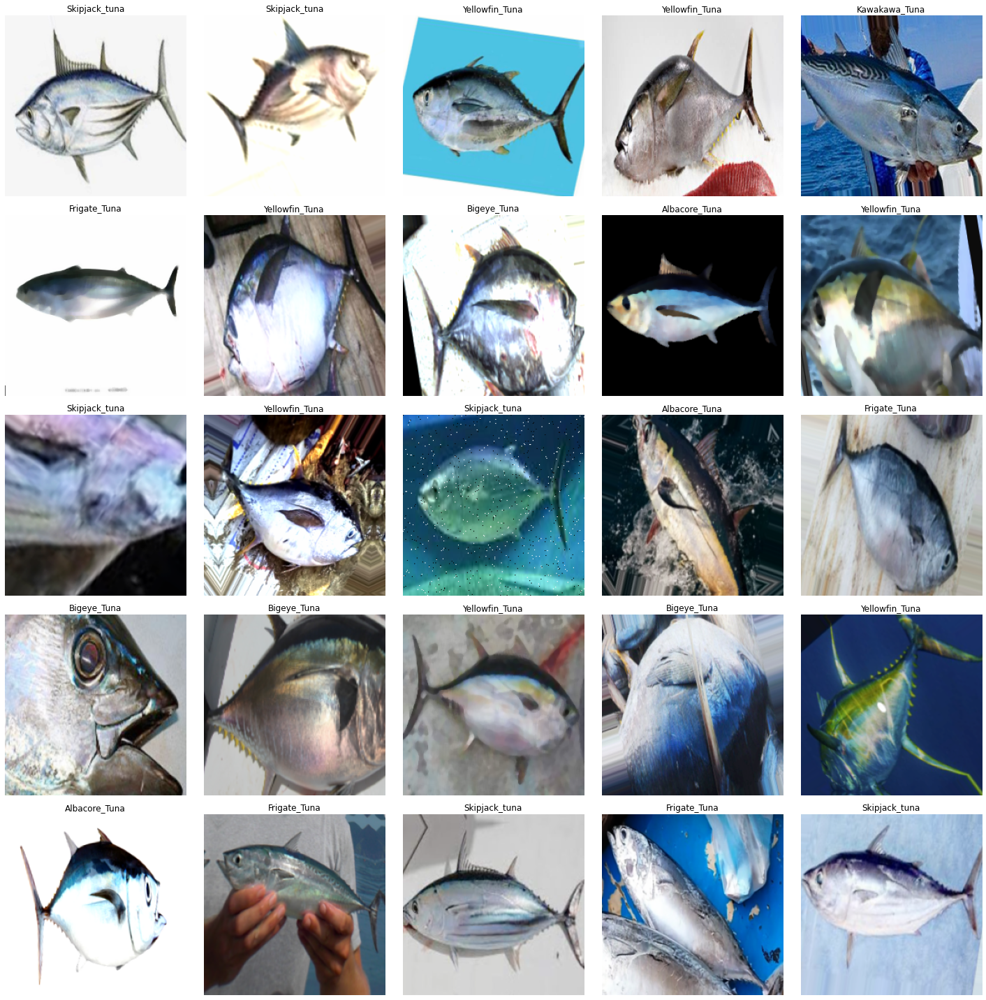

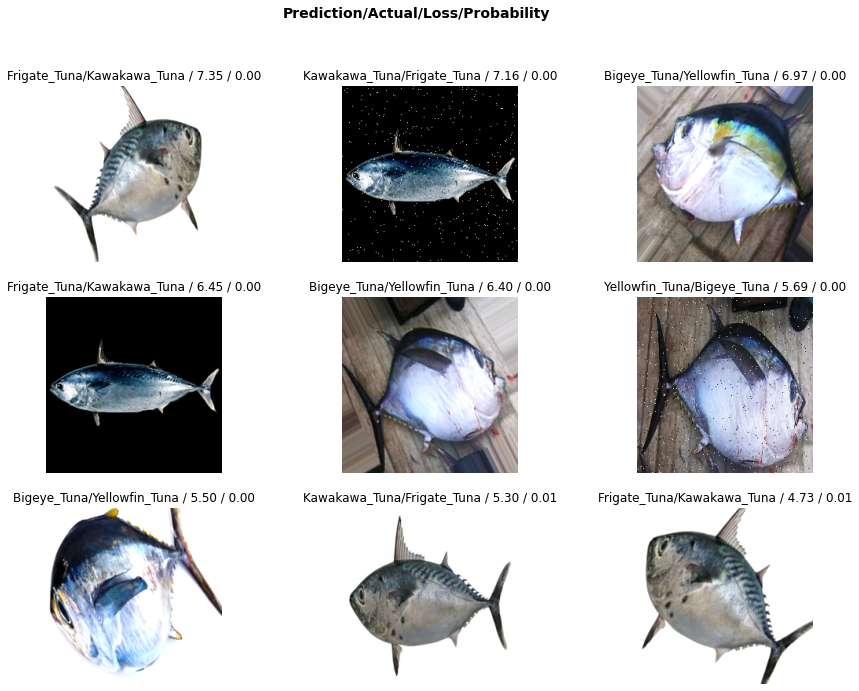

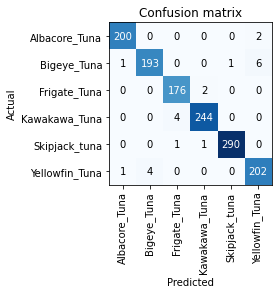

In [ ]:
#for fastai 1.0.61
!pip install split-folders tqdm
import splitfolders
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
import fastai
import cv2
from sklearn.metrics import plot_confusion_matrix
import numpy as np
import torch
import torch.nn as nn
from fastai import *
import matplotlib.pyplot as plt
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
#split the data into train, val, test
splitfolders.ratio("/content/drive/MyDrive/HACKATHON/Dataset/Tuna_Species_v2", output="Output", seed=1337, ratio=(.7,.2,.1), group_prefix=None)

print(fastai.__version__)
path=Path("./Output")
data = ImageDataBunch.from_folder(path, train='train', valid='val', ds_tfms=get_transforms(do_flip=False, p_affine=.20), size=224, bs=64, num_workers=8)
data.show_batch()

# See the classes and count of classes in your dataset
print(data.classes,data.c)
print(len(data.train_ds), len(data.valid_ds))
#learn = cnn_learner(data, models.mobilenet_v2, metrics = error_rate)
learn = cnn_learner(data, models.vgg19_bn, metrics = accuracy)
print(learn.model)
learn.fit_one_cycle(100)
#model save
model_path=Path('/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e100acc').absolute()
learn.export(model_path / 'export.pkl')
learn.save(model_path / 'export')

#interplane plotting
interp = ClassificationInterpretation.from_learner(learn)

#see if it works
'''
losses,idxs = interp.top_losses()
len(dls.valid_ds)==len(losses)==len(idxs)
interp.plot_confusion_matrix()
#upto here
'''
interp.plot_top_losses(9, figsize=(15,11))
#Confusion Matrix
#interp.plot_confusion_matrix(figsize=(12,12), dpi=60)
interp.plot_confusion_matrix()
plt.savefig('/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e100acc/plot_confusion_matrix.png')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

pathsrc = './download.png' #change your source picture path here

pathdst = "./Try/" #change your destination path here

def model():
#Loading the Trained Model
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e50acc")
	model=learn.model.eval()
	path = "/content/Output/test/Albacore_Tuna/"
	dirs = os.listdir(path)
	list1=[]
	for item in dirs:
  		if os.path.isfile(path+item):
		    img=open_image(path+item)
		    print(item)
		    img.resize(224)
		    pred=learn.predict(img)
		    cls=int(pred[1])
		    #print(pred,cls)
		    #print("Result: ")
		    '''
		    if(cls==0):
		      print("Catla")
		    elif(cls==1):
		      print("Cyprinus Carpio")
		    elif(cls==2):
		      print("Grass Carp")
		    elif(cls==3):
		      print("Mori")
		    elif(cls==4):
		      print("Rohu")
		    else:
		      print('Silver')
		    if(cls==0):
		      print("Albacore")
		    elif(cls==1):
		      print("Big Eye")
		    elif(cls==2):
		      print("Frigate")
		    elif(cls==3):
		      print("Kawakawa")
		    elif(cls==4):
		      print("Skipjack")
		    else:
		      print('Yellowfin')
		    '''
		    #print(max(pred[2]*100))
		    if (cls != 0):
		    	if(cls==0):
		      		print("Albacore")
		    	elif(cls==1):
		      		print("Big Eye")
		    	elif(cls==2):
		      		print("Frigate")
		    	elif(cls==3):
		      		print("Kawakawa")
		    	elif(cls==4):
		      		print("Skipjack")
		    	else:
		      		print('Yellowfin')
		    	print(max(pred[2]*100))
		    	time.sleep(5)
		    else :
		    	list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image
if __name__ == '__main__' :
	model()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
60blur.png
61.png_0_2578.png
63.png_0_4995.png
40.png_0_5208.png
47crop.png
82.png
27.png_0_2379.png
19.png_0_4532.png
82.png_0_3203.png
67.png_0_8952.png
82.png_0_8955.png
81.png_0_2874.png
64crop.png
98noisy.png
13noisy.png
39.png_0_7611.png
72crop.png
46.png
14.png_0_9053.png
62.png_0_3803.png
43.png_0_8212.png
81blur.png
65.png_0_9816.png
37.png_0_7552.png
64.png
41.png_0_9544.png
91noisy.png
41blur.png
76crop.png
44.png_0_3265.png
57noisy.png
26crop.png
96.png_0_732.png
50.png_0_192.png
90.png_0_5492.png
6noisy.png
12crop.png
14.png_0_1252.png
85.png_0_7894.png
69.png_0_863.png
37.png_0_2726.png
70crop.png
50.png_0_3100.png
65.png_0_9204.png
60crop.png
78.png
100.png_0_8690.png
55.png
72.png_0_9676.png
39.png_0_6848.png
88blur.png
11blur.png
72.png
65blur.png
79.png_0_2943.png
5.png_0_3747.png
29blur.png
8.png_0_3092.png
97.png_0_6187.png
84blur.png
91.p

In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

pathsrc = './download.png' #change your source picture path here

pathdst = "./Try/" #change your destination path here

def model():
#Loading the Trained Model
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e50acc")
	model=learn.model.eval()
	path = "/content/Output/test/Bigeye_Tuna/"
	dirs = os.listdir(path)
	list1=[]
	for item in dirs:
  		if os.path.isfile(path+item):
		    img=open_image(path+item)
		    print(item)
		    img.resize(224)
		    pred=learn.predict(img)
		    cls=int(pred[1])
		    #print(pred,cls)
		    #print("Result: ")
		    '''
		    if(cls==0):
		      print("Catla")
		    elif(cls==1):
		      print("Cyprinus Carpio")
		    elif(cls==2):
		      print("Grass Carp")
		    elif(cls==3):
		      print("Mori")
		    elif(cls==4):
		      print("Rohu")
		    else:
		      print('Silver')
		    if(cls==0):
		      print("Albacore")
		    elif(cls==1):
		      print("Big Eye")
		    elif(cls==2):
		      print("Frigate")
		    elif(cls==3):
		      print("Kawakawa")
		    elif(cls==4):
		      print("Skipjack")
		    else:
		      print('Yellowfin')
		    '''
		    #print(max(pred[2]*100))
		    if (cls != 1):
		    	if(cls==0):
		      		print("Albacore")
		    	elif(cls==1):
		      		print("Big Eye")
		    	elif(cls==2):
		      		print("Frigate")
		    	elif(cls==3):
		      		print("Kawakawa")
		    	elif(cls==4):
		      		print("Skipjack")
		    	else:
		      		print('Yellowfin')
		    	print(max(pred[2]*100))
		    	time.sleep(5)
		    else :
		    	list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image
if __name__ == '__main__' :
	model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Image_91blur.png
Yellowfin
tensor(63.8427)
Image_98.png_0_9900.png
Image_37.png_0_2199.png
Image_92crop.png
Image_47noisy.png
Image_39.png_0_7345.png
Image_90.png_0_4375.png
Image_12blur.png
Image_55.png_0_2141.png
Image_48.png_0_9436.png
Image_27crop.png
Image_87.png_0_966.png
Image_63.png_0_3161.png
Image_85.png_0_9864.png
Image_74.png
Image_41crop.png
Image_81crop.png
Albacore
tensor(68.1554)
Image_98noisy.png
Image_64noisy.png
Image_64.png_0_3067.png
Image_82.png_0_3711.png
Image_15.png_0_1785.png
Image_65.png_0_9540.png
Image_24.png_0_2826.png
Image_30noisy.png
Image_82.png_0_1213.png
Image_79.png_0_474.png
Image_72.png_0_1465.png
Image_50.png_0_1598.png
Image_10.png_0_8289.png
Image_5.png_0_7748.png
Image_61.png_0_7091.png
Image_37.png_0_9237.png
Skipjack
tensor(98.3315)
Image_64.png_0_4268.png
Image_2.png_0_1856.png
Image_65crop.png
Image_13crop.png
Ye

In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

pathsrc = './download.png' #change your source picture path here

pathdst = "./Try/" #change your destination path here

def model():
#Loading the Trained Model
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e50acc")
	model=learn.model.eval()
	path = "/content/Output/test/Frigate_Tuna/"
	dirs = os.listdir(path)
	list1=[]
	for item in dirs:
  		if os.path.isfile(path+item):
		    img=open_image(path+item)
		    print(item)
		    img.resize(224)
		    pred=learn.predict(img)
		    cls=int(pred[1])
		    #print(pred,cls)
		    #print("Result: ")
		    '''
		    if(cls==0):
		      print("Catla")
		    elif(cls==1):
		      print("Cyprinus Carpio")
		    elif(cls==2):
		      print("Grass Carp")
		    elif(cls==3):
		      print("Mori")
		    elif(cls==4):
		      print("Rohu")
		    else:
		      print('Silver')
		    if(cls==0):
		      print("Albacore")
		    elif(cls==1):
		      print("Big Eye")
		    elif(cls==2):
		      print("Frigate")
		    elif(cls==3):
		      print("Kawakawa")
		    elif(cls==4):
		      print("Skipjack")
		    else:
		      print('Yellowfin')
		    '''
		    #print(max(pred[2]*100))
		    if (cls != 2):
		    	if(cls==0):
		      		print("Albacore")
		    	elif(cls==1):
		      		print("Big Eye")
		    	elif(cls==2):
		      		print("Frigate")
		    	elif(cls==3):
		      		print("Kawakawa")
		    	elif(cls==4):
		      		print("Skipjack")
		    	else:
		      		print('Yellowfin')
		    	print(max(pred[2]*100))
		    	time.sleep(5)
		    else :
		    	list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image
if __name__ == '__main__' :
	model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
36.png_0_7167.png
32.png_0_8255.png
15noisy.png
62crop.png
1blur.png
83.png_0_1833.png
59noisy.png
69.png_0_868.png
51.png_0_9879.png
86blur.png
60.png_0_5379.png
13noisy.png
62blur.png
72crop.png
66.png_0_5751.png
70.png_0_3692.png
60.png_0_597.png
57.png
83blur.png
88.png
65.png_0_3042.png
43blur.png
74.png_0_9909.png
40.png_0_7092.png
30blur.png
47.png_0_7725.png
66crop.png
67.png_0_7610.png
11.png_0_1146.png
83noisy.png
43.png_0_9573.png
Kawakawa
tensor(87.2565)
43.png_0_1400.png
Kawakawa
tensor(98.1602)
52.png_0_7612.png
16.png_0_6365.png
71.png_0_1952.png
70.png_0_851.png
66.png
52.png_0_2311.png
14crop.png
8blur.png
81.png_0_6783.png
84.png_0_8638.png
38crop.png
45.png_0_8048.png
28.png_0_5841.png
84.png_0_5857.png
49crop.png
47.png_0_3380.png
74.png
20.png_0_584.png
75noisy.png
5.png_0_4975.png
11.png
13blur.png
25crop.png
67blur.png
86.png_0_9202.png

In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

pathsrc = './download.png' #change your source picture path here

pathdst = "./Try/" #change your destination path here

def model():
#Loading the Trained Model
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e50acc")
	model=learn.model.eval()
	path = "/content/Output/test/Kawakawa_Tuna/"
	dirs = os.listdir(path)
	list1=[]
	for item in dirs:
  		if os.path.isfile(path+item):
		    img=open_image(path+item)
		    print(item)
		    img.resize(224)
		    pred=learn.predict(img)
		    cls=int(pred[1])
		    #print(pred,cls)
		    #print("Result: ")
		    '''
		    if(cls==0):
		      print("Catla")
		    elif(cls==1):
		      print("Cyprinus Carpio")
		    elif(cls==2):
		      print("Grass Carp")
		    elif(cls==3):
		      print("Mori")
		    elif(cls==4):
		      print("Rohu")
		    else:
		      print('Silver')
		    if(cls==0):
		      print("Albacore")
		    elif(cls==1):
		      print("Big Eye")
		    elif(cls==2):
		      print("Frigate")
		    elif(cls==3):
		      print("Kawakawa")
		    elif(cls==4):
		      print("Skipjack")
		    else:
		      print('Yellowfin')
		    '''
		    #print(max(pred[2]*100))
		    if (cls != 3):
		    	if(cls==0):
		      		print("Albacore")
		    	elif(cls==1):
		      		print("Big Eye")
		    	elif(cls==2):
		      		print("Frigate")
		    	elif(cls==3):
		      		print("Kawakawa")
		    	elif(cls==4):
		      		print("Skipjack")
		    	else:
		      		print('Yellowfin')
		    	print(max(pred[2]*100))
		    	time.sleep(5)
		    else :
		    	list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image
if __name__ == '__main__' :
	model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
88crop.png
119.png
101.png_0_4386.png
38_multcrop.png
88.png_0_4549.png
96.png_0_538.png
111.png_0_3876.png
6.png_0_8687.png
19.png
39_mult.png_0_6610.png
69.png_0_2459.png
129.png_0_2881.png
86crop.png
20.png_0_5307.png
96crop.png
89crop.png
19noisy.png
35_mult.png_0_7090.png
38_mult.png_0_906.png
82.png_0_615.png
2noisy.png
Frigate
tensor(88.8142)
46.png_0_6997.png
107.png_0_8304.png
9.png_0_2980.png
5.png_0_4698.png
106.png_0_8652.png
130.png_0_7924.png
44.png_0_3415.png
120crop.png
35_mult.png_0_9748.png
81.png_0_358.png
124.png_0_526.png
48noisy.png
138.png_0_1457.png
31.png_0_847.png
3.png
127.png_0_2850.png
109.png_0_6342.png
141.png_0_6316.png
92crop.png
135crop.png
19.png_0_1438.png
24.png_0_9632.png
102.png_0_1438.png
128.png_0_6726.png
56crop.png
139.png_0_3080.png
130.png_0_6066.png
132.png_0_844.png
14blur.png
31.png_0_9125.png
104blur.png
4.png_

In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

pathsrc = './download.png' #change your source picture path here

pathdst = "./Try/" #change your destination path here

def model():
#Loading the Trained Model
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e50acc")
	model=learn.model.eval()
	path = "/content/Output/test/Skipjack_tuna/"
	dirs = os.listdir(path)
	list1=[]
	for item in dirs:
  		if os.path.isfile(path+item):
		    img=open_image(path+item)
		    print(item)
		    img.resize(224)
		    pred=learn.predict(img)
		    cls=int(pred[1])
		    #print(pred,cls)
		    #print("Result: ")
		    '''
		    if(cls==0):
		      print("Catla")
		    elif(cls==1):
		      print("Cyprinus Carpio")
		    elif(cls==2):
		      print("Grass Carp")
		    elif(cls==3):
		      print("Mori")
		    elif(cls==4):
		      print("Rohu")
		    else:
		      print('Silver')
		    if(cls==0):
		      print("Albacore")
		    elif(cls==1):
		      print("Big Eye")
		    elif(cls==2):
		      print("Frigate")
		    elif(cls==3):
		      print("Kawakawa")
		    elif(cls==4):
		      print("Skipjack")
		    else:
		      print('Yellowfin')
		    '''
		    #print(max(pred[2]*100))
		    if (cls != 4):
		    	if(cls==0):
		      		print("Albacore")
		    	elif(cls==1):
		      		print("Big Eye")
		    	elif(cls==2):
		      		print("Frigate")
		    	elif(cls==3):
		      		print("Kawakawa")
		    	elif(cls==4):
		      		print("Skipjack")
		    	else:
		      		print('Yellowfin')
		    	print(max(pred[2]*100))
		    	time.sleep(5)
		    else :
		    	list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image
if __name__ == '__main__' :
	model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
i37blur.png
137.png_0_8188.png
171noisy.png
i8.png_0_9045.png
136crop.png
i84blur.png
i23.png
i29.png_0_204.png
i117.png_0_1333.png
i60blur.png
157.png_0_4927.png
i71.png_0_2533.png
166crop.png
135.png_0_4828.png
180.png_0_3449.png
189.png_0_5855.png
127noisy.png
i7.png_0_9825.png
137.png_0_6428.png
i49.png_0_1654.png
169.png_0_4044.png
i51.png_0_5360.png
i83.png_0_8948.png
i107.png_0_1773.png
140.png_0_2690.png
139crop.png
i14.png_0_5284.png
142.png_0_7885.png
i68.png_0_9771.png
i87.png_0_5248.png
i70.png_0_1409.png
i3noisy.png
i44crop.png
i69.png_0_7293.png
i70.png_0_7388.png
168.png_0_8101.png
185.png_0_6543.png
135crop.png
i97.png_0_9957.png
160.png_0_8453.png
i81crop.png
i77blur.png
140.png_0_6736.png
i71crop.png
i41.png_0_4822.png
i98.png_0_8305.png
i48blur.png
i16.png_0_225.png
i60.png_0_2456.png
i55.png_0_2610.png
i110blur.png
178.png_0_6555.png
191.p

In [ ]:
!nvidia-smi

Sat Mar 19 07:09:23 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    27W /  70W |   4082MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
#FOR DETECTION ############################

import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

pathsrc = './download.png' #change your source picture path here

pathdst = "./Try/" #change your destination path here

def model():
#Loading the Trained Model
	learn=load_learner("/content/drive/MyDrive/HACKATHON/Models/tunav2vgg19e50acc")
	model=learn.model.eval()
	path = "/content/Output/test/Yellowfin_Tuna/"
	dirs = os.listdir(path)
	list1=[]
	for item in dirs:
  		if os.path.isfile(path+item):
		    img=open_image(path+item)
		    print(item)
		    img.resize(224)
		    pred=learn.predict(img)
		    cls=int(pred[1])
		    #print(pred,cls)
		    #print("Result: ")
		    '''
		    if(cls==0):
		      print("Catla")
		    elif(cls==1):
		      print("Cyprinus Carpio")
		    elif(cls==2):
		      print("Grass Carp")
		    elif(cls==3):
		      print("Mori")
		    elif(cls==4):
		      print("Rohu")
		    else:
		      print('Silver')
		    if(cls==0):
		      print("Albacore")
		    elif(cls==1):
		      print("Big Eye")
		    elif(cls==2):
		      print("Frigate")
		    elif(cls==3):
		      print("Kawakawa")
		    elif(cls==4):
		      print("Skipjack")
		    else:
		      print('Yellowfin')
		    '''
		    #print(max(pred[2]*100))
		    if (cls != 5):
		    	if(cls==0):
		      		print("Albacore")
		    	elif(cls==1):
		      		print("Big Eye")
		    	elif(cls==2):
		      		print("Frigate")
		    	elif(cls==3):
		      		print("Kawakawa")
		    	elif(cls==4):
		      		print("Skipjack")
		    	else:
		      		print('Yellowfin')
		    	print(max(pred[2]*100))
		    	time.sleep(5)
		    else :
		    	list1.append(max(pred[2]*100))
		    #img
	avgscore = sum(list1) / len(dirs)
	print("Average score:", avgscore)    
    # Read image
if __name__ == '__main__' :
	model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
13.png_0_6856.png
60blur.png
3.png_0_6719.png
92.png_0_7678.png
46.png_0_1722.png
64.png_0_3246.png
19.png
86crop.png
97crop.png
80.png_0_7372.png
81.png_0_8194.png
75.png_0_9545.png
86blur.png
9.png_0_1948.png
46.png_0_4719.png
66noisy.png
37_1crop.png
50.png_0_5390.png
20.png_0_7105.png
71.png_0_4527.png
57.png_0_9883.png
90noisy.png
5.png_0_3639.png
99.png_0_6378.png
79noisy.png
72.png_0_1697.png
81.png_0_4066.png
50.png_0_9714.png
95.png_0_8499.png
69.png_0_8163.png
26.png_0_1814.png
65.png
92.png_0_4928.png
81.png_0_4036.png
59.png_0_6805.png
86.png_0_4232.png
27.png_0_4907.png
100.png_0_522.png
Albacore
tensor(87.8977)
69blur.png
39.png_0_534.png
35.png_0_6357.png
15.png_0_9492.png
74.png_0_3091.png
57.png_0_7701.png
55.png_0_4237.png
63.png_0_7746.png
59_1.png_0_9099.png
45blur.png
39.png_0_7736.png
64.png_0_3887.png
84crop.png
9.png_0_8608.png
13crop.

In [ ]:
Avg_score = (99.1030 + 93.4638 + 95.2090 + 97.5437 + 97.9846 + 96.1059) / 6
print(Avg_score)

96.56833333333333


#ML Model

In [ ]:
from google.colab import drive
import warnings
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
import os
import tensorflow as tf

from sklearn import preprocessing
from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import batch_normalization
import seaborn as sns
from keras.applications.resnet import ResNet50
drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
!pip3 install split-folders tqdm
import splitfolders  # or import split_folders
#splitfolders.ratio("/content/drive/MyDrive/HACKATHON/Dataset/Tuna_Species_v2", output="Output_Main", seed=1337, ratio=(.7,.2,.1), group_prefix=None) # default values

train_images = []
train_labels = []
for path in glob.glob("/content/Output_Main/train/*"):
  label = path.split("\\")[-1]
  #print(label)
  for img_path in glob.glob(os.path.join(path, "*.png")):
    #print(img_path)
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224,224))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    train_images.append(img)
    train_labels.append(label)
train_images = np.array(train_images)
train_labels = np.array(train_labels)

val_images = []
val_labels = []
for path in glob.glob("/content/Output_Main/val/*"):
  label = path.split("\\")[-1]
  #print(label)
  for img_path in glob.glob(os.path.join(path, "*.png")):
    #print(img_path)
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224,224))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    val_images.append(img)
    val_labels.append(label)
val_images = np.array(val_images)
val_labels = np.array(val_labels)

test_images = []
test_labels = []
for path in glob.glob("/content/Output_Main/test/*"):
  label = path.split("\\")[-1]
  #print(label)
  for img_path in glob.glob(os.path.join(path, "*.png")):
    #print(img_path)
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224,224))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    test_images.append(img)
    test_labels.append(label)
test_images = np.array(test_images)
test_labels = np.array(test_labels)

le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)
le.fit(val_labels)
val_labels_encoded = le.transform(val_labels)
le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)


x_train, y_train, x_val, y_val, x_test, y_test = train_images, train_labels_encoded, val_images, val_labels_encoded, test_images, test_labels_encoded

x_train, x_val, x_test = x_train / 255.0, x_val / 255.0, x_test / 255.0
resnet_model =  ResNet50(weights = "imagenet", include_top = False, input_shape = (224,224,3))
for layer in resnet_model.layers:
  layer.trainable = False
resnet_model.summary()

feature_extractor = resnet_model.predict(x_train)
features = feature_extractor.reshape(feature_extractor[0], -1)
x_for_training  = features

from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators = 50, random_state = 42)
model.fit(x_for_training, y_train)

x_val_feature = resnet_model(x_val)
x_val_features = x_val_feature.reshape(feature_extractor[0], -1)

prediction = model.predict(x_val_features)
prediction = le.inverse_transform(prediction)

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(val_labels, prediction)
sns.heatmap(cm, annot = True)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                            

In [ ]:

#for a few selected images

n= np.random.randint(0, x_test.shape[0])
img = x_test[n]
plt.imshow(img)
input_img = np.expand_dims(img, axis = 0)
input_img_feature = resnet_model.predict(input_img)
input_img_features = input_img_feature.reshape(input_img_feature[0], -1)
prediction = model.prediction(input_img_features)[0]
prediction = le.inverse_transform([prediction])
print("the prediction on the image:", prediction)
print("the actual label:", test_labels[n])


# ML MODEL

In [ ]:
from google.colab import drive
import warnings
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import time
import pickle

from sklearn import preprocessing
from tensorflow.keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
#from keras.layers.normalization import batch_normalization
from tensorflow.keras.layers import BatchNormalization
import seaborn as sns
from tensorflow.keras.applications.resnet50 import ResNet50
drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)
!pip3 install split-folders tqdm
import splitfolders  # or import split_folders
splitfolders.ratio("/content/drive/MyDrive/HACKATHON/Dataset/Tuna_Species_v2", output="Output_Main", seed=1337, ratio=(.7,.2,.1), group_prefix=None) # default values
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm

train_images = []
train_labels = []
for path in glob.glob("Output_Main/train/*"):
  label = path.split("\\")[-1]
  print(label)
  for img_path in glob.glob(os.path.join(path, "*.png")):
    #print(img_path)
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224,224))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    train_images.append(img)
    train_labels.append(label)
train_images = np.array(train_images)
train_labels = np.array(train_labels)

val_images = []
val_labels = []
for path in glob.glob("Output_Main/val/*"):
  label = path.split("\\")[-1]
  print(label)
  for img_path in glob.glob(os.path.join(path, "*.png")):
    #print(img_path)
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224,224))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    val_images.append(img)
    val_labels.append(label)
val_images = np.array(val_images)
val_labels = np.array(val_labels)

test_images = []
test_labels = []
for path in glob.glob("Output_Main/test/*"):
  label = path.split("\\")[-1]
  print(label)
  for img_path in glob.glob(os.path.join(path, "*.png")):
    #print(img_path)
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224,224))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    test_images.append(img)
    test_labels.append(label)
test_images = np.array(test_images)
test_labels = np.array(test_labels)

le = preprocessing.LabelEncoder()
le.fit(test_labels)
test_labels_encoded = le.transform(test_labels)
le.fit(val_labels)
val_labels_encoded = le.transform(val_labels)
le.fit(train_labels)
train_labels_encoded = le.transform(train_labels)


x_train, y_train, x_val, y_val, x_test, y_test = train_images, train_labels_encoded, val_images, val_labels_encoded, test_images, test_labels_encoded

x_train, x_val, x_test = x_train / 255.0, x_val / 255.0, x_test / 255.0
print(x_train.shape)
resnet_model =  ResNet50(weights = "imagenet", include_top = False, input_shape = (224,224,3))
for layer in resnet_model.layers:
  layer.trainable = False
resnet_model.summary()

#Feature Extractor part Resnet50 network

feature_extractor = resnet_model.predict(x_train)
features = feature_extractor.reshape(feature_extractor.shape[0], -1)
x_for_training  = features

#ML Model
model_rf = RandomForestClassifier(n_estimators = 1000, random_state = 42)
model_xg = XGBClassifier()
model_dt = DecisionTreeClassifier(random_state=0)
model_svm = svm.SVC()

model_rf.fit(x_for_training, y_train)
print("random forest train fit DONE!")

#Testing on Val
x_val_feature = resnet_model.predict(x_val)
x_val_features = x_val_feature.reshape(x_val_feature.shape[0], -1)
prediction = model_rf.predict(x_val_features)
prediction = le.inverse_transform(prediction)
print("Accuracy:", metrics.accuracy_score(val_labels, prediction))
cm = confusion_matrix(val_labels, prediction)
cv2.imwrite("val_rf.png", cm)
sns.heatmap(cm, annot = True)
print("random forest val DONE!")
#Testing on Test Set
x_test_feature = resnet_model.predict(x_test)
x_test_features = x_test_feature.reshape(x_test_feature.shape[0], -1)
prediction = model_rf.predict(x_test_features)
prediction = le.inverse_transform(prediction)
print("Test Accuracy:", metrics.accuracy_score(test_labels, prediction))
cm = confusion_matrix(test_labels, prediction)
cv2.imwrite("test_rf.png", cm)
sns.heatmap(cm, annot = True)
print("random forest test DONE!")

print("Saving RF model")
filename = 'model_rf.sav'
pickle.dump(model_rf, open(filename, 'wb'))

model_xg.fit(x_for_training, y_train)
print("Xgboost train fit DONE!")

#Testing on Val
x_val_feature = resnet_model.predict(x_val)
x_val_features = x_val_feature.reshape(x_val_feature.shape[0], -1)
prediction = model_xg.predict(x_val_features)
prediction = le.inverse_transform(prediction)
print("Accuracy:", metrics.accuracy_score(val_labels, prediction))
cm = confusion_matrix(val_labels, prediction)
cv2.imwrite("val_xg.png", cm)
sns.heatmap(cm, annot = True)
print("xgboost val DONE!")

#Testing on Test Set
x_test_feature = resnet_model.predict(x_test)
x_test_features = x_test_feature.reshape(x_test_feature.shape[0], -1)
prediction = model_xg.predict(x_test_features)
prediction = le.inverse_transform(prediction)
print("Test Accuracy:", metrics.accuracy_score(test_labels, prediction))
cm = confusion_matrix(test_labels, prediction)
cv2.imwrite("test_xg.png", cm)
sns.heatmap(cm, annot = True)
print("xgboost test DONE!")

print("Saving XG model")
filename = 'model_xg.sav'
pickle.dump(model_xg, open(filename, 'wb'))

model_dt.fit(x_for_training, y_train)
print("decision tree train fit DONE!")

#Testing on Val
x_val_feature = resnet_model.predict(x_val)
x_val_features = x_val_feature.reshape(x_val_feature.shape[0], -1)
prediction = model_dt.predict(x_val_features)
prediction = le.inverse_transform(prediction)
print("Accuracy:", metrics.accuracy_score(val_labels, prediction))
cm = confusion_matrix(val_labels, prediction)
cv2.imwrite("val_dt.png", cm)
sns.heatmap(cm, annot = True)
print("decision tree val DONE!")

#Testing on Test Set
x_test_feature = resnet_model.predict(x_test)
x_test_features = x_test_feature.reshape(x_test_feature.shape[0], -1)
prediction = model_dt.predict(x_test_features)
prediction = le.inverse_transform(prediction)
print("Test Accuracy:", metrics.accuracy_score(test_labels, prediction))
cm = confusion_matrix(test_labels, prediction)
cv2.imwrite("test_dt.png", cm)
sns.heatmap(cm, annot = True)
print("decision tree test DONE!")

print("Saving DT model")
filename = 'model_dt.sav'
pickle.dump(model_dt, open(filename, 'wb'))

model_svm.fit(x_for_training, y_train)
print("Svm train fit DONE!")

#Testing on Val
x_val_feature = resnet_model.predict(x_val)
x_val_features = x_val_feature.reshape(x_val_feature.shape[0], -1)
prediction = model_svm.predict(x_val_features)
prediction = le.inverse_transform(prediction)
print("Accuracy:", metrics.accuracy_score(val_labels, prediction))
cm = confusion_matrix(val_labels, prediction)
cv2.imwrite("val_svm.png", cm)
sns.heatmap(cm, annot = True)
print("Svm val DONE!")

#Testing on Test Set
x_test_feature = resnet_model.predict(x_test)
x_test_features = x_test_feature.reshape(x_test_feature.shape[0], -1)
prediction = model_svm.predict(x_test_features)
prediction = le.inverse_transform(prediction)
print("Test Accuracy:", metrics.accuracy_score(test_labels, prediction))
cm = confusion_matrix(test_labels, prediction)
cv2.imwrite("test_svm.png", cm)
sns.heatmap(cm, annot = True)
print("Svm test DONE!")

print("Saving SVM model")
filename = 'model_svm.sav'
pickle.dump(model_svm, open(filename, 'wb'))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Copying files: 6649 files [01:45, 62.84 files/s] 


Output_Main/train/Bigeye_Tuna
Output_Main/train/Frigate_Tuna
Output_Main/train/Albacore_Tuna
Output_Main/train/Yellowfin_Tuna
Output_Main/train/Kawakawa_Tuna
Output_Main/train/Skipjack_tuna
Output_Main/val/Bigeye_Tuna
Output_Main/val/Frigate_Tuna
Output_Main/val/Albacore_Tuna
Output_Main/val/Yellowfin_Tuna
Output_Main/val/Kawakawa_Tuna
Output_Main/val/Skipjack_tuna
Output_Main/test/Bigeye_Tuna
Output_Main/test/Frigate_Tuna
Output_Main/test/Albacore_Tuna
Output_Main/test/Yellowfin_Tuna
Output_Main/test/Kawakawa_Tuna
Output_Main/test/Skipjack_tuna
(4653, 224, 224, 3)
94781440/94765736 [==============================] - 2s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]              

# Test on Random Images from ONLINE

In [ ]:
import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

def model():
  learn = load_learner("/content/drive/MyDrive/HACKATHON/Models/shrimp_Mobilenetv2e30acc")
  model = learn.model.eval()
  path = "/content/white_shrimp_cut1.png"
  img = open_image(path)
  img.resize(224)
  pred = learn.predict(img)
  cls = pred[1]
  if (cls == 0):
    print("Albacore Tuna")
  if (cls == 1):
    print("Bigeye Tuna")
  if (cls == 2):
    print("Flower Prawn")
  if (cls == 3):
    print("Frigate Tuna")
  if (cls == 4):
    print("Kawakawa Tuna")
  if (cls == 5):
    print("Skipjack Tuna")
  if (cls == 6):
    print("Tiger Prawn")
  if (cls == 7):
    print("White Prawn")
  if (cls == 8):
    print("YellowFin Tuna")
  print(max(pred[2]*100))
if __name__ == '__main__':
  model()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


FileNotFoundError: ignored

In [ ]:
import fastai; fastai.__version__
from fastai.vision import *
from fastai.metrics import error_rate, accuracy
from fastai.callbacks.hooks import *
import os
import cv2
import numpy as np
import warnings
import time
from google.colab import drive

drive.mount('/content/drive')
warnings.filterwarnings("ignore", category=FutureWarning)

learn = load_learner("/content/drive/MyDrive/HACKATHON/Models/shrimp_Mobilenetv2e30acc")
model = learn.model.eval()
path = "/content/drive/MyDrive/HACKATHON/Dataset/shrimp_test_cut/wp7.jpg"
img = open_image(path)
img.resize(224)
pred = learn.predict(img)
cls = pred[1]
if (cls == 0):
  print("Flower Prawn")
elif (cls == 1):
  print("Tiger Prawn")
elif (cls == 2):
  print("White Prawn")
print(max(pred[2]*100))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
White Prawn
tensor(52.4962)


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3680: UserWarning: The default behavior for interpolate/upsample with float scale_factor changed in 1.6.0 to align with other frameworks/libraries, and now uses scale_factor directly, instead of relying on the computed output size. If you wish to restore the old behavior, please set recompute_scale_factor=True. See the documentation of nn.Upsample for details. 
  "The default behavior for interpolate/upsample with float scale_factor changed "


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:1025: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


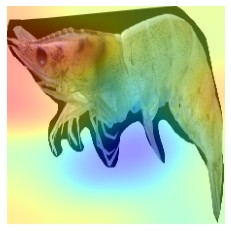

In [ ]:
b, _ =learn.data.one_item(img,denorm=False)
with hook_output(model[0]) as hook_a:
  with hook_output(model[0],grad=True) as hook_g:
    preds=model(b)
    preds[0,cls].backward()
acts=hook_a.stored[0].cpu()
grad=hook_g.stored[0][0].cpu()
grad_chan=grad.mean(1).mean(1)
mult=((acts*grad_chan[..., None, None])).sum(0)
_, ax=plt.subplots()
img.show(ax)
ax.imshow(mult, alpha=0.4, extent=(0,224,224,0), interpolation='bicubic', cmap='jet')

#YOLOV5 CUSTOM DATASET


In [ ]:
!git clone https://github.com/ultralytics/yolov5
!cd "/content/yolov5"
!pip install -r "/content/yolov5/requirements.txt"

fatal: destination path 'yolov5' already exists and is not an empty directory.
     |████████████████████████████████| 596 kB 4.9 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
import torch
import os
from IPython.display import Image, clear_output
#print(f"Setup Complete. Using Torch {torch.__version__} ({torch.cuda.get_device_})" )